In [ ]:
# IMPORTING LIBRARIES

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Installing catboost
!pip install catboost

In [5]:
#Importing necessary libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from catboost import CatBoostRegressor 
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import TimeSeriesSplit
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path


# LOADING TRAIN AND TEST DATA

In [6]:
from pathlib import Path
import pandas as pd

# Listing the path of 14 Tanzanian stocks for training and test data
base_dir_train = Path("C:/Users/aisha/OneDrive/Desktop/DSE")
stock_files_train = {
    'AFRIPRISE': base_dir_train / "Afriprise.csv",
    'CRDB': base_dir_train / "CRDB.csv",
    'DCB': base_dir_train / "DCB.csv",
    'MBP': base_dir_train / "Maendeleo.csv",
    'MCB': base_dir_train / "Mwalimucommercial.csv",
    'NICO': base_dir_train / "Nationalinvestments.csv",
    'NMB': base_dir_train / "NMB.csv",
    'SWIS': base_dir_train / "Swissport.csv",
    'TCCL': base_dir_train / "Tanga Cement.csv",
    'TPCC': base_dir_train / "Tanzania Portland Cement.csv",
    'TCC': base_dir_train / "TanzaniaCigarette.csv",
    'TTP': base_dir_train / "Tatepa.csv",
    'TBL': base_dir_train / "TBL.csv",
    'TOL': base_dir_train / "TolGases.csv",
}

base_dir_test = Path("C:/Users/aisha/OneDrive/Desktop/DSE UNSEEN")
stock_files_test = {
    'AFRIPRISE': base_dir_test / "AFRIPRISE.csv",
    'CRDB': base_dir_test / "CRDB.csv",
    'DCB': base_dir_test / "DCB.csv",
    'MBP': base_dir_test / "MBP.csv",
    'MCB': base_dir_test / "MCB.csv",
    'NICO': base_dir_test / "NICO.csv",
    'NMB': base_dir_test / "NMB.csv",
    'SWIS': base_dir_test / "SWIS.csv",
    'TCCL': base_dir_test / "TCCL.csv",
    'TPCC': base_dir_test / "TPCC.csv",
    'TCC': base_dir_test / "TCC.csv",
    'TTP': base_dir_test / "TTP.csv",
    'TBL': base_dir_test / "TBL.csv",
    'TOL': base_dir_test / "TOL.csv",
}

# Loading and converting all stock data to DataFrames
def load_and_convert_to_dataframe(stock_files):
    stock_data = {}
    for stock, file_path in stock_files.items():
        try:
            # Load data from CSV
            df = pd.read_csv(file_path)
            
            # Check if the loaded data is already a DataFrame (optional, as read_csv always returns DataFrame)
            stock_data[stock] = df
            print(f"Loaded data for {stock} successfully. Data type: {type(df)}")
        
        except Exception as e:
            print(f"Error loading data for {stock}: {e}")
            stock_data[stock] = None  # Store None if loading fails
    
    return stock_data


# Checking the keys and the first few rows of each DataFrame for training data
print('loading training dataset')
all_stock_data = load_and_convert_to_dataframe(stock_files_train)
for stock, df in all_stock_data.items():
    print(f"\n{stock} Data:")
    print(df.head())
    print("Data types:", df.dtypes)
    print("Summary statistics:")
    print(df.describe())
    print("Null values in each column:")
    print(df.isnull().sum())

# Checking the keys and the first few rows of each DataFrame for unseen data
print('loading testing dataset')
unseen_stock_data = load_and_convert_to_dataframe(stock_files_test)
for stock, df in unseen_stock_data.items():
    print(f"\n{stock} Data:")
    print(df.head())
    print("Data types:", df.dtypes)
    print("Summary statistics:")
    print(df.describe())
    print("Null values in each column:")
    print(df.isnull().sum())


loading training dataset
Loaded data for AFRIPRISE successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for CRDB successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for DCB successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for MBP successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for MCB successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for NICO successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for NMB successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for SWIS successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for TCCL successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for TPCC successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for TCC successfully. Data type: <class 'pandas.core.frame.DataFrame'>
Loaded data for TTP successfully. Data type: <class

# DATA PRE-PROCESSING ON TRAINING AND TEST DATA

In [13]:
# Pre processing 
# Function to drop the 'Change %' column
def drop_column(df):
    if 'Change %' in df.columns:
        df = df.drop(columns=['Change %'])
    return df

# Function to convert 'Vol.' column to numeric
def convert_volume_to_numeric(df):
    def parse_volume(x):
        """Convert volume values in K (thousands), M (millions), or integer format to numeric."""
        if isinstance(x, str):
            x = x.strip().upper()  # Remove any leading/trailing spaces and convert to uppercase
            if 'K' in x:
                return float(x.replace('K', '').replace(',', '')) * 1000  # Convert K to numeric
            elif 'M' in x:
                return float(x.replace('M', '').replace(',', '')) * 1000000  # Convert M to numeric
            else:
                try:
                    return float(x.replace(',', ''))  # If it's just a number, remove commas and convert to float
                except ValueError:
                    return None  # In case it's not a valid number
        else:
            return pd.to_numeric(x, errors='coerce')  # For non-string values, coerce to numeric
    
    # Keeping 'Vol.' column and convert it to numeric
    df['Vol.'] = df['Vol.'].apply(parse_volume)  # Convert 'Vol.' to numeric
    return df

def standardize_data_types(df):
    # Coercing columns to numeric where appropriate
    numeric_columns = ['Price', 'Open', 'High', 'Low', 'Vol.']  # List the numeric columns
    
    # Remove commas from numeric columns before conversion
    for col in numeric_columns:
        if col in df.columns:
            df[col] = df[col].replace({',': ''}, regex=True)  # Remove commas
            df[col] = pd.to_numeric(df[col], errors='coerce')  # Convert to numeric and handle errors
    
    return df

# Function to convert 'Date' column to datetime format
def convert_date_to_datetime(df):
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    return df
    
# Function to handle missing data (e.g., fill missing values using interpolation only for 'Vol.' column)
def handle_missing_data(df):
    # Interpolate only the 'Vol.' column
    if 'Vol.' in df.columns:
        df['Vol.'] = df['Vol.'].interpolate(method='linear', limit_direction='both')
    
    return df

# Main function to load and preprocess all stock data
def load_and_preprocess_stock_data(stock_files):
    stock_data = {}
    for stock, file_path in stock_files.items():
        try:
            # Loading the data
            df = pd.read_csv(file_path)
            
            # Standardize columns and data types
            df = convert_volume_to_numeric(df)  # Convert 'Vol.' to numeric
            df = standardize_data_types(df)  # Ensure correct data types for other columns
            df = convert_date_to_datetime(df) # Ensure date is in correct date format
            df = handle_missing_data(df)  # Handle missing values
            df = drop_column(df)  # Drop 'Change %' column
            
            stock_data[stock] = df
            print(f"Loaded and preprocessed data for {stock} successfully.")
        except Exception as e:
            print(f"Error loading data for {stock}: {e}")
    return stock_data


# Loading and preprocessing all stock data
print('loading preprocessed training dataset')
all_stock_data = load_and_preprocess_stock_data(stock_files_train)
# Checking the keys and the first few rows of each DataFrame
for stock, df in all_stock_data.items():
    print(f"\n{stock} Data:")
    print("Data types after preprocessing:")
    print(df.dtypes)
    print("Null values after handling:")
    print(df.isnull().sum())
    print(f"Shape of the DataFrame: {df.shape}")
    
print('loading preprocessed testing dataset')
unseen_stock_data = load_and_preprocess_stock_data(stock_files_test)
for stock, df in unseen_stock_data.items():
    print(f"\n{stock} Data:")
    print("Data types after preprocessing:")
    print(df.dtypes)
    print("Null values after handling:")
    print(df.isnull().sum())
    print(f"Shape of the DataFrame: {df.shape}")


loading preprocessed training dataset
Loaded and preprocessed data for AFRIPRISE successfully.
Loaded and preprocessed data for CRDB successfully.
Loaded and preprocessed data for DCB successfully.
Loaded and preprocessed data for MBP successfully.
Loaded and preprocessed data for MCB successfully.
Loaded and preprocessed data for NICO successfully.
Loaded and preprocessed data for NMB successfully.
Loaded and preprocessed data for SWIS successfully.
Loaded and preprocessed data for TCCL successfully.
Loaded and preprocessed data for TPCC successfully.
Loaded and preprocessed data for TCC successfully.
Loaded and preprocessed data for TTP successfully.
Loaded and preprocessed data for TBL successfully.
Loaded and preprocessed data for TOL successfully.

AFRIPRISE Data:
Data types after preprocessing:
Date     datetime64[ns]
Price           float64
Open            float64
High            float64
Low             float64
Vol.            float64
dtype: object
Null values after handling:
Da

# FEATURE ENGINEERING ON TRAINING AND TEST DATA

In [18]:
# Feature engineering function 
def feature_engineering(df):
   
    # Calculating Daily Returns
    df['Daily Return'] = df['Price'].pct_change()

    # Calculating 5, 10 and 20 days  Moving Averages for Price
    df['MA_5'] = df['Price'].rolling(window=5).mean()
    df['MA_10'] = df['Price'].rolling(window=10).mean()
    df['MA_20'] = df['Price'].rolling(window=20).mean()

    # Calculating mid, upper and lower Bollinger Bands for Price
    df['Bollinger_Mid'] = df['Price'].rolling(window=20).mean()
    df['Bollinger_Upper'] = df['Bollinger_Mid'] + 2 * df['Price'].rolling(window=20).std()
    df['Bollinger_Lower'] = df['Bollinger_Mid'] - 2 * df['Price'].rolling(window=20).std()

    # Calculating  Volatility (rolling standard deviation for Price)
    df['Volatility'] = df['Price'].rolling(window=10).std()

    # Calculating RSI (Relative Strength Index) for Price
    delta = df['Price'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

   
    # Adding  1-day lagged features
    df['Price_Lag_1'] = df['Price'].shift(1)
    df['Return_Lag_1'] = df['Daily Return'].shift(1)
    df['MA_5_Lag_1'] = df['MA_5'].shift(1)
    df['MA_10_Lag_1'] = df['MA_10'].shift(1)
    df['MA_20_Lag_1'] = df['MA_20'].shift(1)

    # Calculating  ATR (Average True Range)
    df['High-Low'] = df['High'] - df['Low']
    df['High-Close'] = (df['High'] - df['Price'].shift(1)).abs()
    df['Low-Close'] = (df['Low'] - df['Price'].shift(1)).abs()
    
    df['True Range'] = df[['High-Low', 'High-Close', 'Low-Close']].max(axis=1)
    df['ATR'] = df['True Range'].rolling(window=7).mean()

    # Filling  missing values for numeric columns only
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    df[numeric_cols] = df[numeric_cols].interpolate(method='linear',limit_direction='both')

    # Dropping any remaining NaN values
   
    # Defining  feature columns 
    feature_columns = ['Date', 'Price',
                       'Daily Return', 
                       'MA_5', 'MA_10','MA_20',  
                      'Bollinger_Mid', 'Bollinger_Upper', 'Bollinger_Lower',  'Volatility', 
                        'Return_Lag_1', 
                        'RSI','ATR',
                        'MA_5_Lag_1', 'MA_10_Lag_1', 'MA_20_Lag_1','Price_Lag_1'
    ]
    
    
    df = df[feature_columns]
    df = df.dropna()


    return df

# Applying  feature engineering to all stock data directly in all_stock_data
print(' Feature engineering for training data')
for stock, df in all_stock_data.items():
    # Apply feature engineering
    all_stock_data[stock] = feature_engineering(df)

# Displaying  the first few rows for each stock with clear stock names
for stock, df in all_stock_data.items():
    print(f"\n{stock} Data after Feature Engineering:")
    print(df.head())  # Display the first few rows of the DataFrame
    print(f"Shape: {df.shape}")  # Show the shape of the DataFrame
    print('Total null values:')
    print(df.isnull().sum())

print(' Feature engineering for test data')
for stock, df in unseen_stock_data.items():
    # Apply feature engineering
    unseen_stock_data[stock] = feature_engineering(df)

# Displaying  the first few rows for each stock with clear stock names
for stock, df in unseen_stock_data.items():
    print(f"\n{stock} Data after Feature Engineering:")
    print(df.head())  # Display the first few rows of the DataFrame
    print(f"Shape: {df.shape}")  # Show the shape of the DataFrame
    print('Total null values:')
    print(df.isnull().sum())


 Feature engineering for training data

AFRIPRISE Data after Feature Engineering:
        Date  Price  Daily Return   MA_5  MA_10   MA_20  Bollinger_Mid  \
0 2024-11-29  235.0      0.000000  235.0  235.5  237.25         237.25   
1 2024-11-28  235.0      0.000000  235.0  235.5  237.25         237.25   
2 2024-11-26  240.0      0.021277  235.0  235.5  237.25         237.25   
3 2024-11-25  230.0     -0.041667  235.0  235.5  237.25         237.25   
4 2024-11-22  235.0      0.021739  235.0  235.5  237.25         237.25   

   Bollinger_Upper  Bollinger_Lower  Volatility  Return_Lag_1   RSI       ATR  \
0       243.298053       231.201947    2.838231      0.000000  50.0  6.428571   
1       243.298053       231.201947    2.838231      0.000000  50.0  6.428571   
2       243.298053       231.201947    2.838231      0.000000  50.0  6.428571   
3       243.298053       231.201947    2.838231      0.021277  50.0  6.428571   
4       243.298053       231.201947    2.838231     -0.041667  50.0 

# VISUALIZATIONS

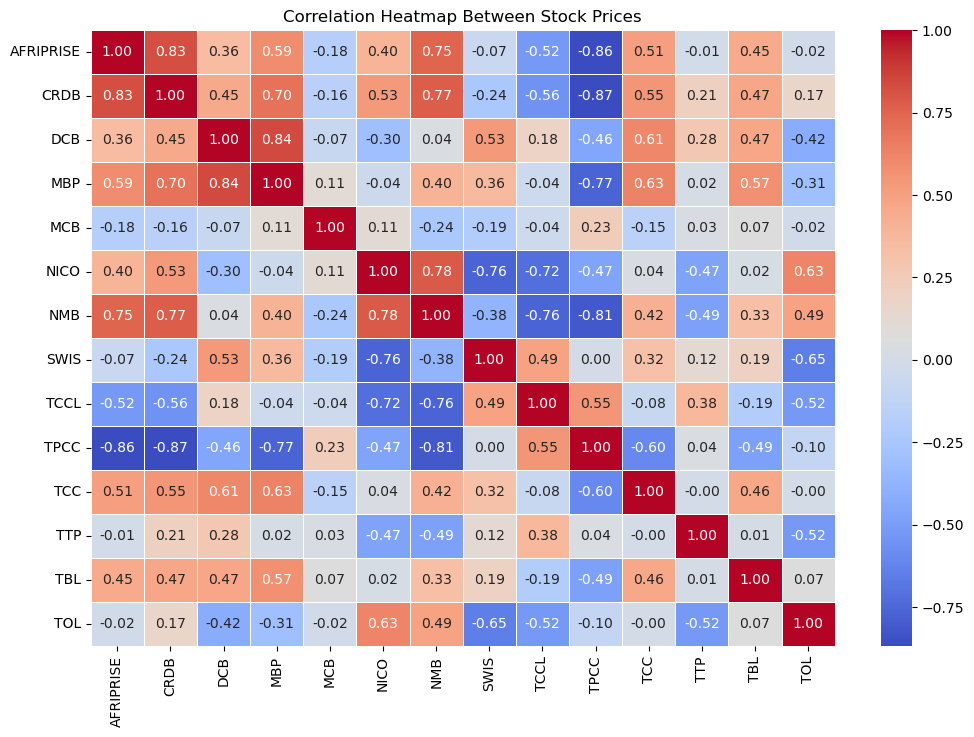

In [9]:
#Visualizations
# correlation between prices of all stocks 
price_data = {}

for stock, df in all_stock_data.items():
    price_data[stock] = df[['Date', 'Price']].set_index('Date')['Price']

# Combine the price data into a single DataFrame
price_df = pd.DataFrame(price_data)

# Calculate the correlation matrix between the stock prices
correlation_matrix = price_df.corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap Between Stock Prices")
plt.show()


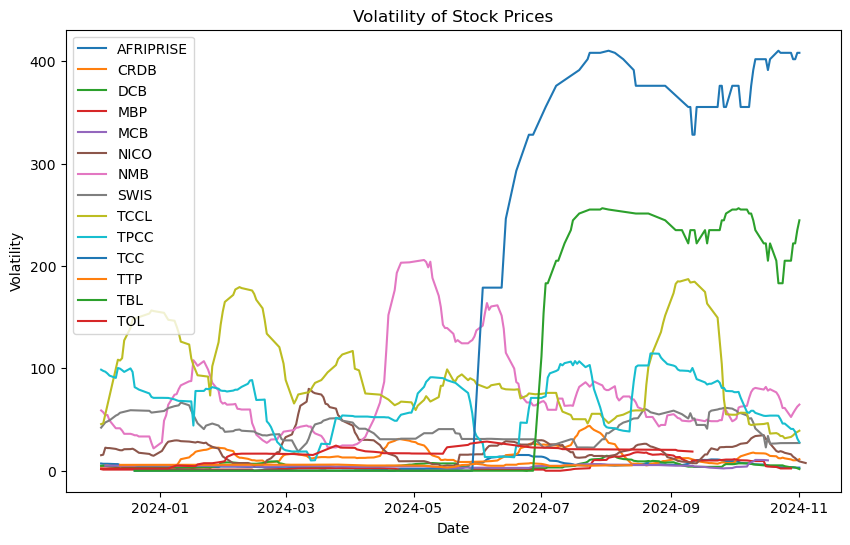

In [10]:
# Price volatility of all stocks 
plt.figure(figsize=(10, 6))
for stock, df in all_stock_data.items():
    df['Volatility'] = df['Price'].rolling(window=20).std()
    plt.plot(df['Date'], df['Volatility'], label=stock)
plt.title('Volatility of Stock Prices')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.legend()
plt.show()

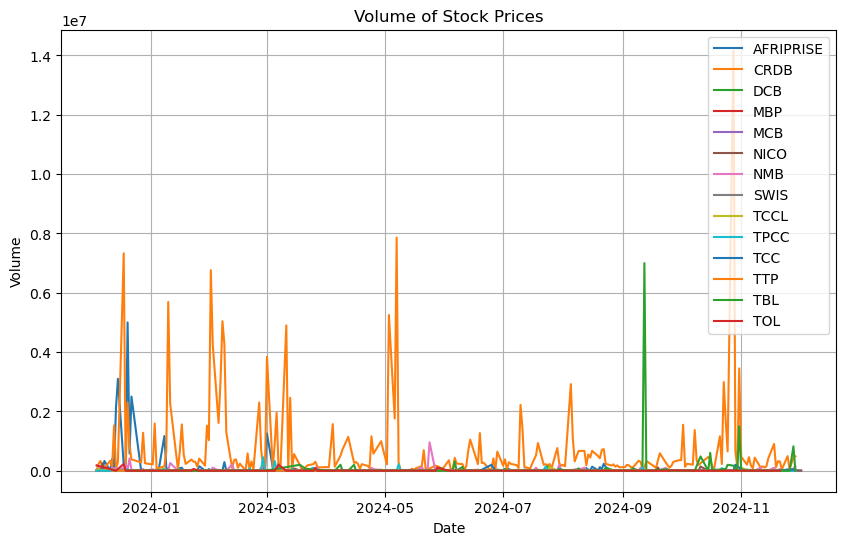

In [14]:
plt.figure(figsize=(10, 6))

for stock, df in all_stock_data.items():
  df['Volume'] = df['Vol.']
  plt.plot(df['Date'], df['Volume'], label=stock)

# Add labels and title
plt.title('Volume of Stock Prices')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.legend()
plt.grid(True)
plt.show()


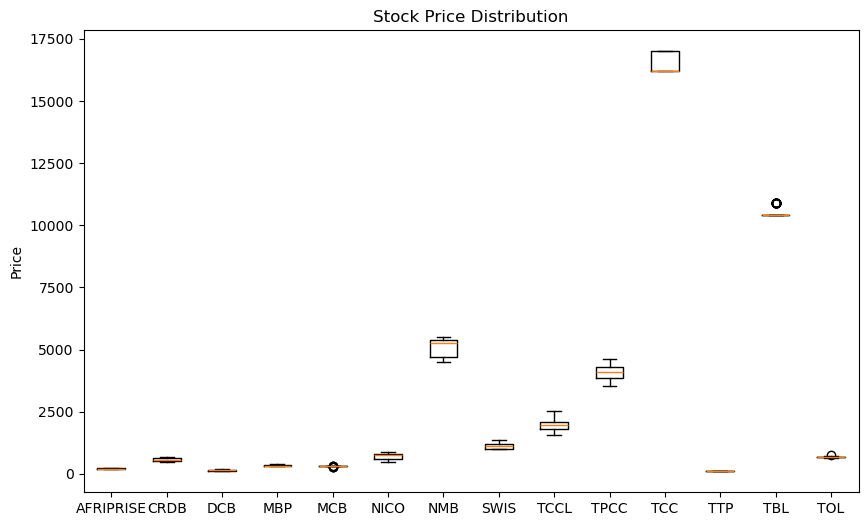

In [12]:
# Stock prices distributions
plt.figure(figsize=(10, 6))
stock_prices = [df['Price'] for df in all_stock_data.values()]
plt.boxplot(stock_prices, labels=all_stock_data.keys())
plt.title('Stock Price Distribution')
plt.ylabel('Price')
plt.show()

# MODEL TRAINING


Training models for AFRIPRISE...
Linear Regression: CV MSE = 0.4387, CV RMSE = 0.6623, CV R² = 0.9875
Ridge Regression: CV MSE = 0.9081, CV RMSE = 0.9530, CV R² = 0.9756
Lasso Regression: CV MSE = 4.8107, CV RMSE = 2.1933, CV R² = 0.8956
Elastic Net: CV MSE = 22.2972, CV RMSE = 4.7220, CV R² = 0.5461
Decision Tree: CV MSE = 176.6348, CV RMSE = 13.2904, CV R² = -2.4112
Random Forest: CV MSE = 22.5016, CV RMSE = 4.7436, CV R² = 0.5297
Gradient Boosting: CV MSE = 20.1937, CV RMSE = 4.4937, CV R² = 0.5938
KNN: CV MSE = 32.6002, CV RMSE = 5.7097, CV R² = 0.4366
SVM: CV MSE = 95.4405, CV RMSE = 9.7694, CV R² = -0.9769
AdaBoost: CV MSE = 31.4943, CV RMSE = 5.6120, CV R² = 0.4096
CatBoost: CV MSE = 26.4457, CV RMSE = 5.1425, CV R² = 0.5070
Best model for AFRIPRISE: Linear Regression with CV MSE = 0.4387


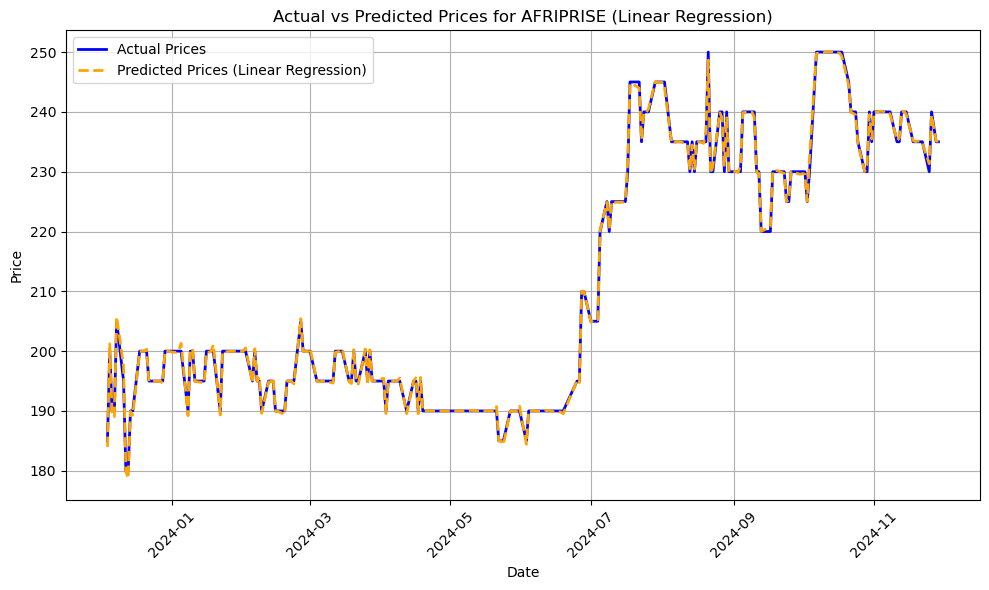

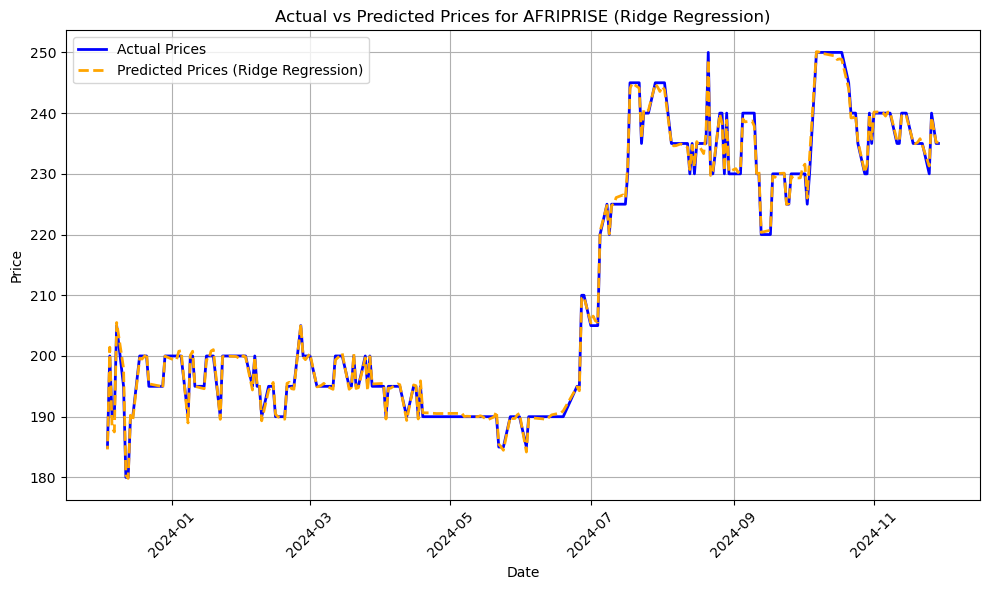

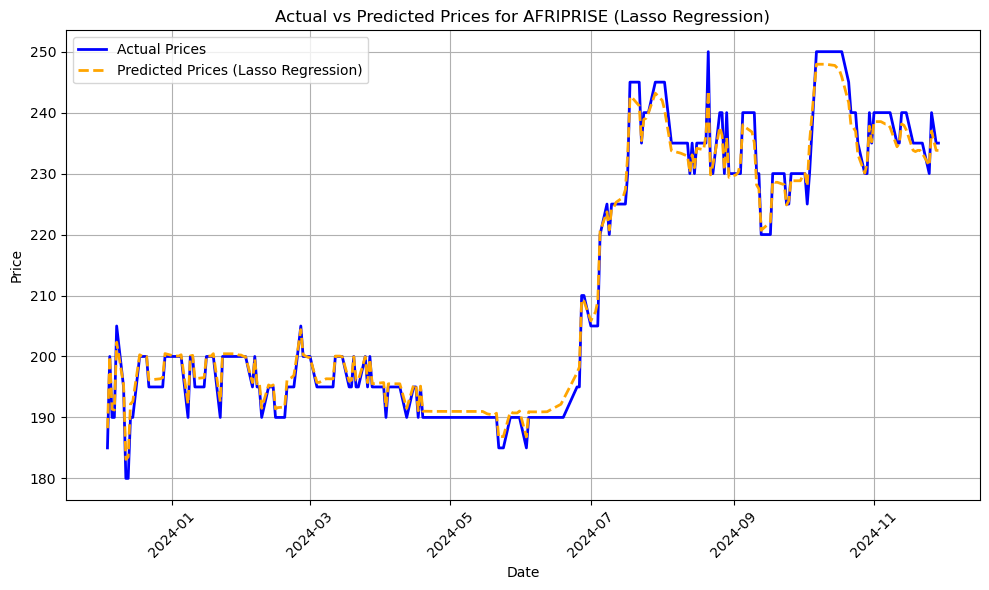

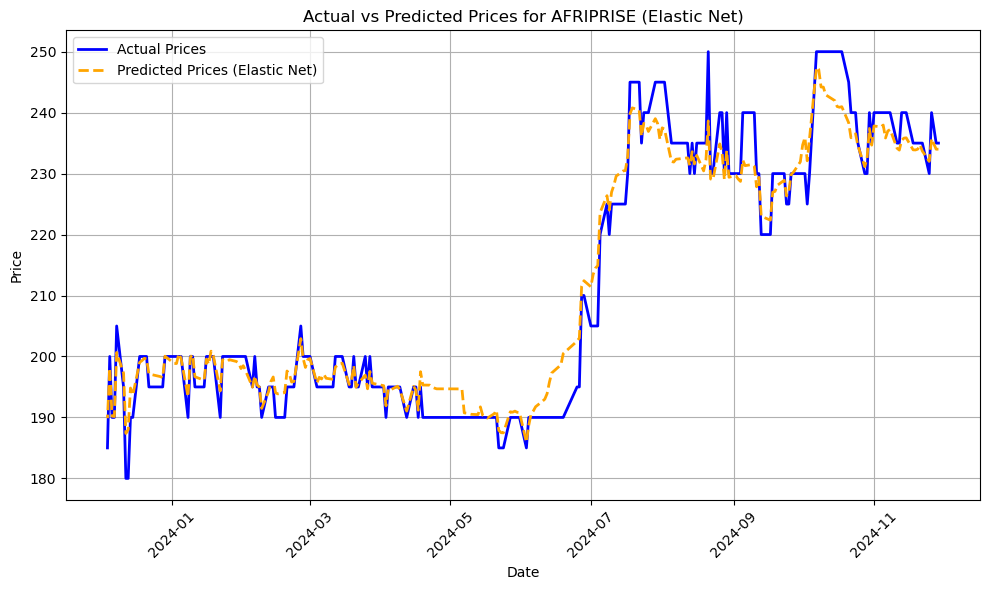

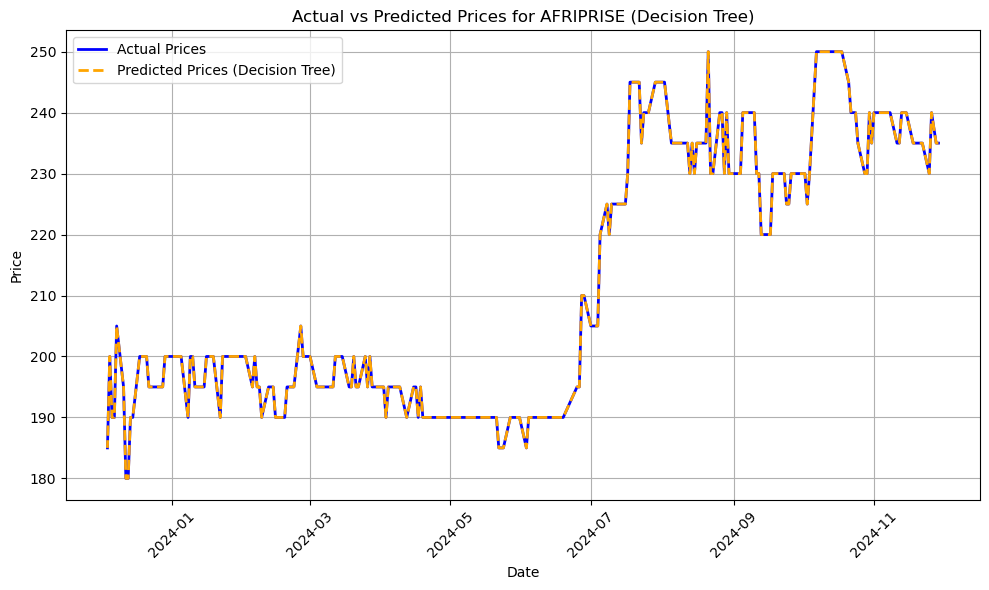

...

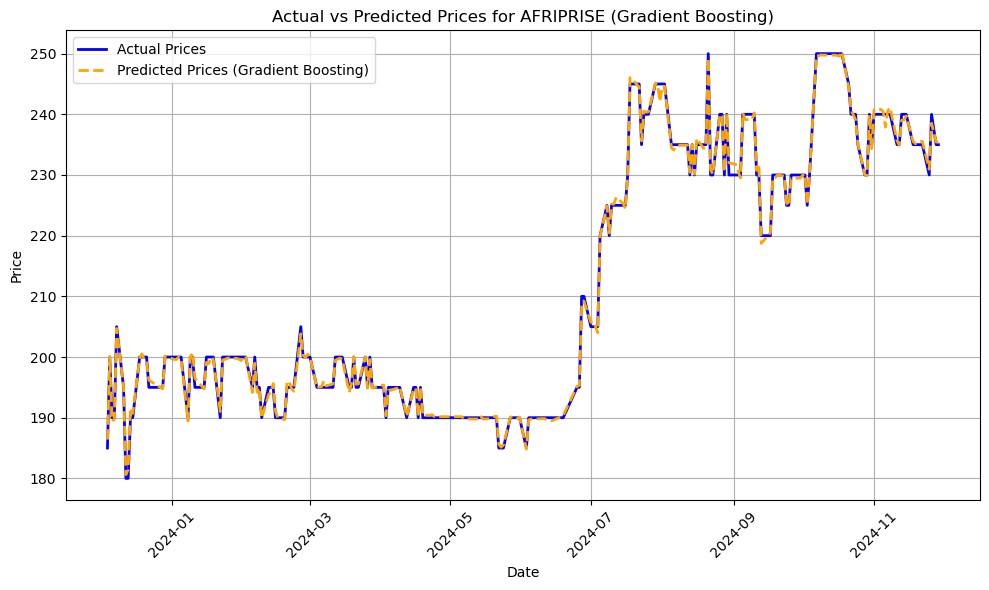

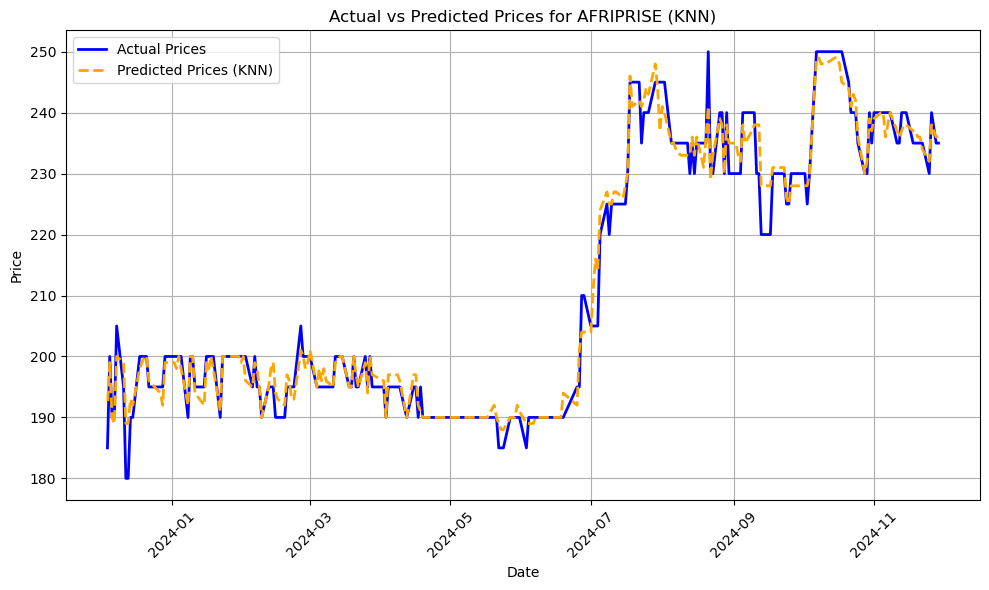

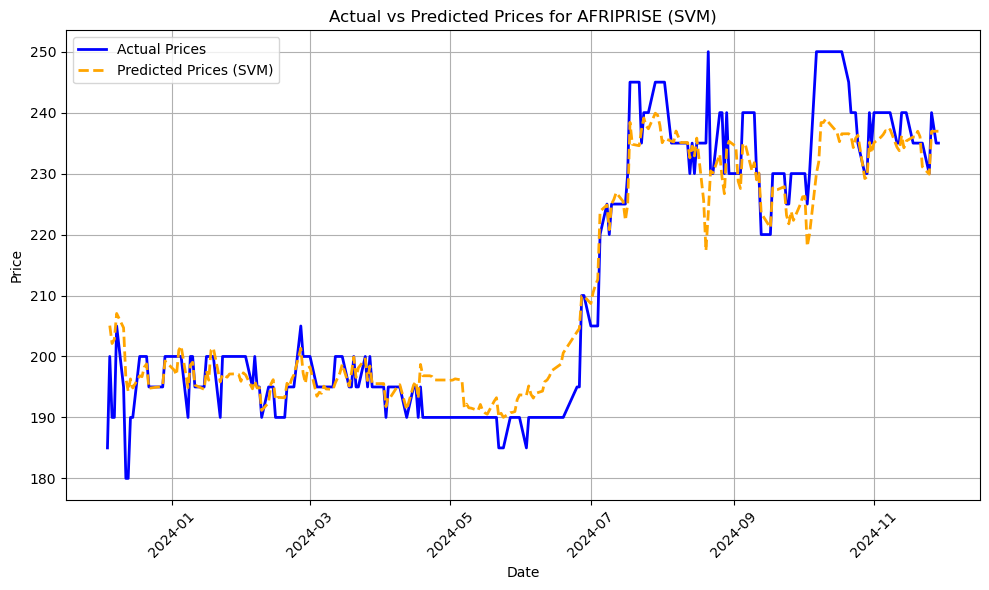

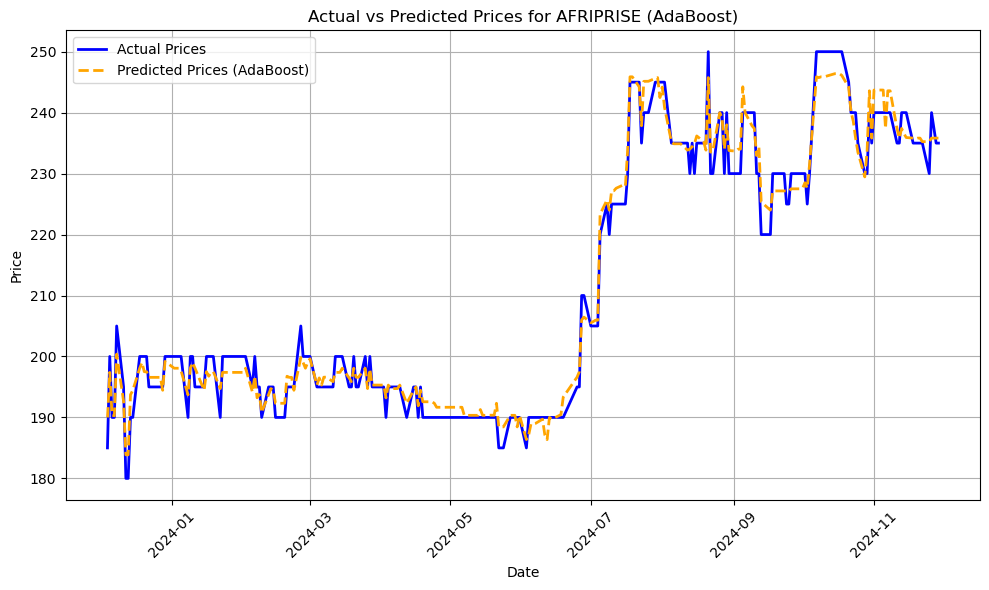

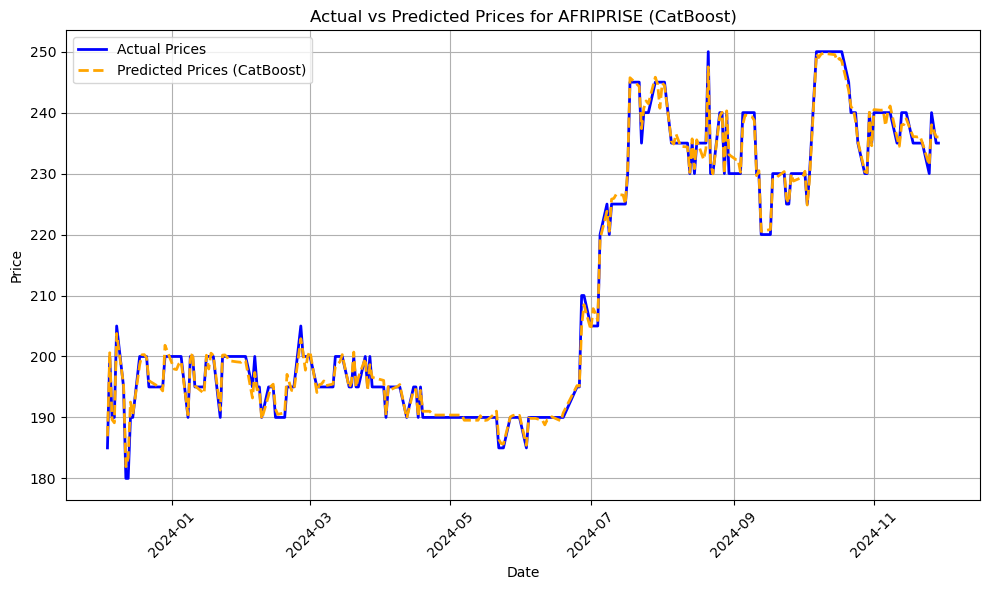


Training models for CRDB...
Linear Regression: CV MSE = 2.0098, CV RMSE = 1.4177, CV R² = 0.9931
Ridge Regression: CV MSE = 15.5618, CV RMSE = 3.9448, CV R² = 0.9479
Lasso Regression: CV MSE = 5.7490, CV RMSE = 2.3977, CV R² = 0.9806
Elastic Net: CV MSE = 159.6622, CV RMSE = 12.6357, CV R² = 0.4180
Decision Tree: CV MSE = 722.2449, CV RMSE = 26.8746, CV R² = -1.7204
Random Forest: CV MSE = 507.9030, CV RMSE = 22.5367, CV R² = -1.4733
Gradient Boosting: CV MSE = 391.4957, CV RMSE = 19.7863, CV R² = -0.9795
KNN: CV MSE = 738.6000, CV RMSE = 27.1772, CV R² = -2.0946
SVM: CV MSE = 5034.5511, CV RMSE = 70.9546, CV R² = -19.1150
AdaBoost: CV MSE = 664.4437, CV RMSE = 25.7768, CV R² = -1.9752
CatBoost: CV MSE = 716.7378, CV RMSE = 26.7720, CV R² = -2.9436
Best model for CRDB: Linear Regression with CV MSE = 2.0098


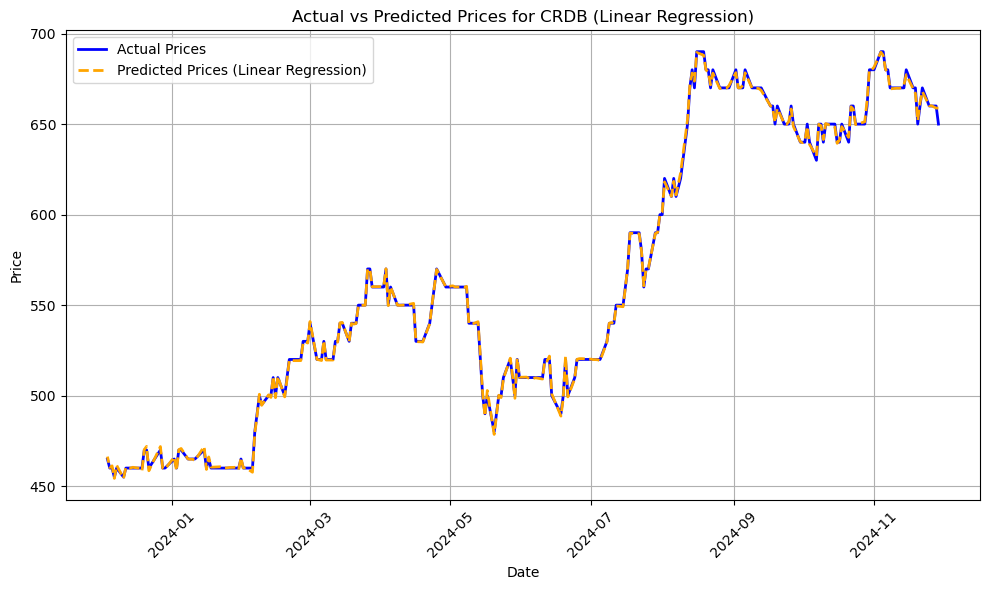

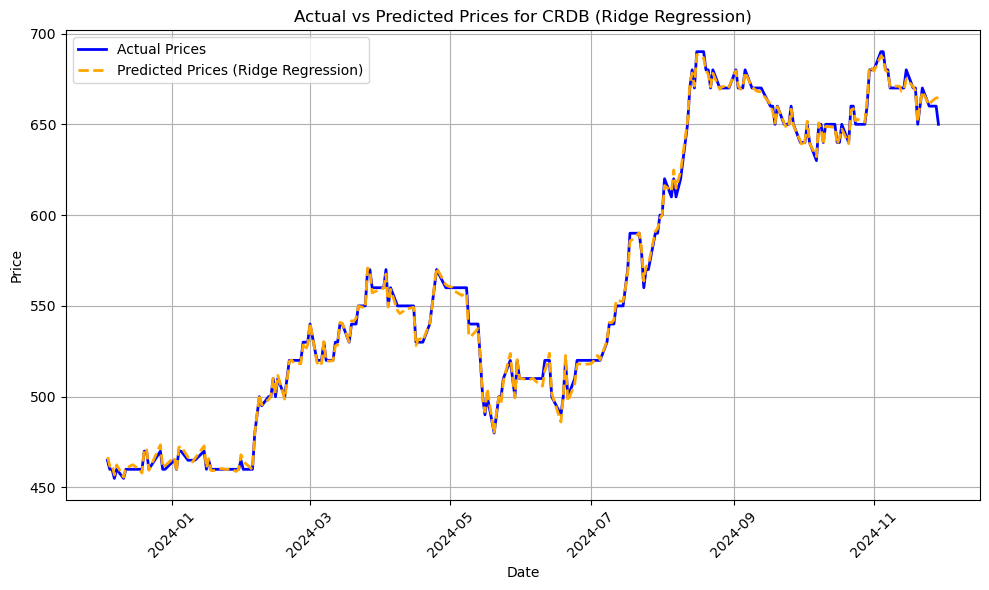

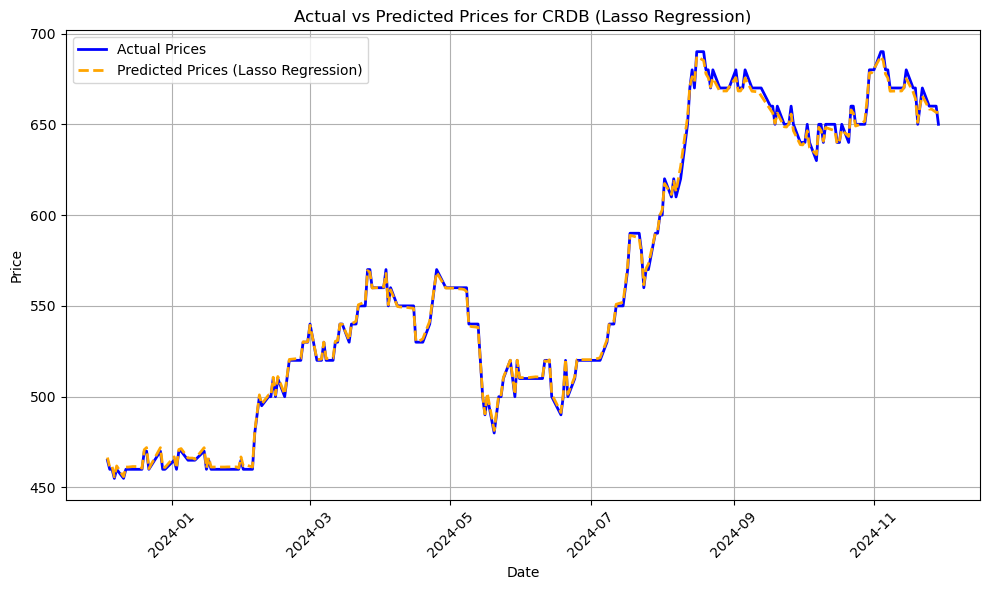

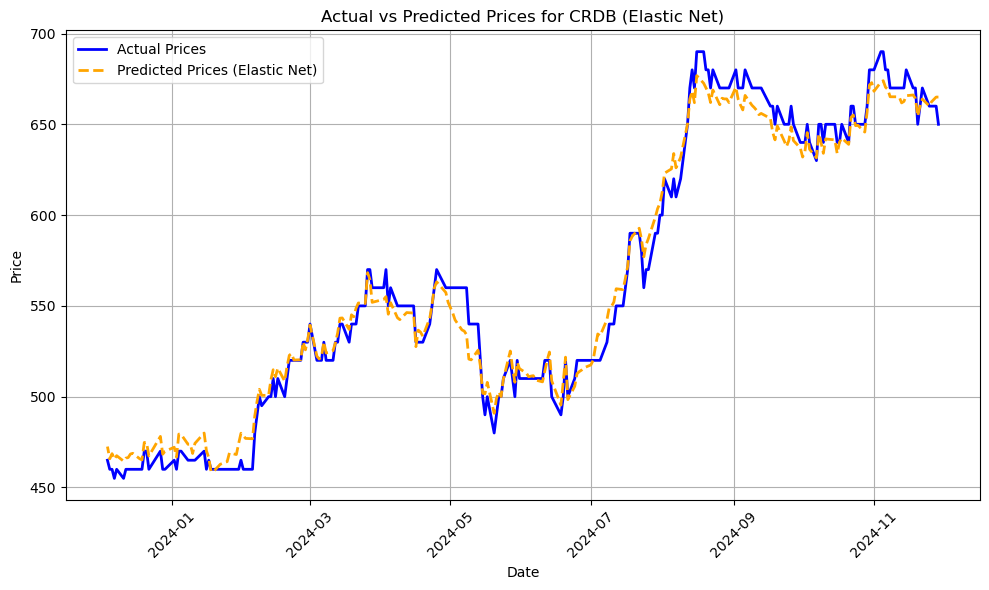

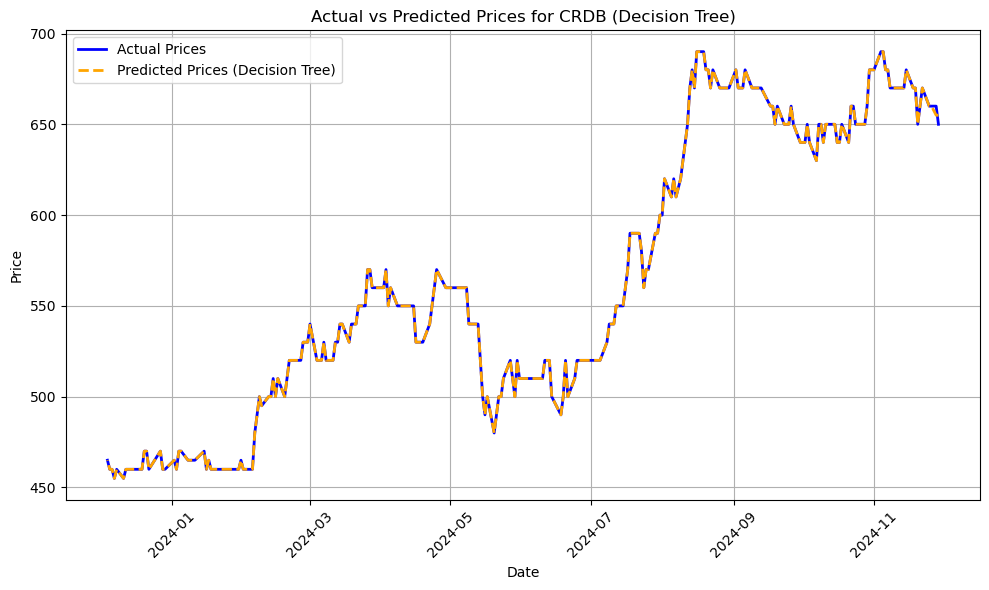

...

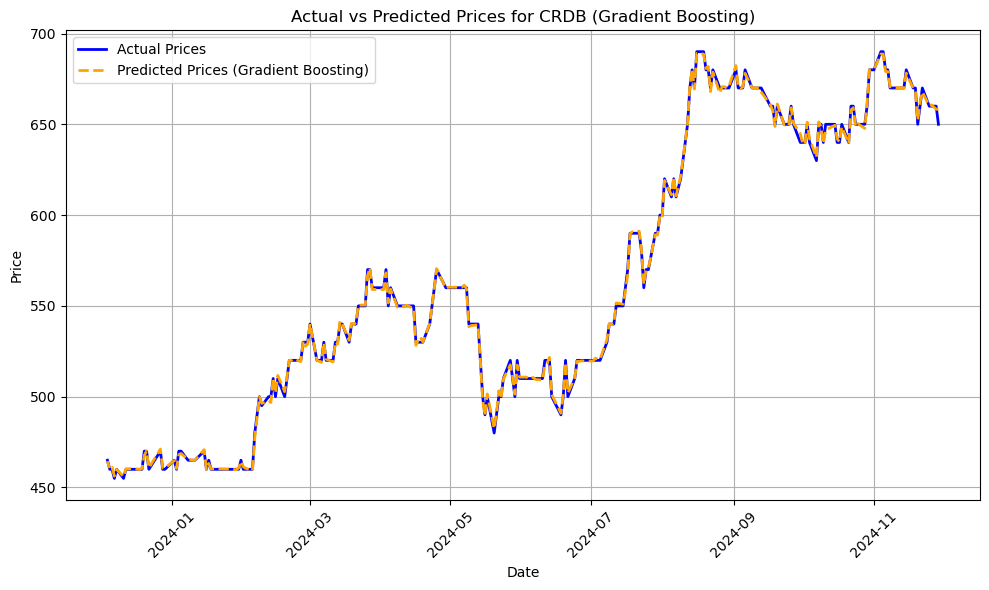

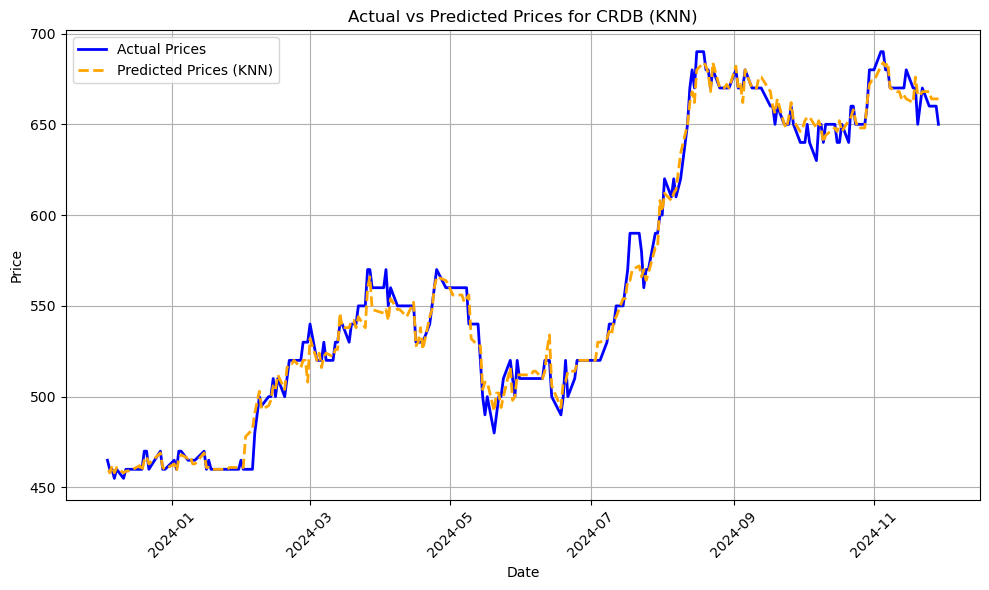

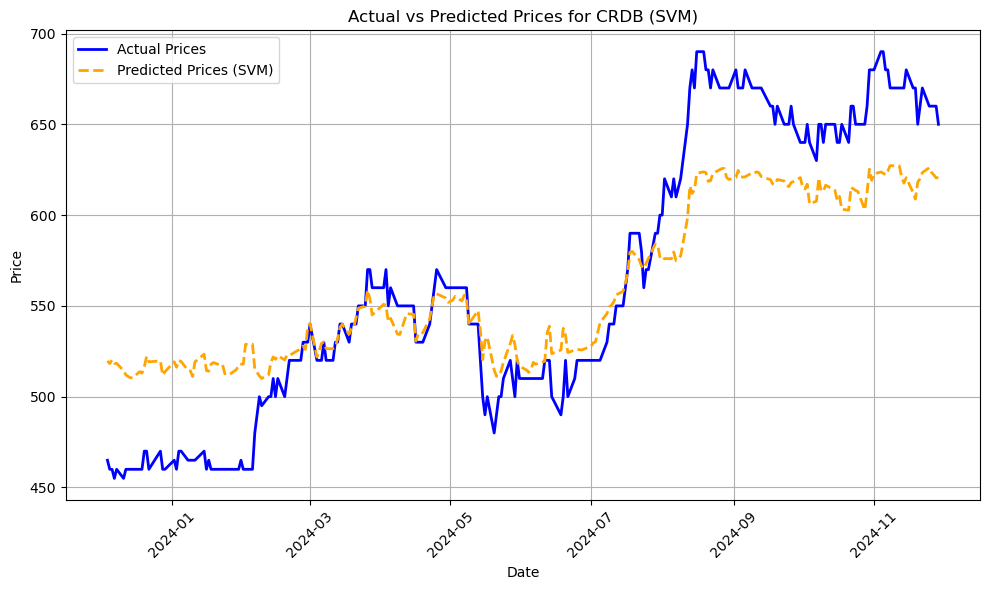

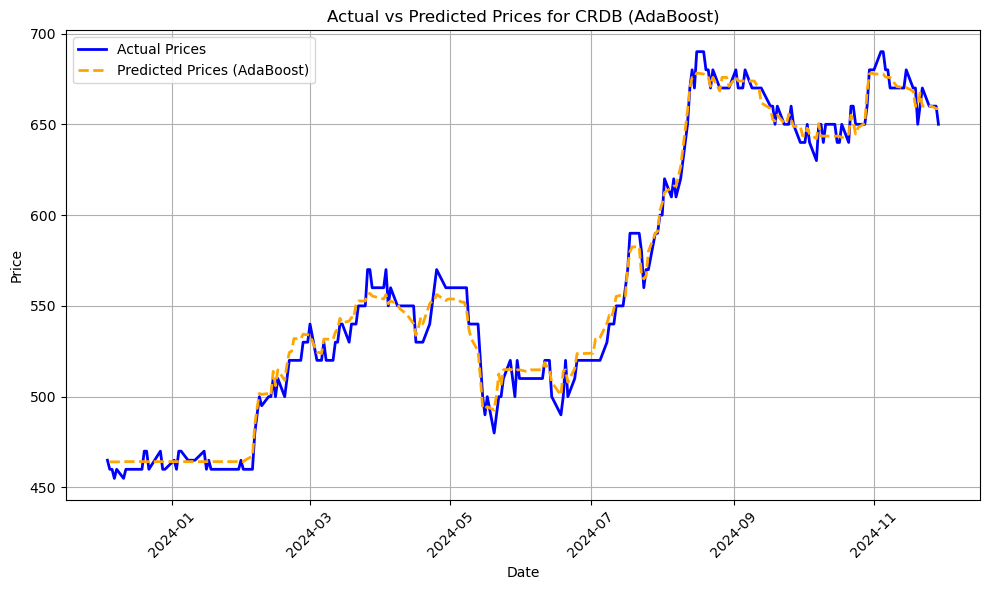

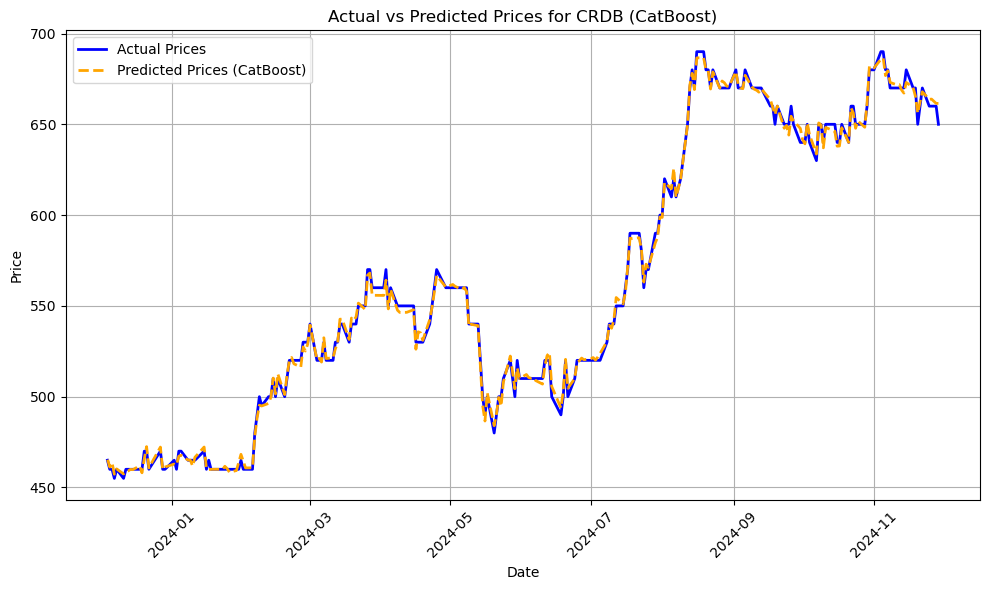


Training models for DCB...
Linear Regression: CV MSE = 0.5201, CV RMSE = 0.7212, CV R² = 0.9875
Ridge Regression: CV MSE = 0.7892, CV RMSE = 0.8883, CV R² = 0.9813
Lasso Regression: CV MSE = 5.7097, CV RMSE = 2.3895, CV R² = 0.8406
Elastic Net: CV MSE = 23.4893, CV RMSE = 4.8466, CV R² = 0.6298
Decision Tree: CV MSE = 58.6303, CV RMSE = 7.6570, CV R² = -0.3119
Random Forest: CV MSE = 36.8858, CV RMSE = 6.0734, CV R² = 0.2874
Gradient Boosting: CV MSE = 36.2640, CV RMSE = 6.0220, CV R² = 0.4470
KNN: CV MSE = 43.4465, CV RMSE = 6.5914, CV R² = 0.0760
SVM: CV MSE = 208.6869, CV RMSE = 14.4460, CV R² = -5.2101
AdaBoost: CV MSE = 54.4327, CV RMSE = 7.3779, CV R² = 0.1679
CatBoost: CV MSE = 38.5050, CV RMSE = 6.2052, CV R² = 0.2091
Best model for DCB: Linear Regression with CV MSE = 0.5201


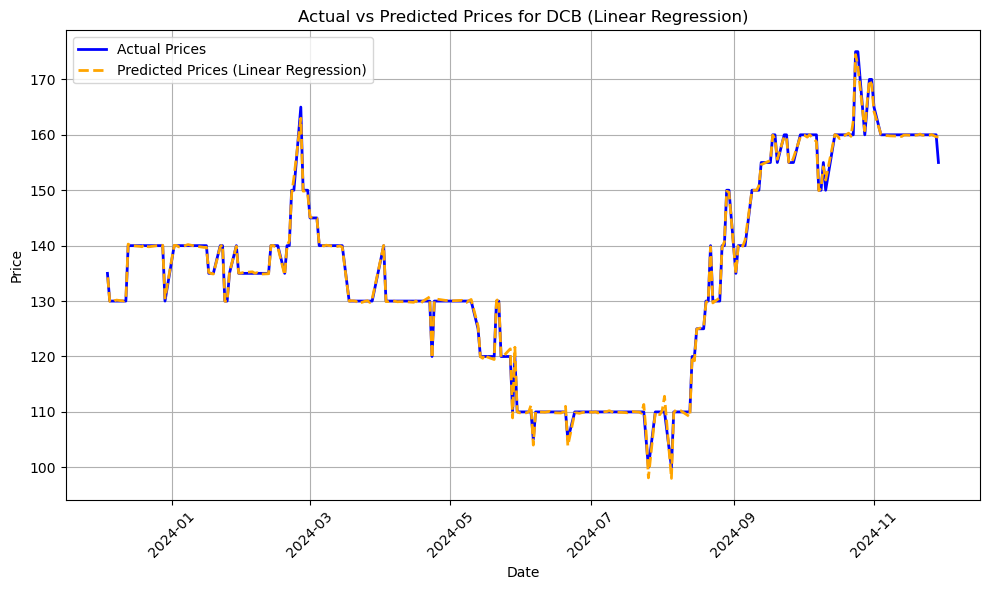

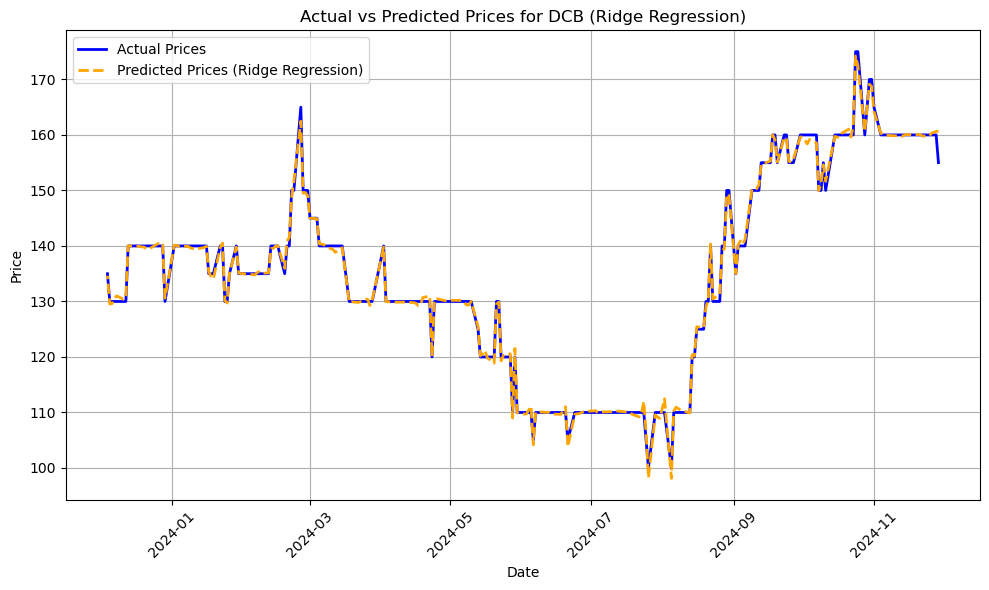

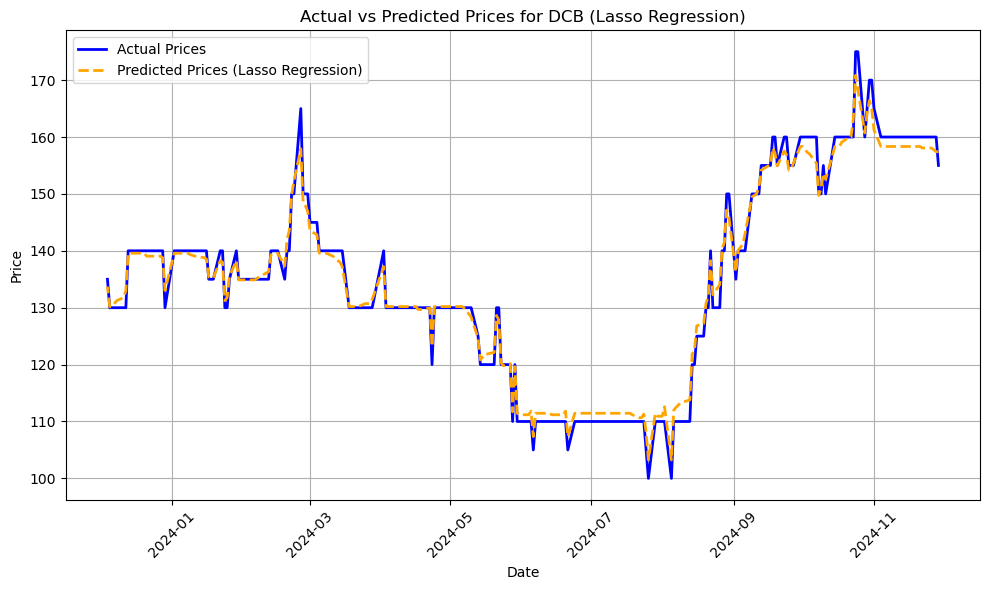

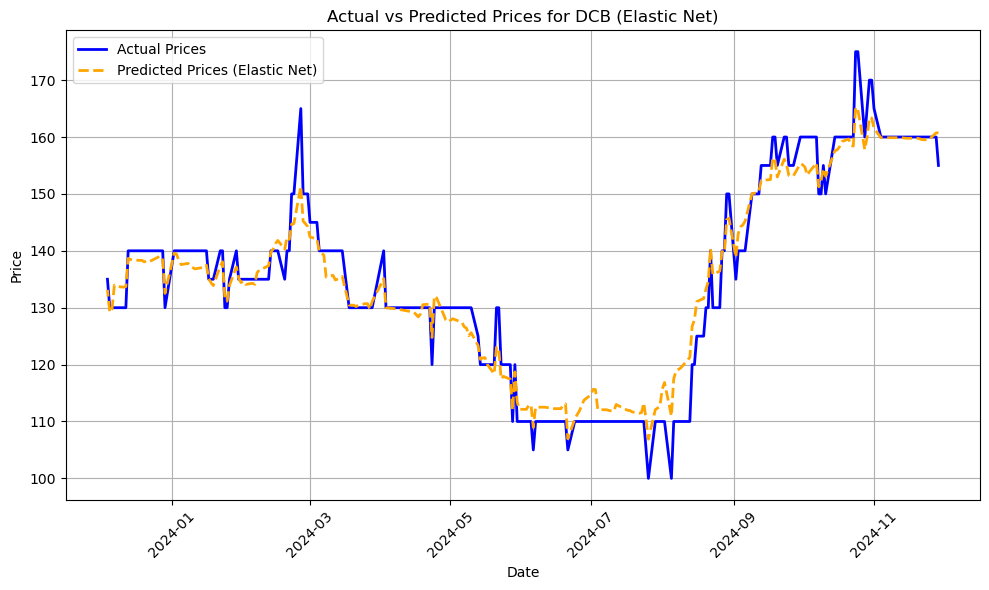

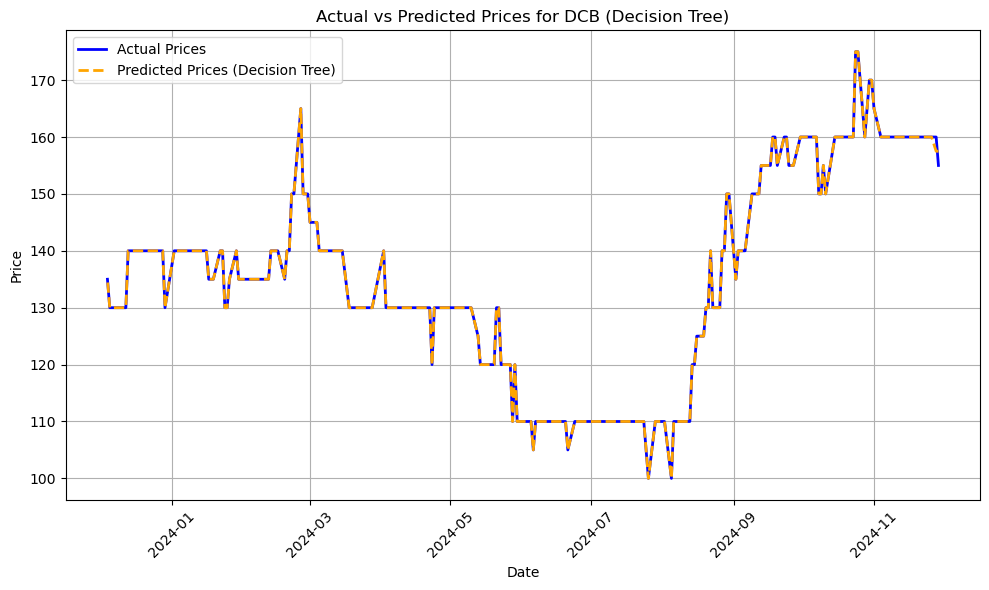

...

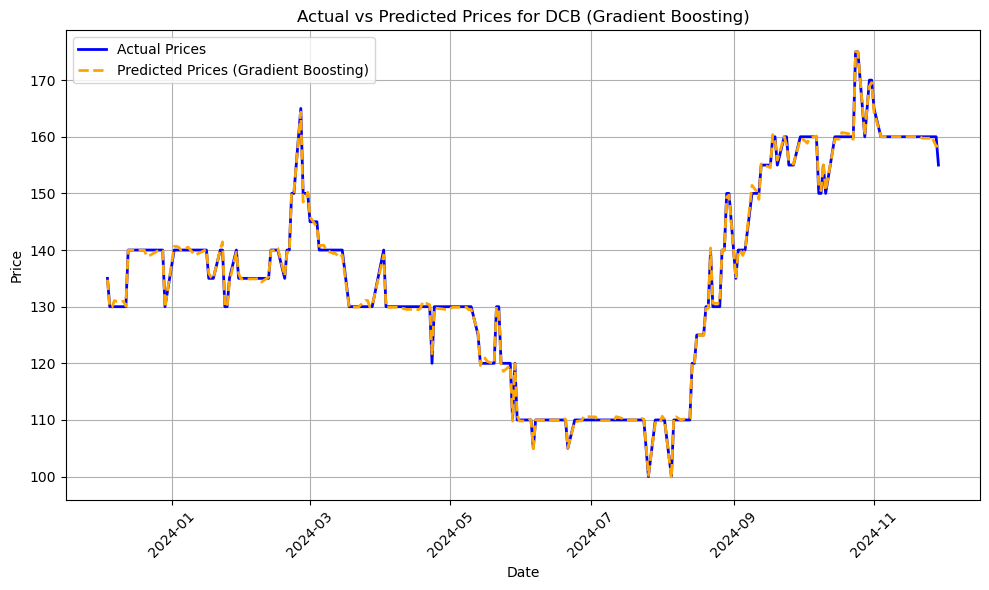

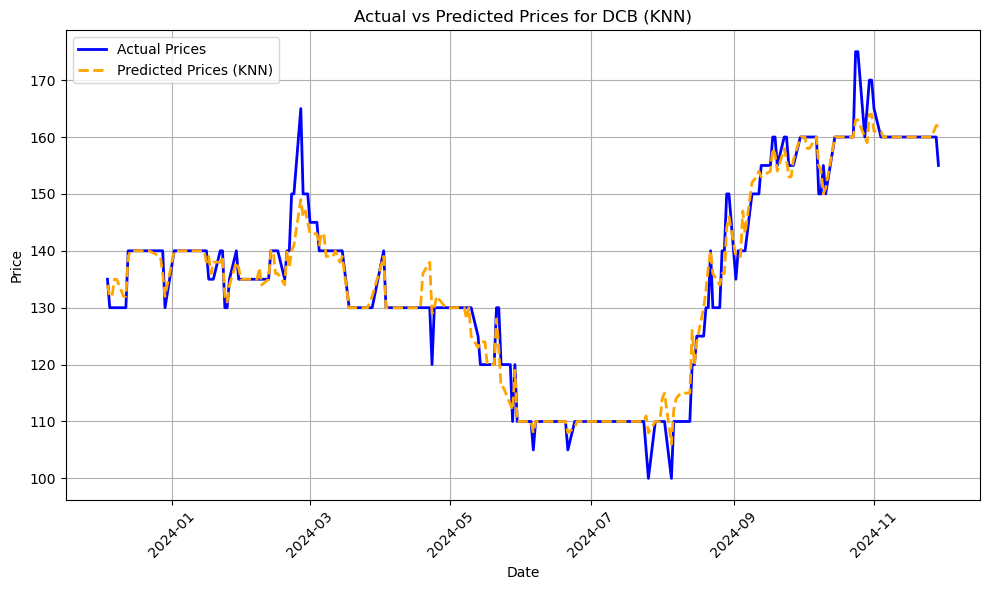

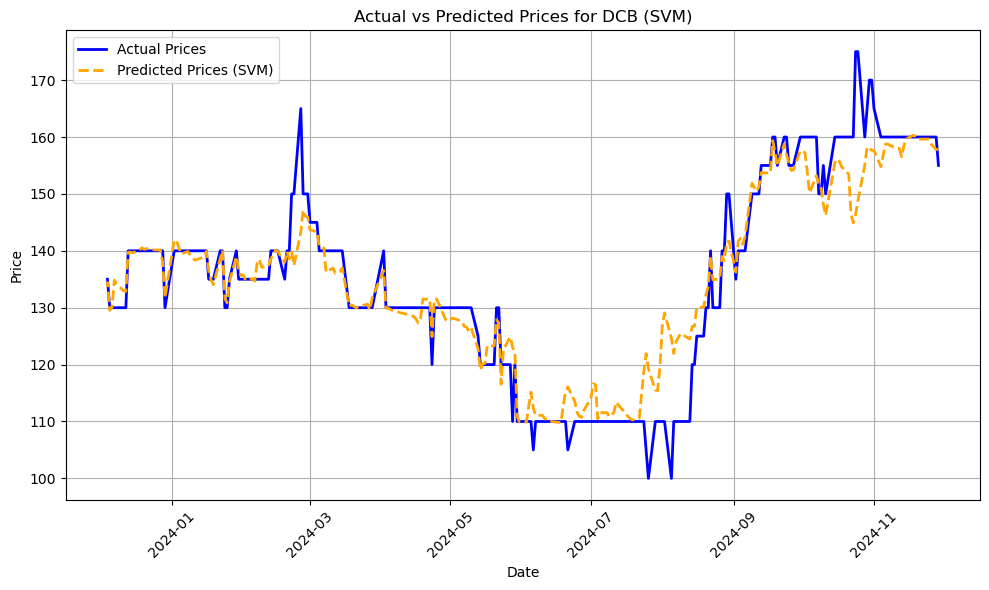

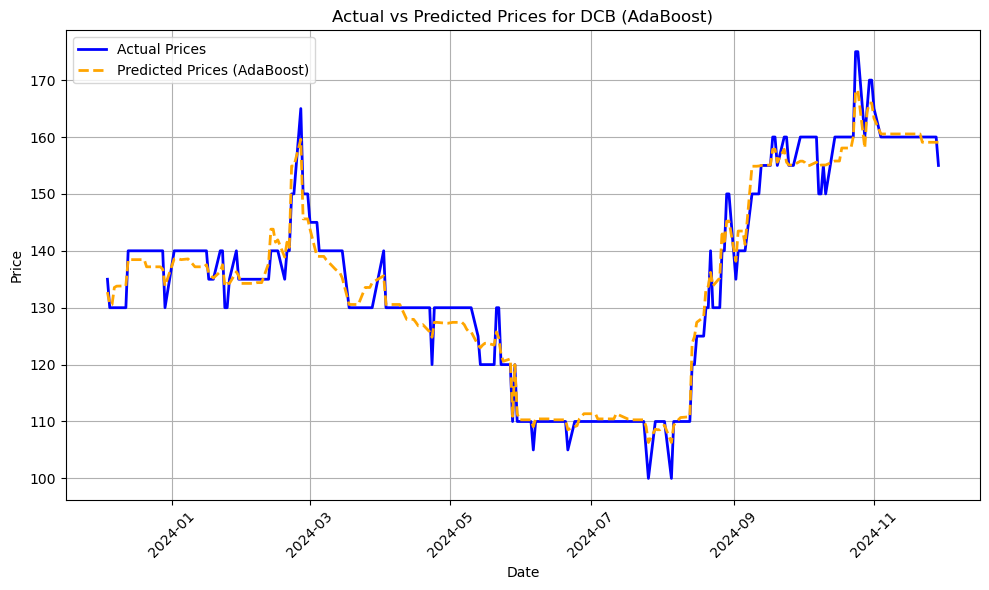

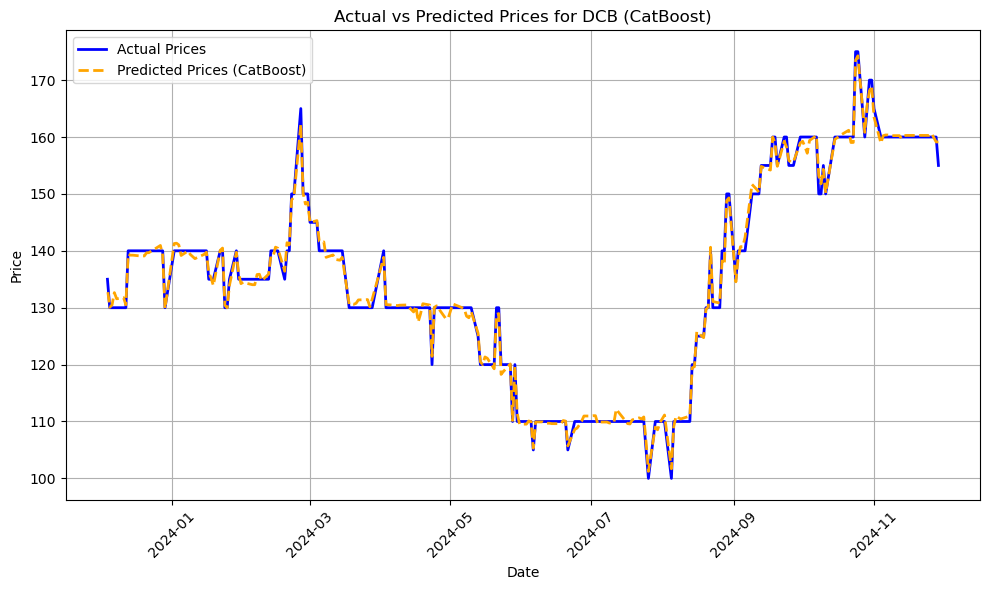


Training models for MBP...
Linear Regression: CV MSE = 0.3774, CV RMSE = 0.6144, CV R² = 0.7793
Ridge Regression: CV MSE = 2.7515, CV RMSE = 1.6588, CV R² = 0.7157
Lasso Regression: CV MSE = 17.9322, CV RMSE = 4.2346, CV R² = 0.6391
Elastic Net: CV MSE = 34.7415, CV RMSE = 5.8942, CV R² = 0.0202
Decision Tree: CV MSE = 132.4194, CV RMSE = 11.5074, CV R² = -2.5951
Random Forest: CV MSE = 63.8378, CV RMSE = 7.9899, CV R² = -0.5487
Gradient Boosting: CV MSE = 53.5650, CV RMSE = 7.3188, CV R² = -0.6399
KNN: CV MSE = 54.8323, CV RMSE = 7.4049, CV R² = -1.6905
SVM: CV MSE = 246.0514, CV RMSE = 15.6860, CV R² = -5.6384
AdaBoost: CV MSE = 83.4729, CV RMSE = 9.1363, CV R² = -0.3914
CatBoost: CV MSE = 65.9094, CV RMSE = 8.1185, CV R² = -1.0242
Best model for MBP: Linear Regression with CV MSE = 0.3774


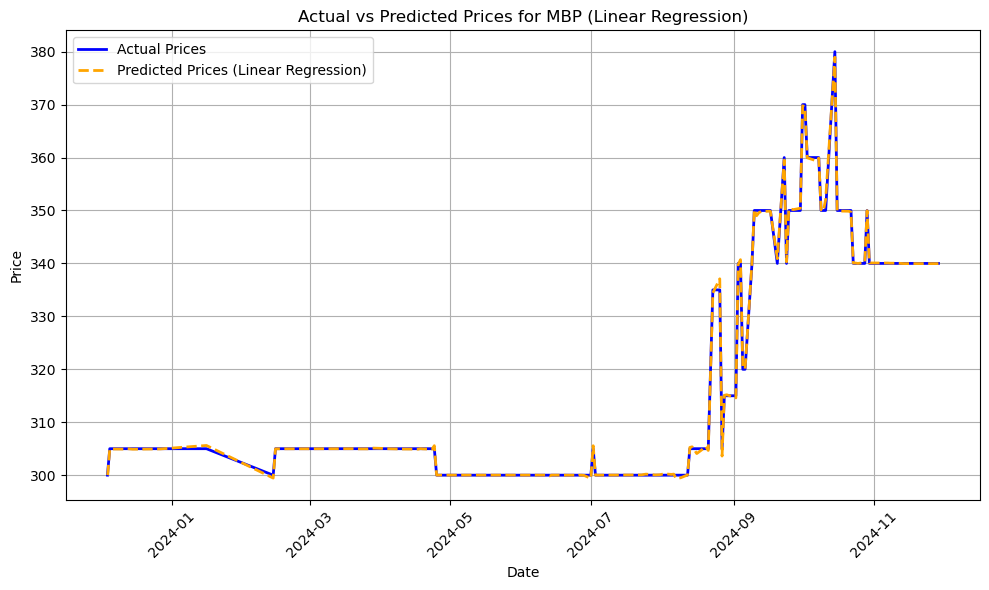

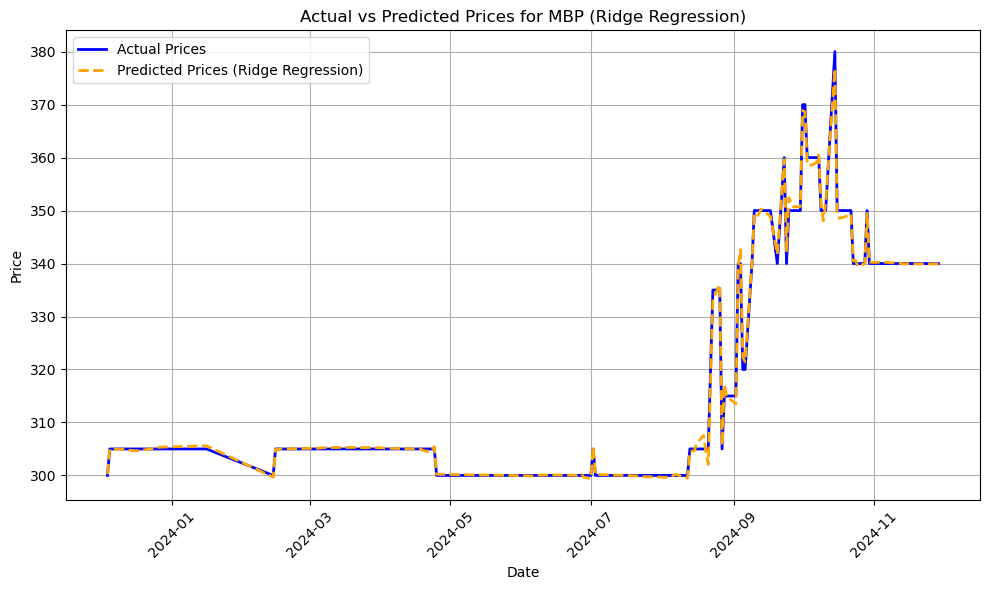

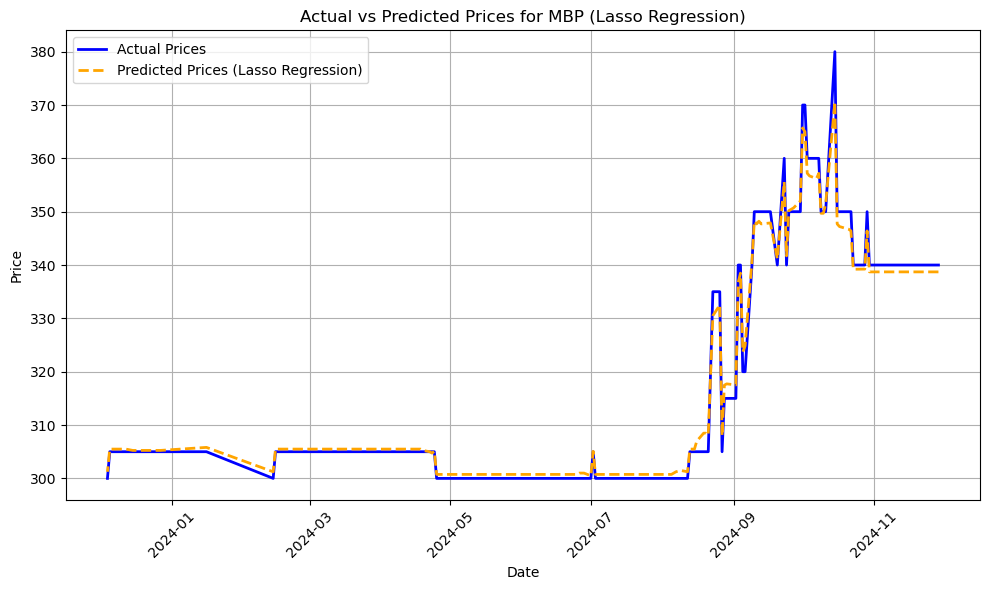

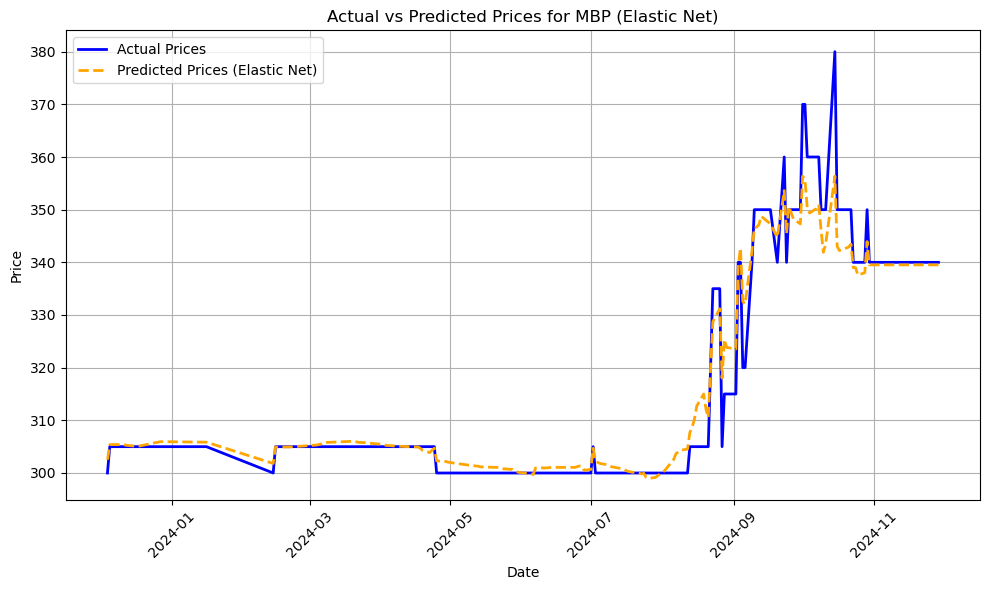

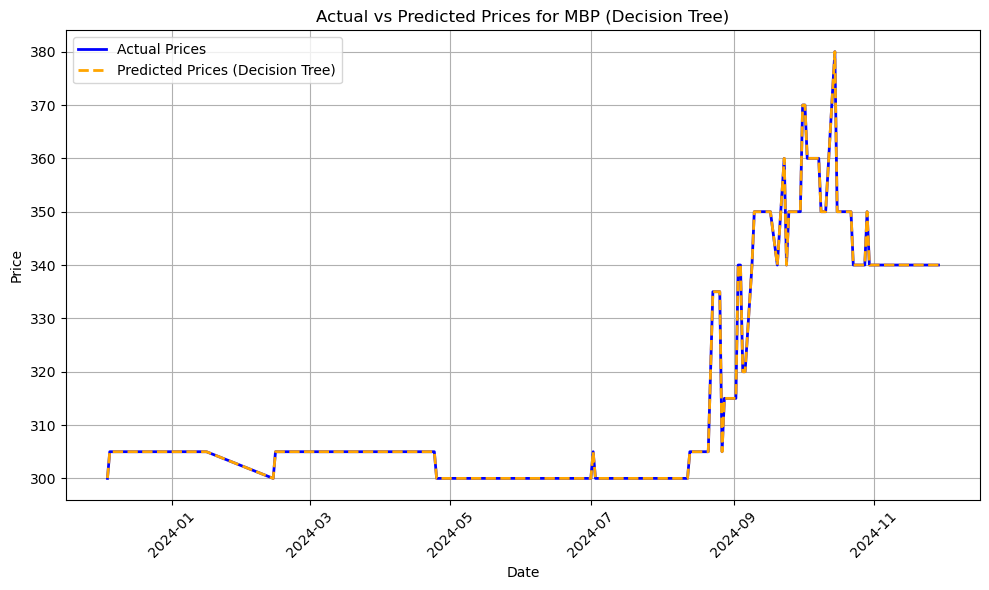

...

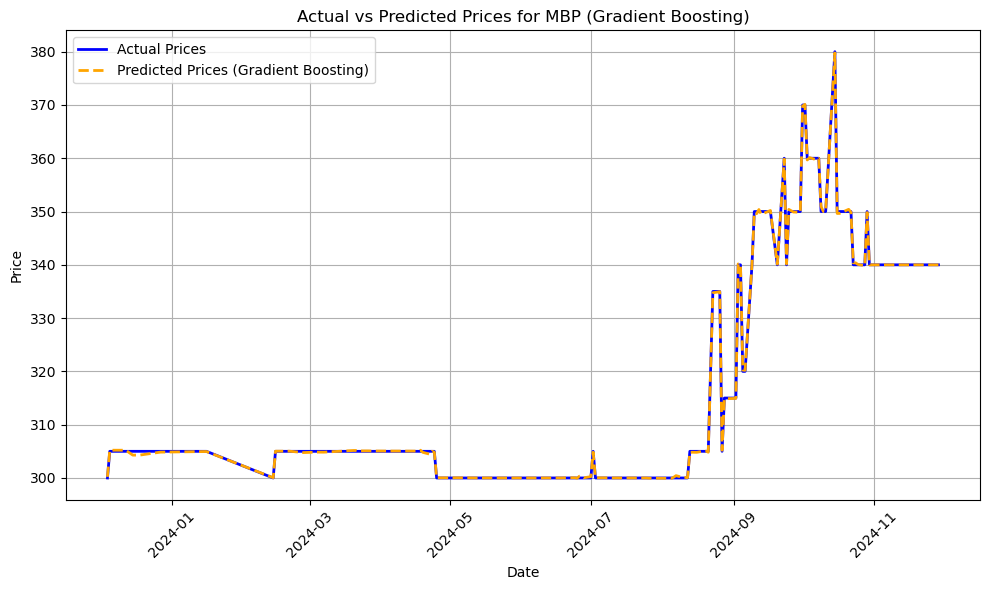

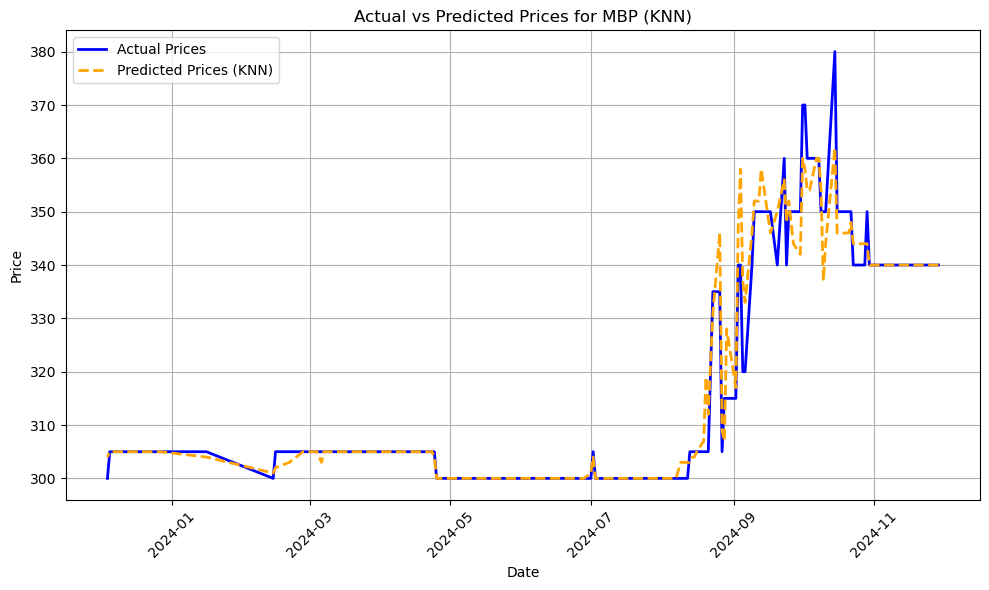

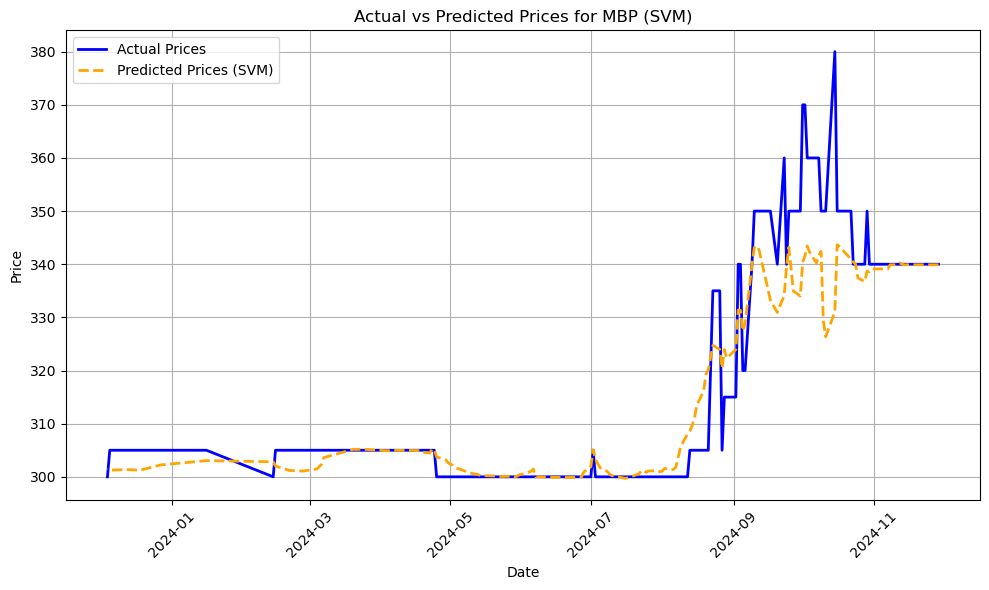

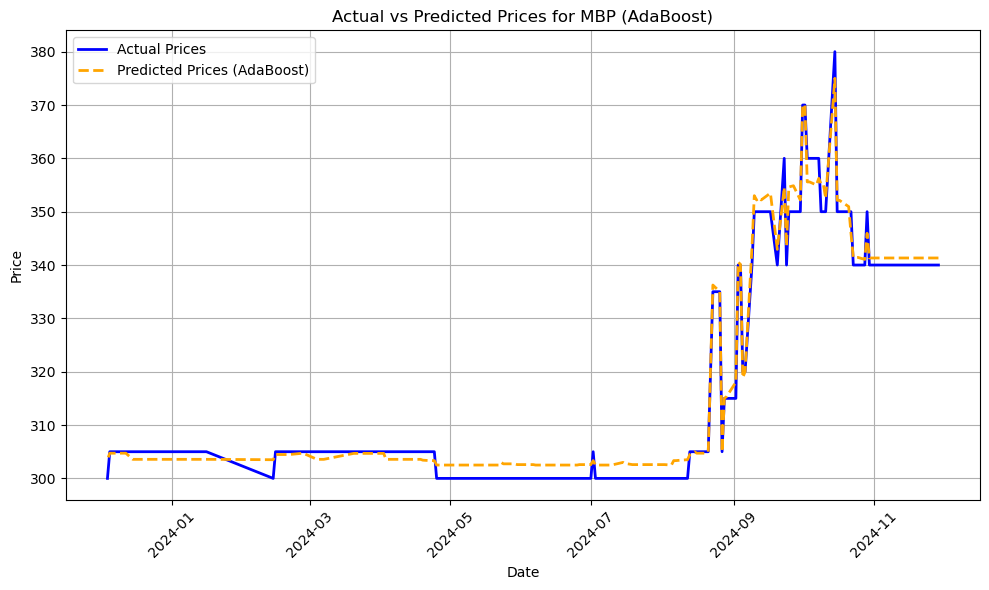

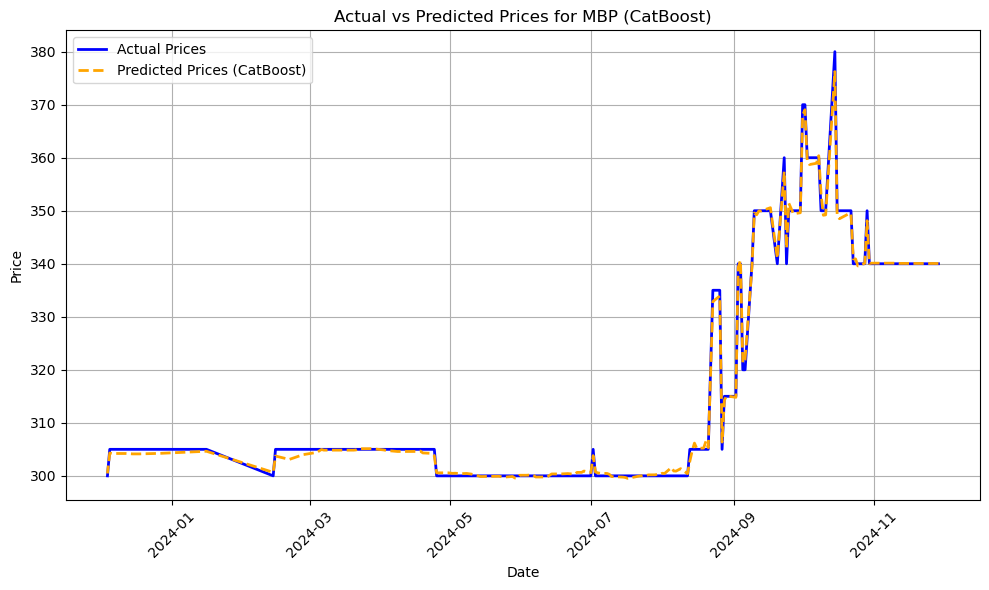


Training models for MCB...
Linear Regression: CV MSE = 0.0818, CV RMSE = 0.2860, CV R² = 0.9980
Ridge Regression: CV MSE = 0.4437, CV RMSE = 0.6661, CV R² = 0.9932
Lasso Regression: CV MSE = 25.2525, CV RMSE = 5.0252, CV R² = 0.6795
Elastic Net: CV MSE = 24.9309, CV RMSE = 4.9931, CV R² = 0.5805
Decision Tree: CV MSE = 35.3655, CV RMSE = 5.9469, CV R² = 0.4558
Random Forest: CV MSE = 28.9460, CV RMSE = 5.3802, CV R² = 0.5412
Gradient Boosting: CV MSE = 23.5395, CV RMSE = 4.8517, CV R² = 0.6463
KNN: CV MSE = 27.4737, CV RMSE = 5.2415, CV R² = 0.4429
SVM: CV MSE = 39.6295, CV RMSE = 6.2952, CV R² = 0.2413
AdaBoost: CV MSE = 26.8342, CV RMSE = 5.1802, CV R² = 0.5226
CatBoost: CV MSE = 28.2484, CV RMSE = 5.3149, CV R² = 0.5960
Best model for MCB: Linear Regression with CV MSE = 0.0818


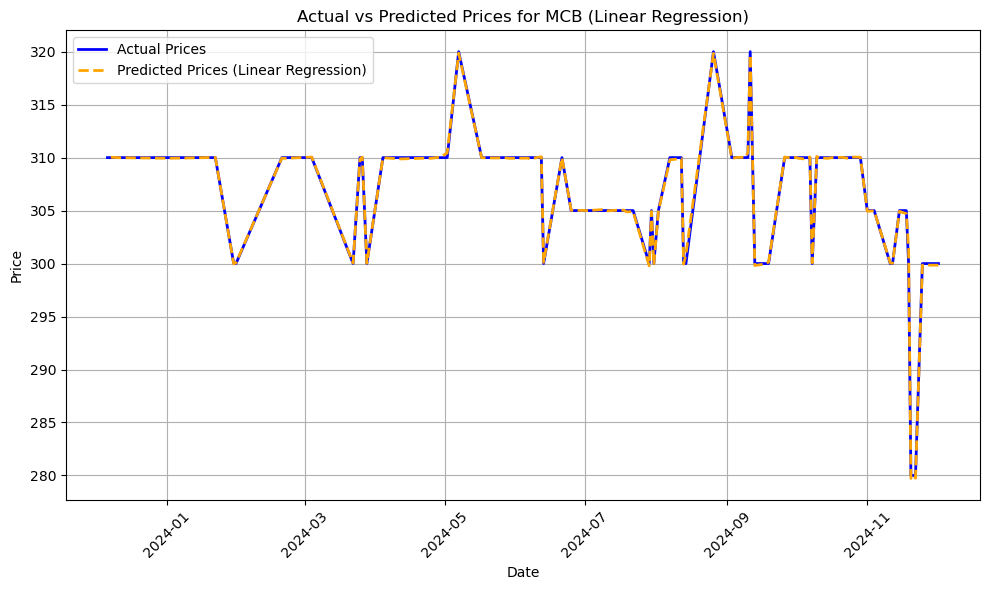

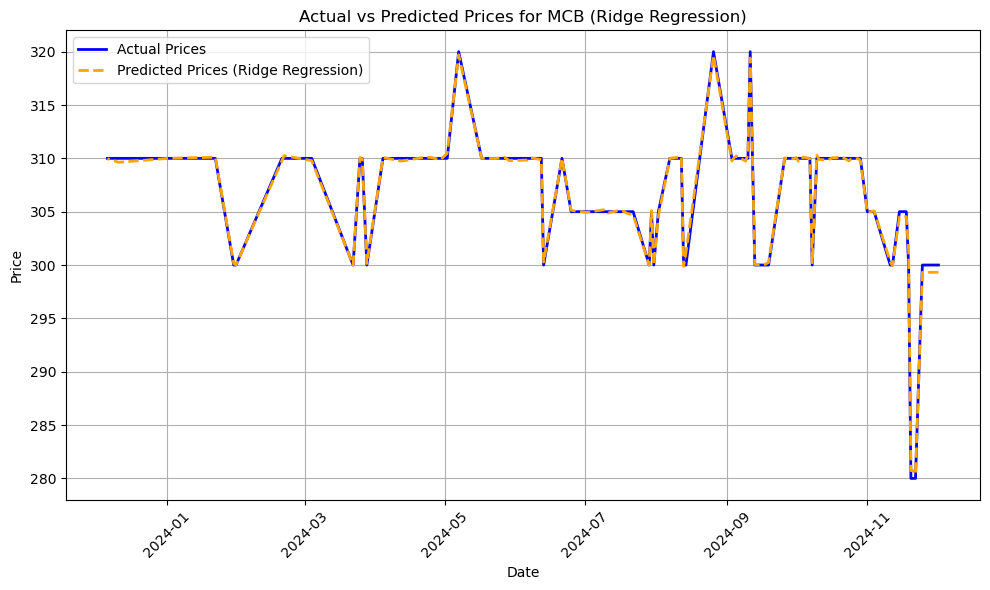

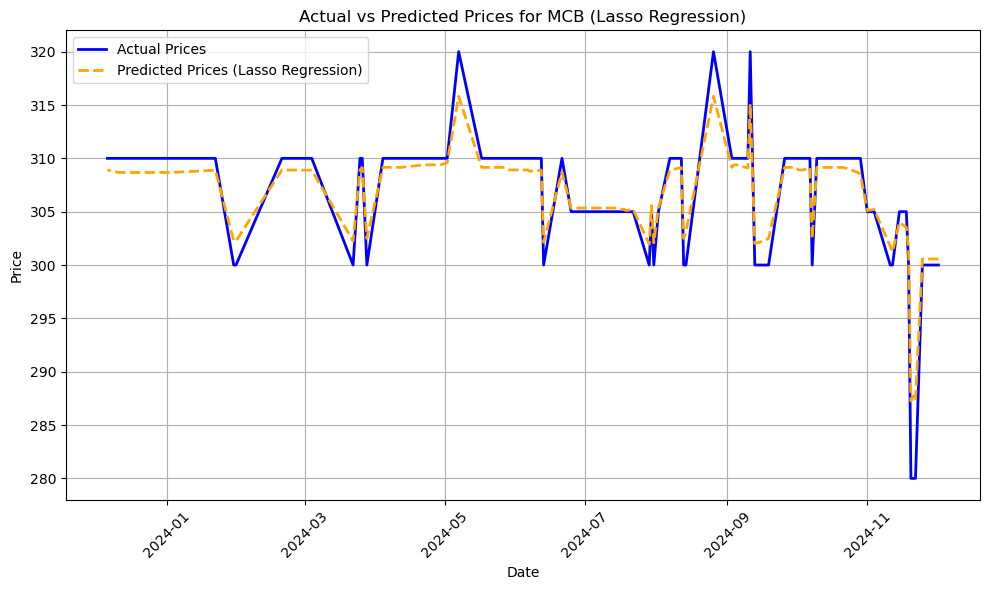

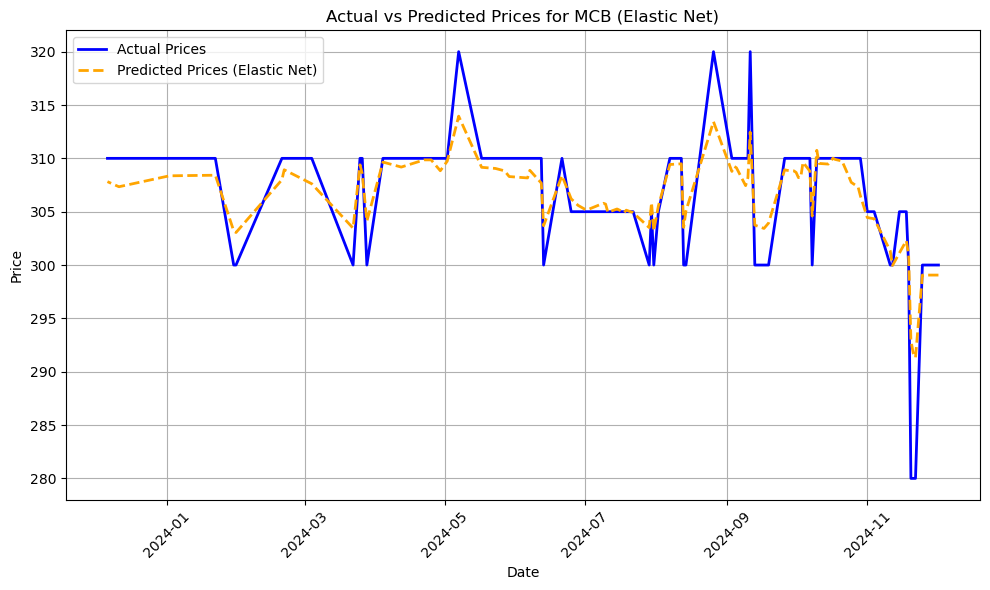

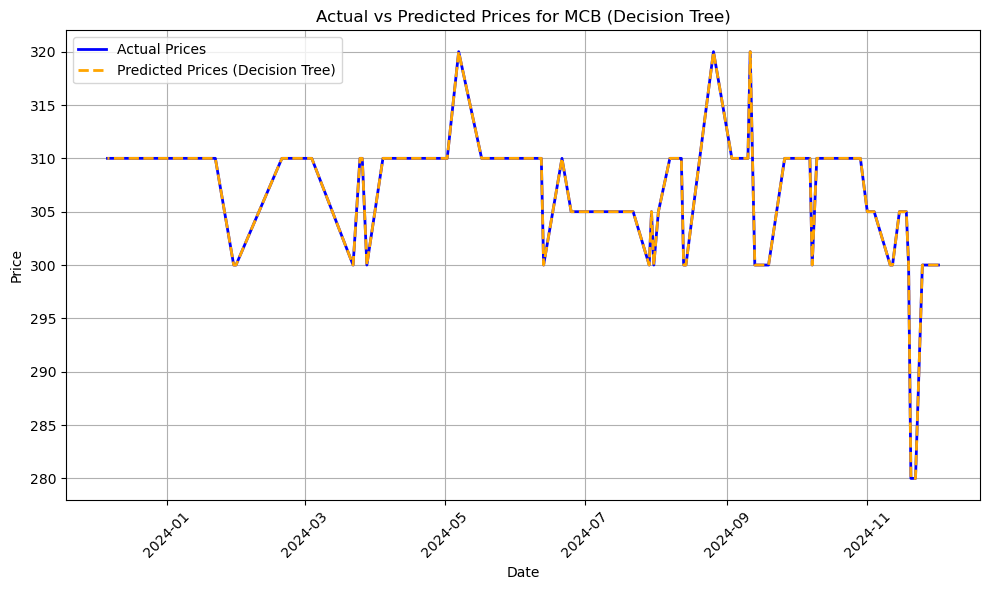

...

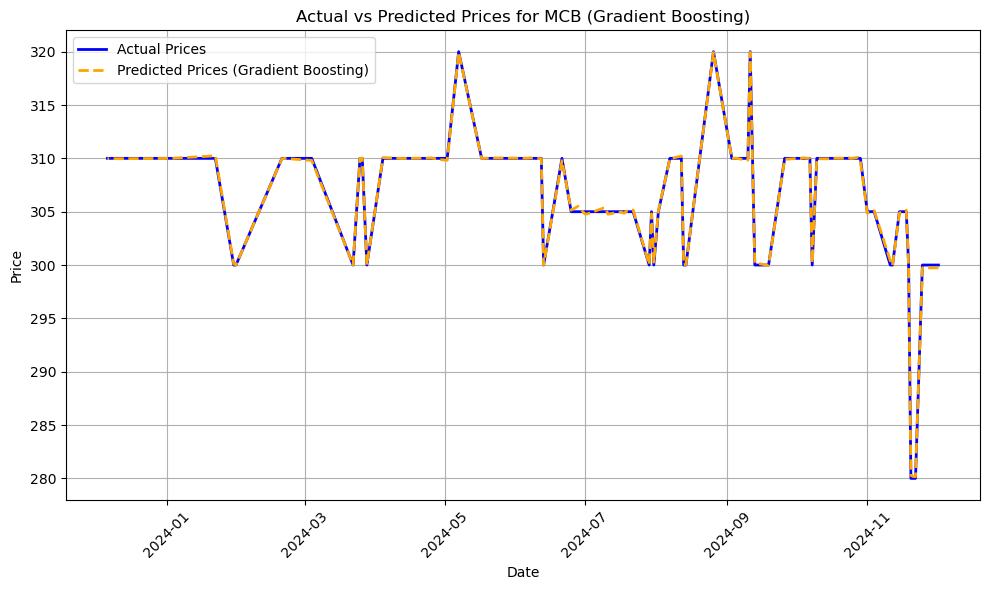

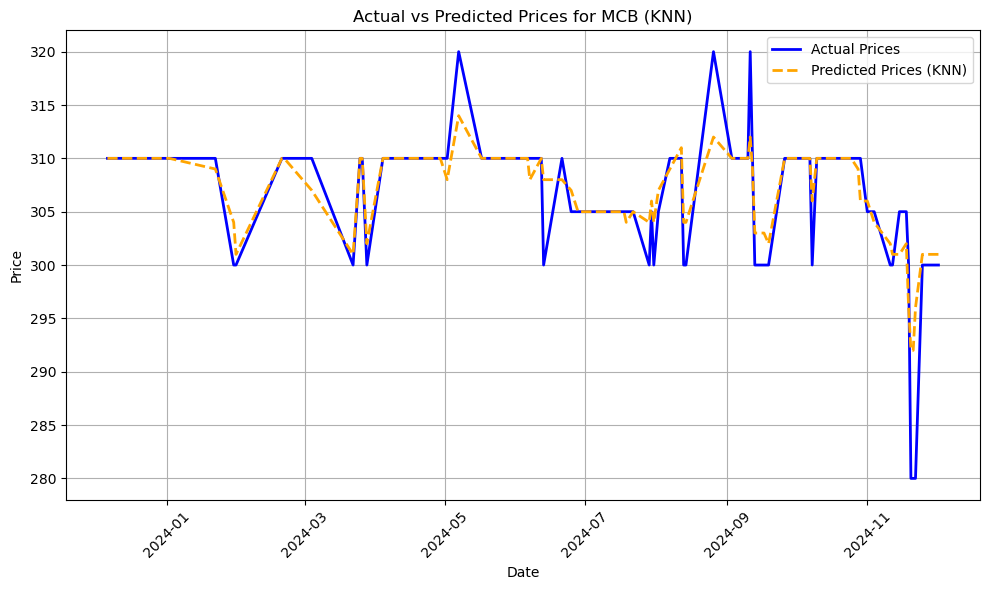

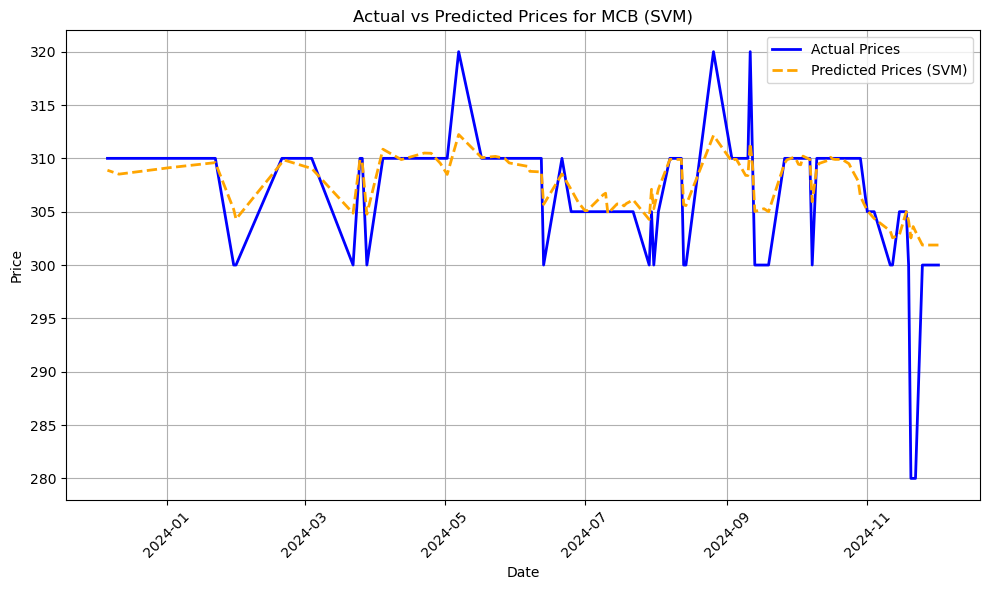

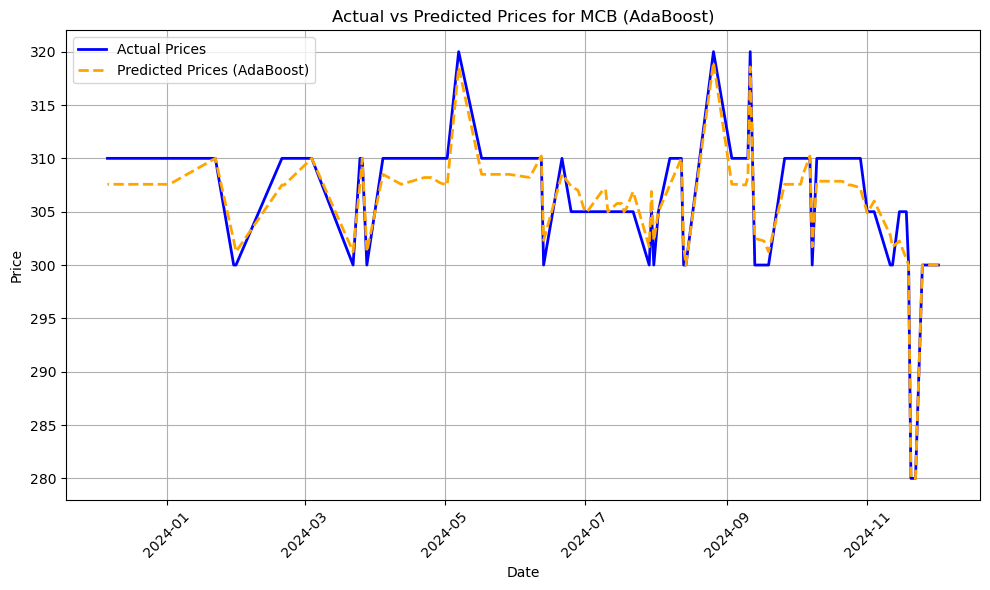

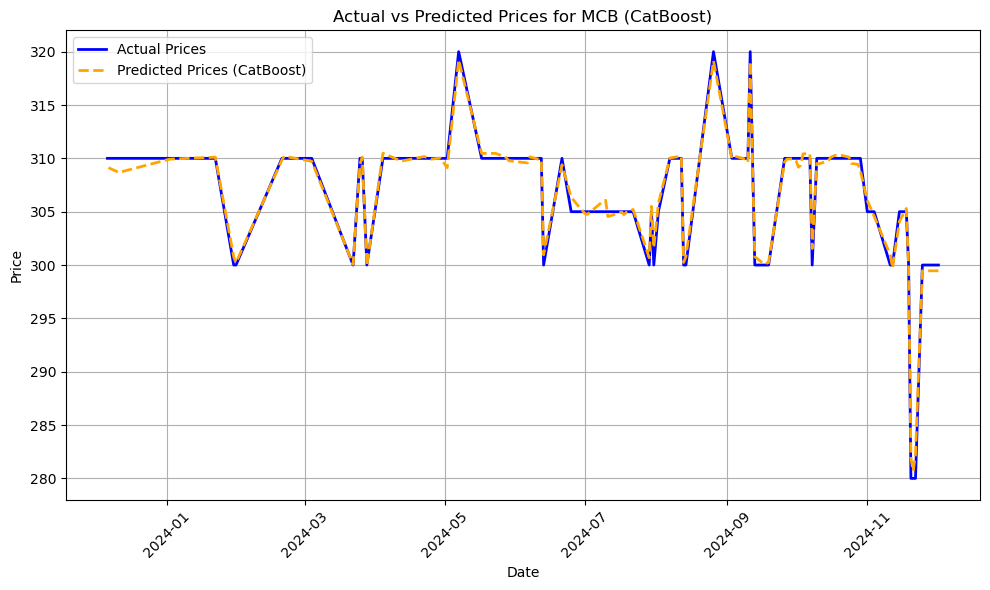


Training models for NICO...
Linear Regression: CV MSE = 18.3103, CV RMSE = 4.2791, CV R² = 0.9831
Ridge Regression: CV MSE = 43.8732, CV RMSE = 6.6237, CV R² = 0.9686
Lasso Regression: CV MSE = 25.9959, CV RMSE = 5.0986, CV R² = 0.9757
Elastic Net: CV MSE = 415.2630, CV RMSE = 20.3780, CV R² = 0.7419
Decision Tree: CV MSE = 3322.2917, CV RMSE = 57.6393, CV R² = -1.5389
Random Forest: CV MSE = 2021.6858, CV RMSE = 44.9632, CV R² = -0.4059
Gradient Boosting: CV MSE = 2218.9502, CV RMSE = 47.1057, CV R² = -0.7017
KNN: CV MSE = 2732.4417, CV RMSE = 52.2728, CV R² = -0.9101
SVM: CV MSE = 15397.6335, CV RMSE = 124.0872, CV R² = -10.3686
AdaBoost: CV MSE = 2742.9582, CV RMSE = 52.3733, CV R² = -1.0234
CatBoost: CV MSE = 2151.3529, CV RMSE = 46.3827, CV R² = -0.4370
Best model for NICO: Linear Regression with CV MSE = 18.3103


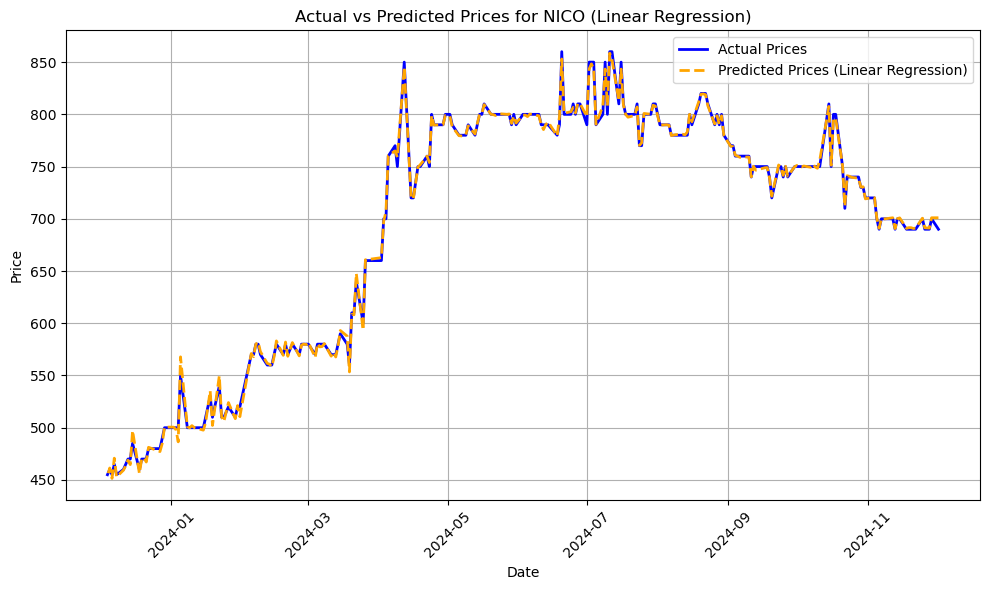

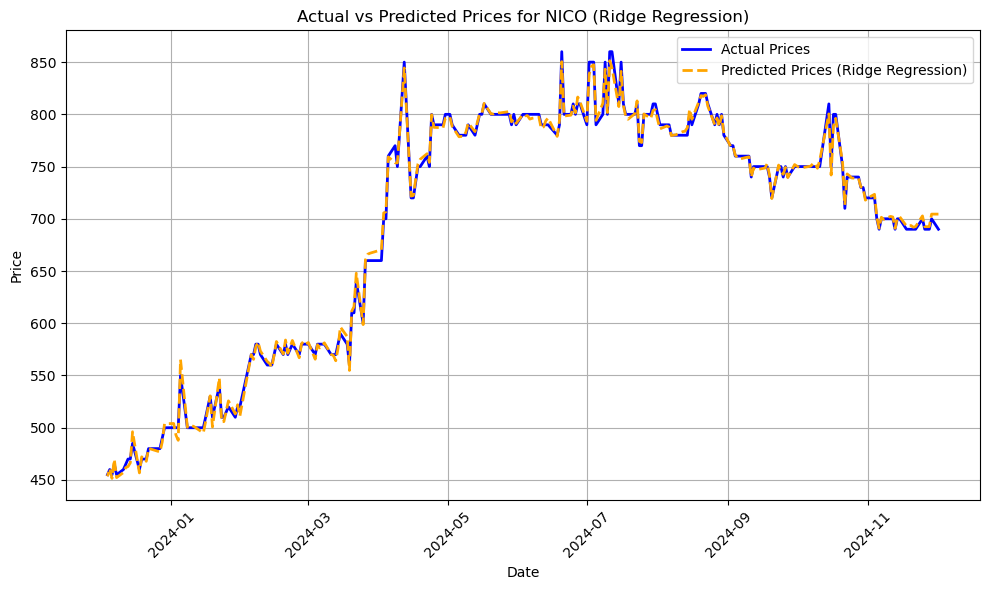

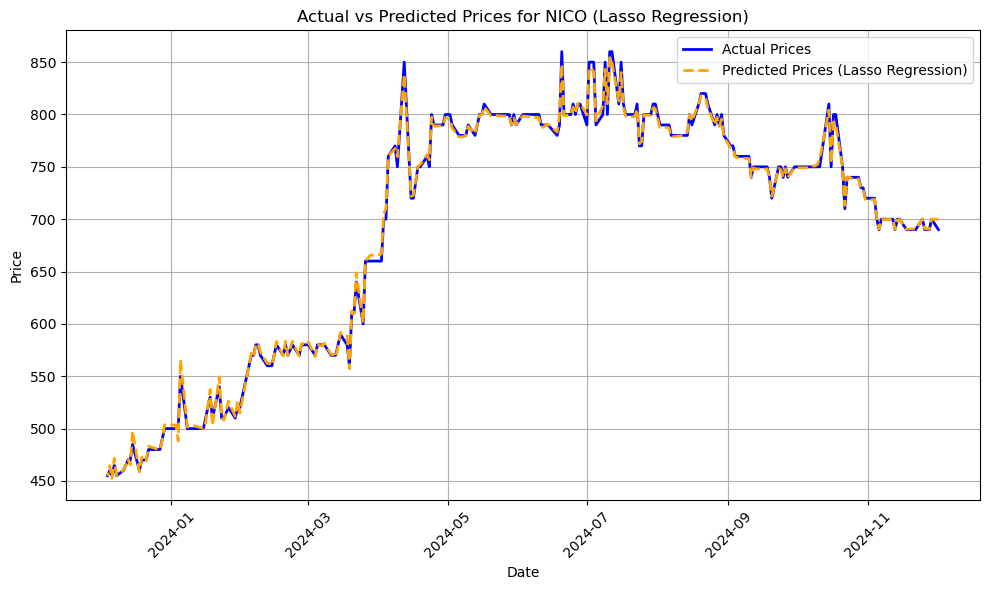

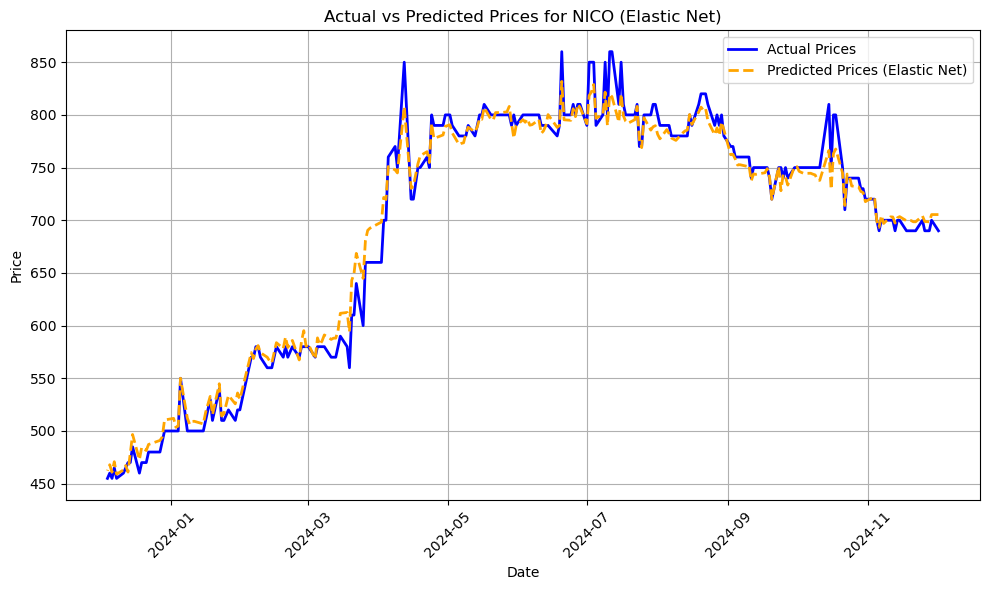

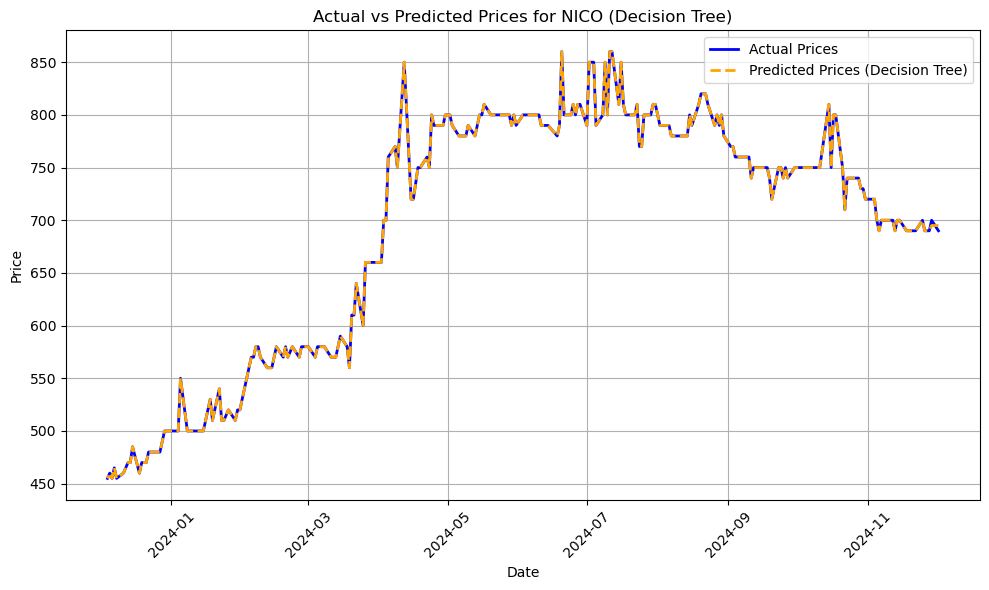

...

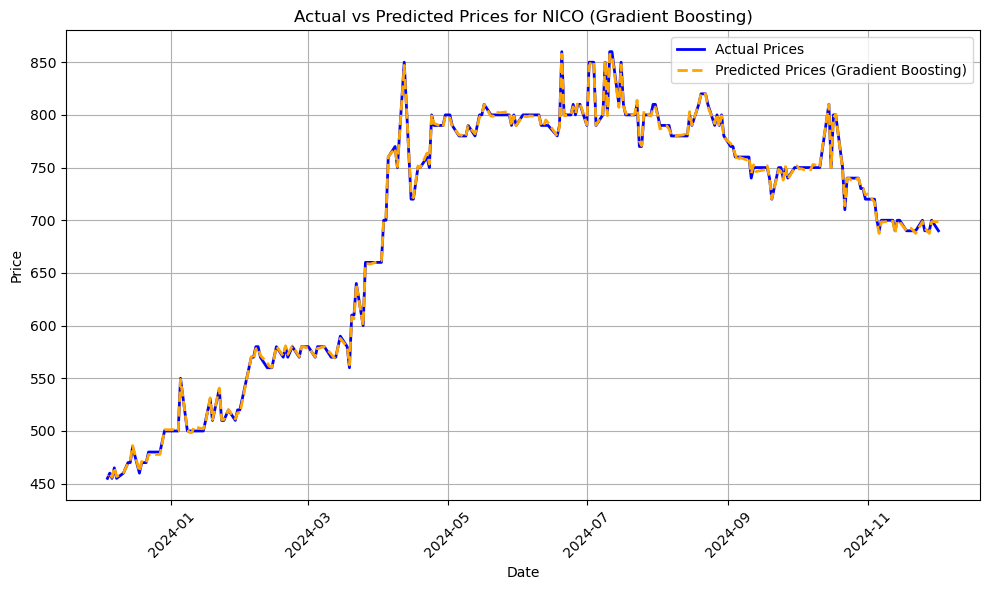

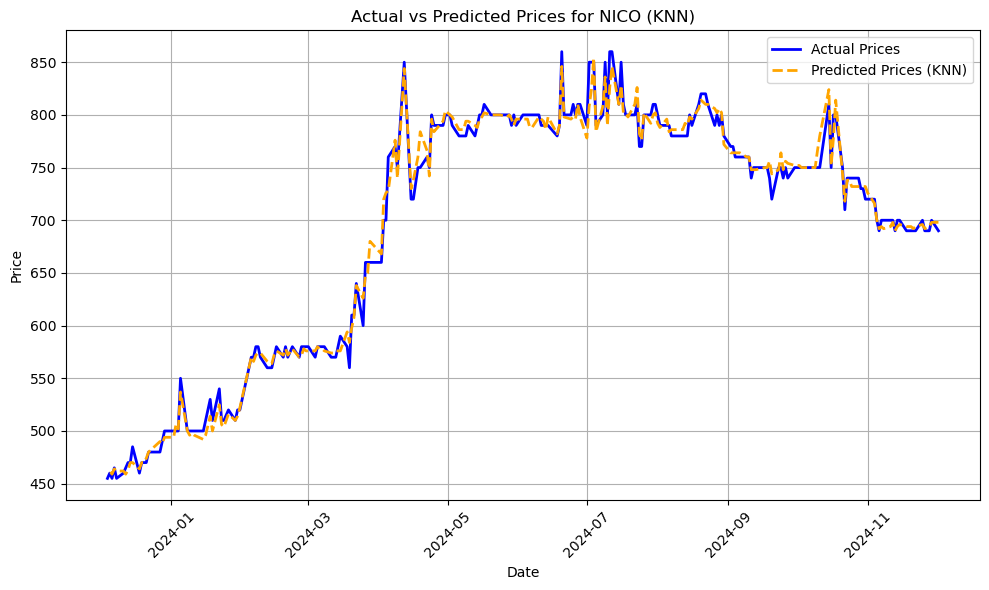

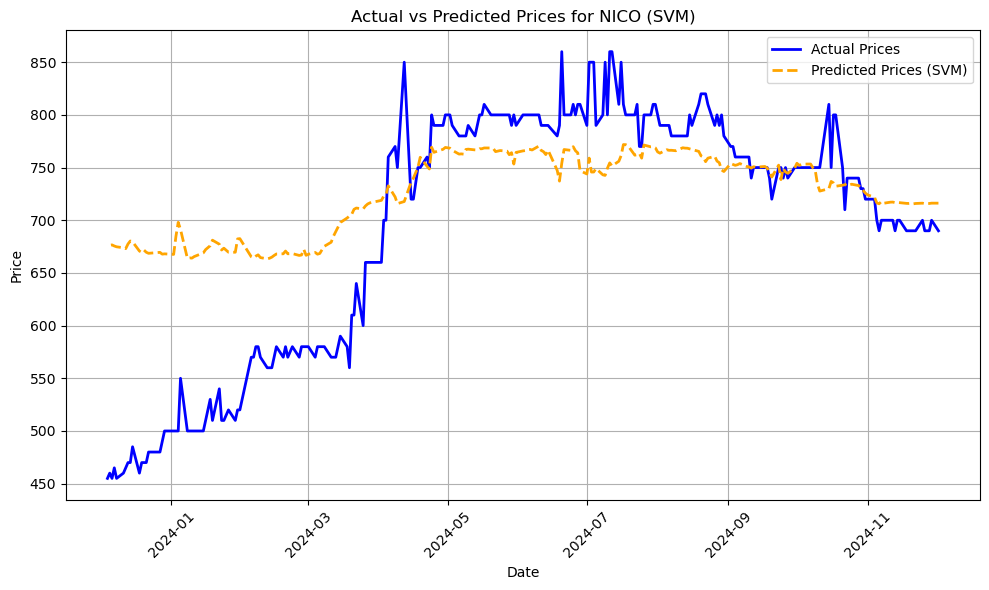

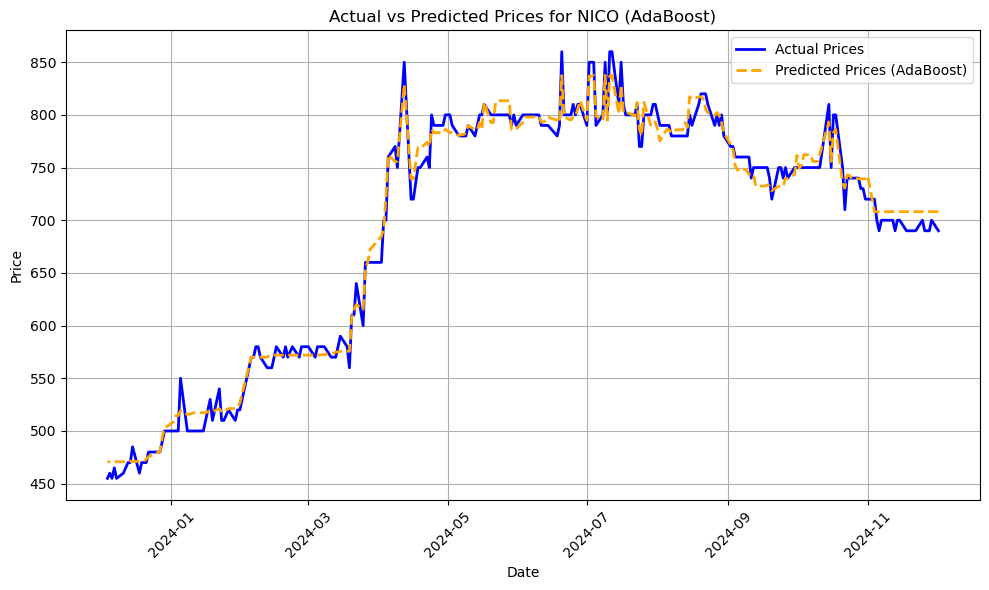

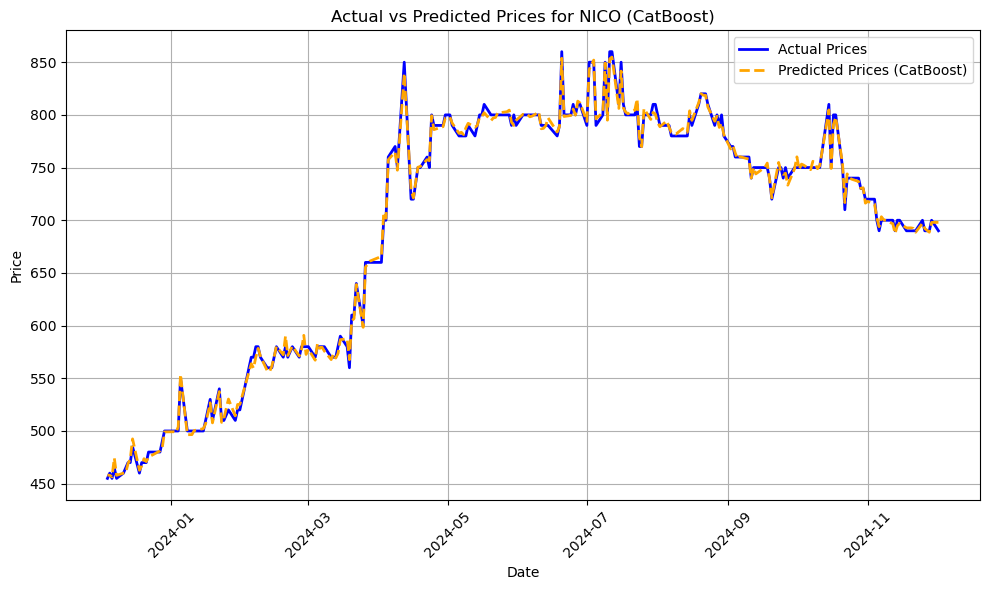


Training models for NMB...
Linear Regression: CV MSE = 38.1359, CV RMSE = 6.1754, CV R² = 0.9930
Ridge Regression: CV MSE = 277.2293, CV RMSE = 16.6502, CV R² = 0.9740
Lasso Regression: CV MSE = 49.6646, CV RMSE = 7.0473, CV R² = 0.9924
Elastic Net: CV MSE = 3574.3888, CV RMSE = 59.7862, CV R² = 0.6032
Decision Tree: CV MSE = 7833.2568, CV RMSE = 88.5057, CV R² = -0.0748
Random Forest: CV MSE = 6408.5935, CV RMSE = 80.0537, CV R² = 0.1787
Gradient Boosting: CV MSE = 5871.3198, CV RMSE = 76.6245, CV R² = -0.1710
KNN: CV MSE = 18202.2463, CV RMSE = 134.9157, CV R² = -2.7282
SVM: CV MSE = 252786.6338, CV RMSE = 502.7789, CV R² = -57.8480
AdaBoost: CV MSE = 10986.1133, CV RMSE = 104.8147, CV R² = -0.7598
CatBoost: CV MSE = 8976.2464, CV RMSE = 94.7431, CV R² = -0.1810
Best model for NMB: Linear Regression with CV MSE = 38.1359


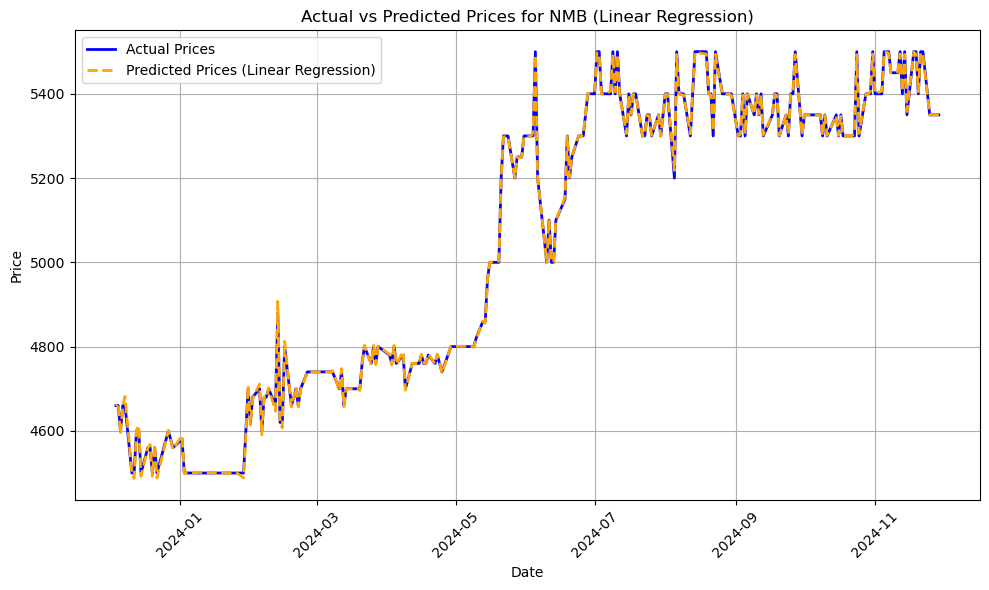

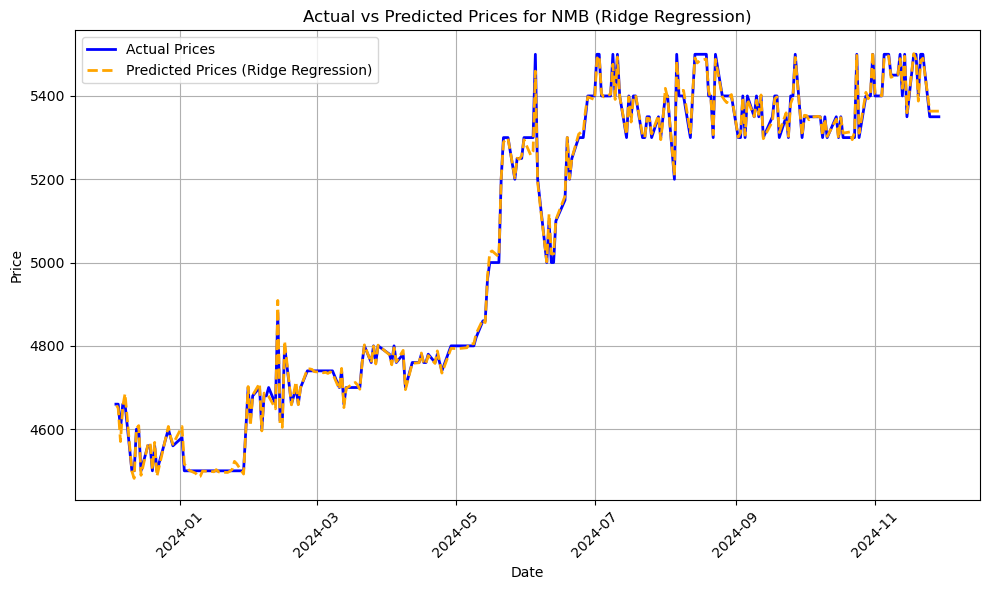

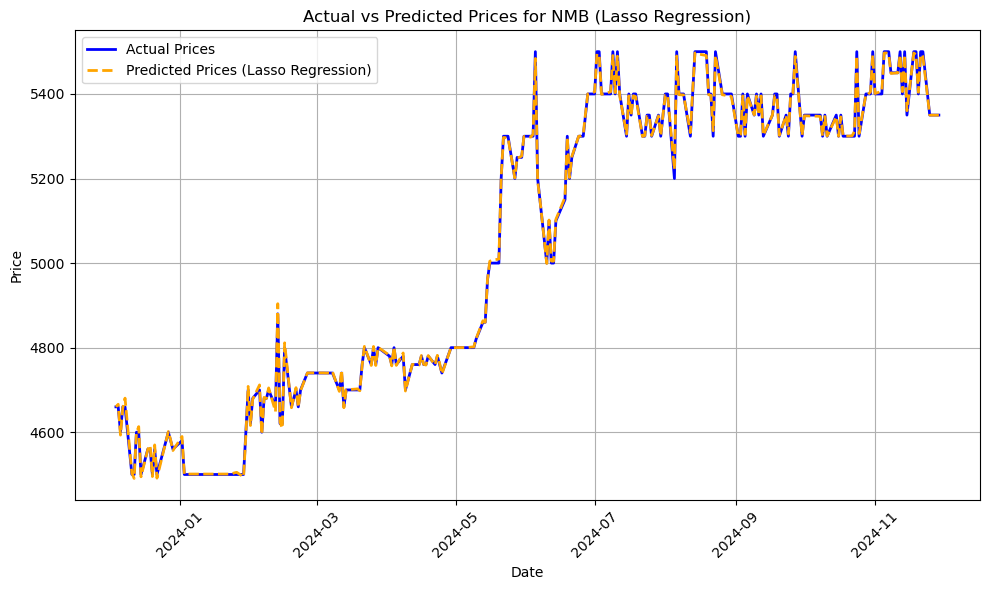

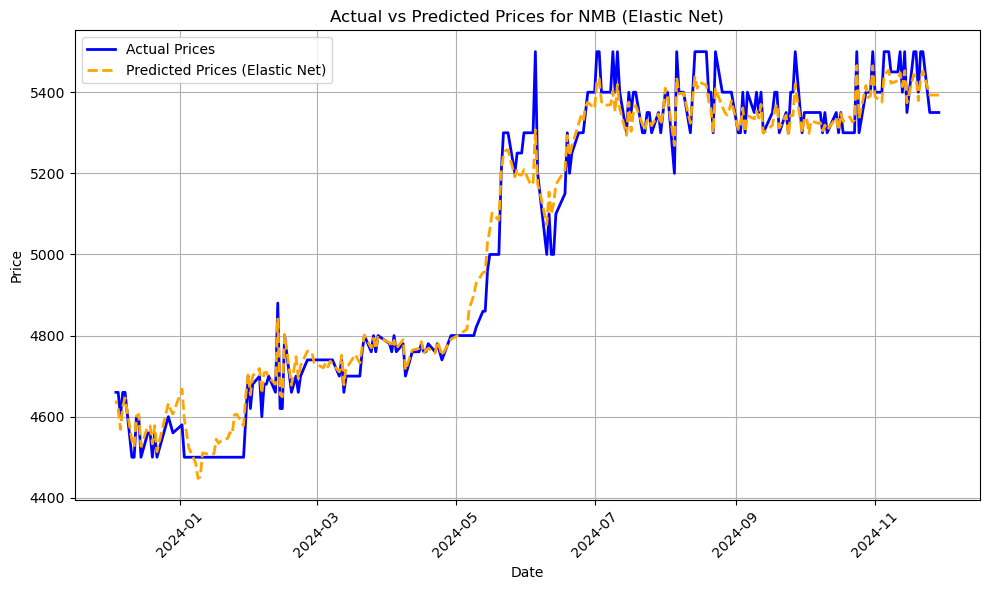

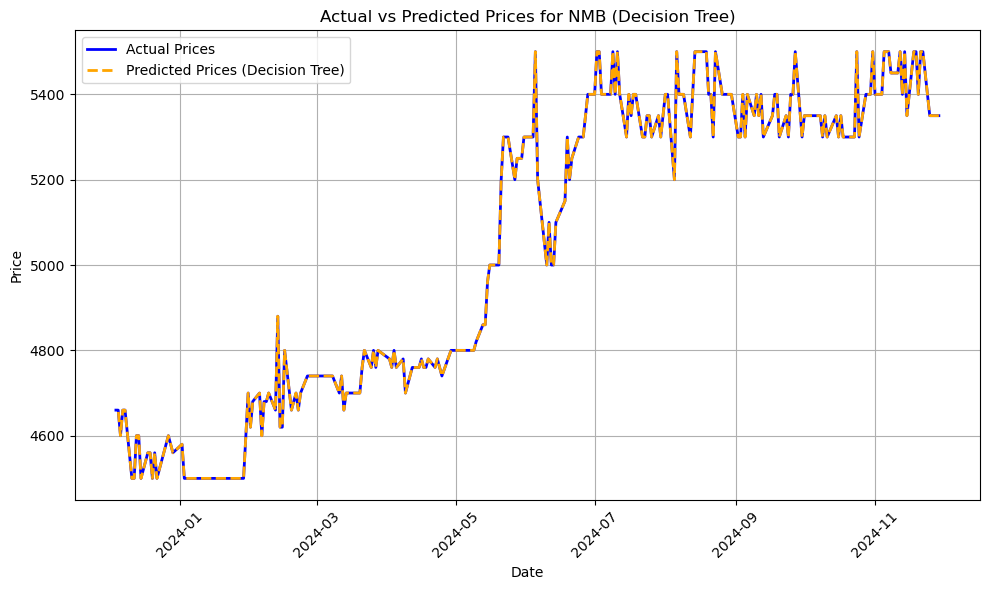

...

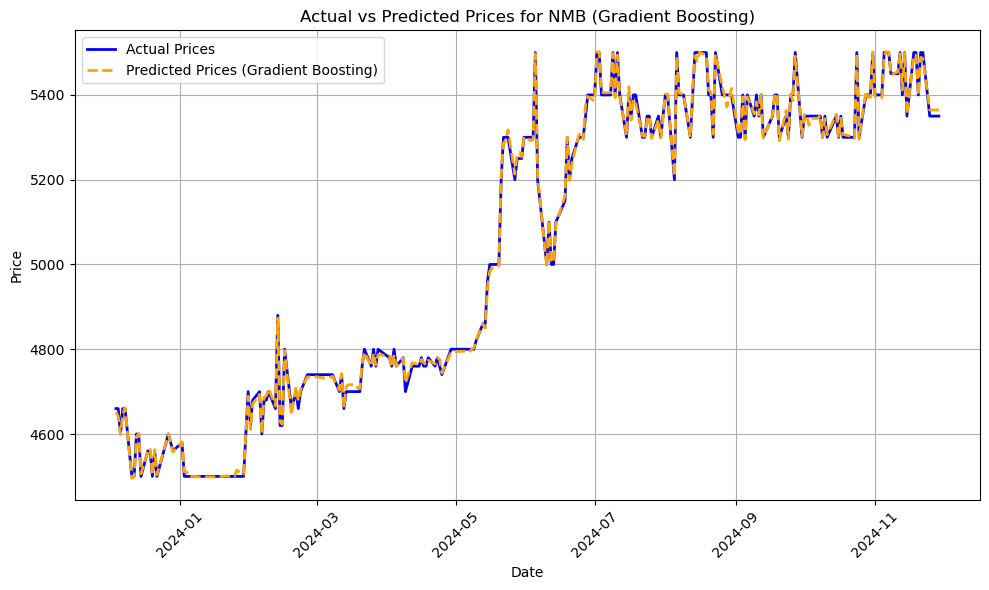

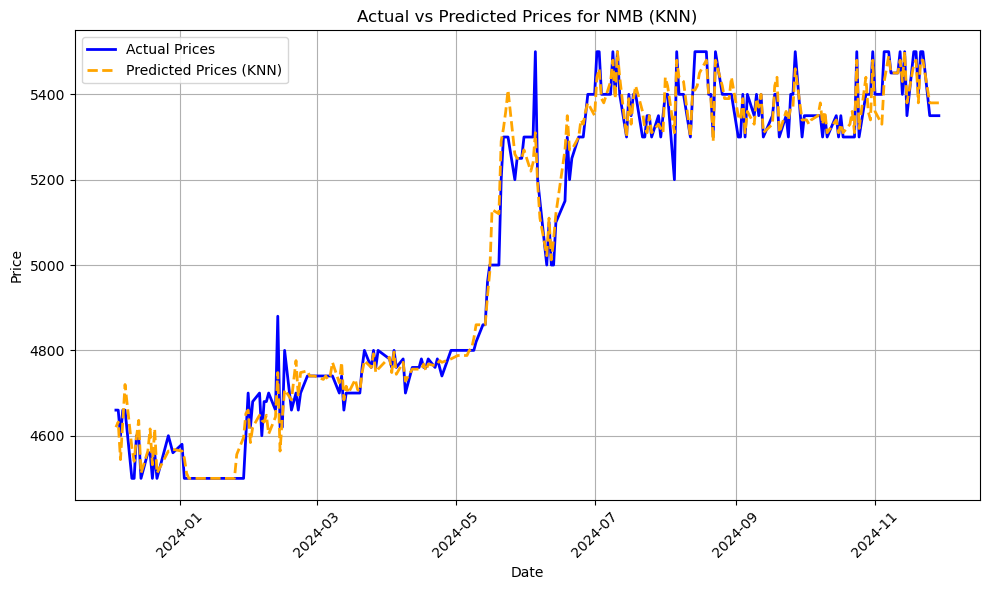

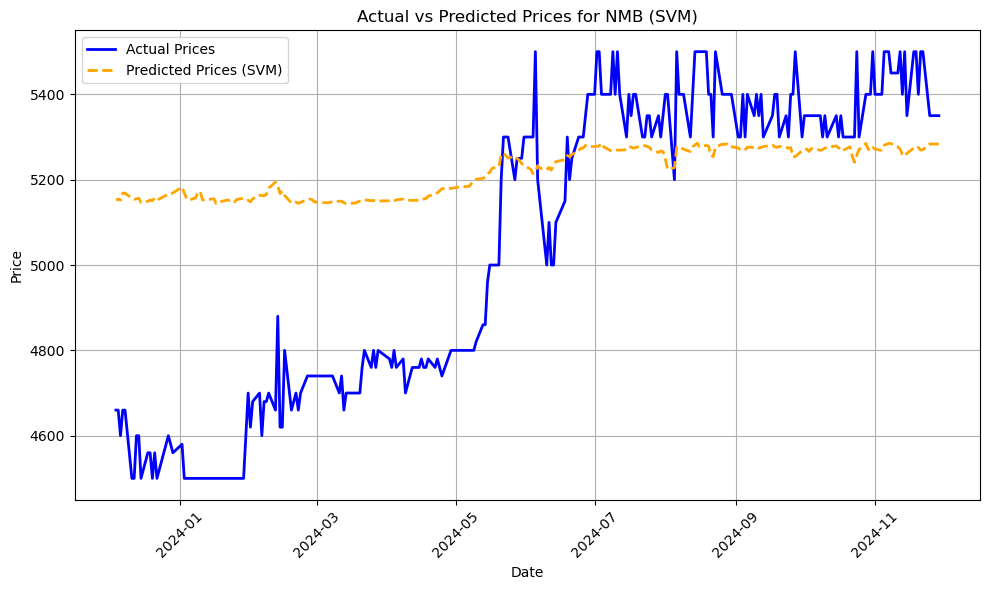

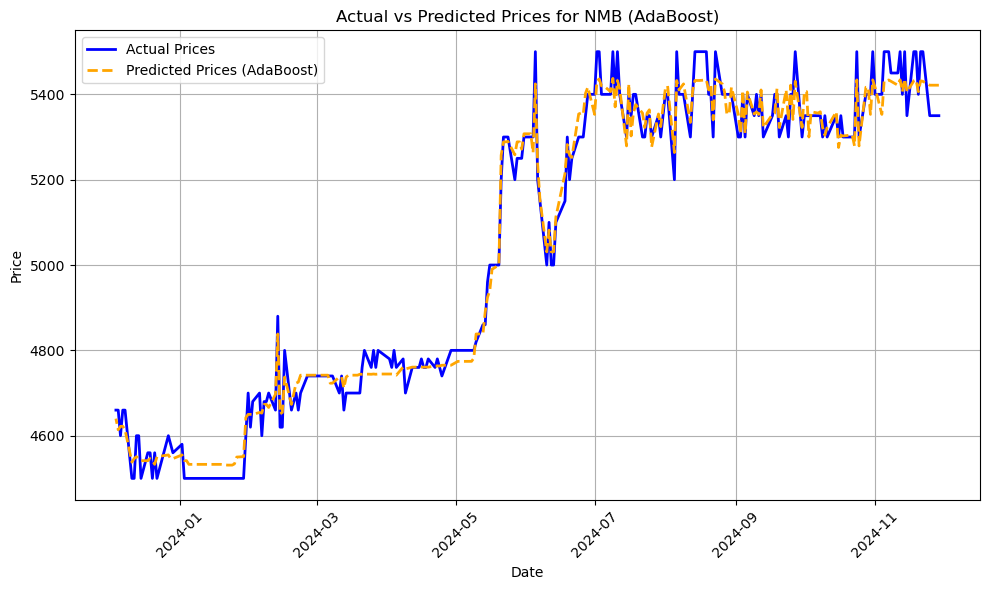

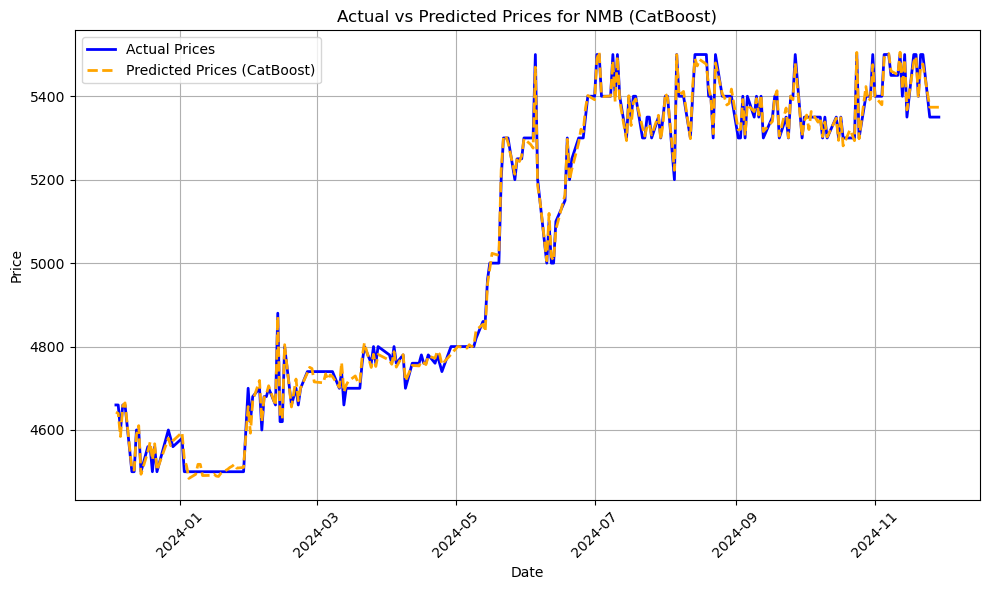


Training models for SWIS...
Linear Regression: CV MSE = 19.4537, CV RMSE = 4.4106, CV R² = 0.9908
Ridge Regression: CV MSE = 57.9293, CV RMSE = 7.6111, CV R² = 0.9779
Lasso Regression: CV MSE = 28.0846, CV RMSE = 5.2995, CV R² = 0.9900
Elastic Net: CV MSE = 1027.3989, CV RMSE = 32.0531, CV R² = 0.6929
Decision Tree: CV MSE = 6416.0000, CV RMSE = 80.0999, CV R² = -1.3716
Random Forest: CV MSE = 2407.7517, CV RMSE = 49.0688, CV R² = 0.2720
Gradient Boosting: CV MSE = 2702.1430, CV RMSE = 51.9821, CV R² = 0.2221
KNN: CV MSE = 2580.9219, CV RMSE = 50.8028, CV R² = 0.2141
SVM: CV MSE = 13081.9914, CV RMSE = 114.3765, CV R² = -5.2710
AdaBoost: CV MSE = 2913.2190, CV RMSE = 53.9742, CV R² = 0.1016
CatBoost: CV MSE = 2727.2784, CV RMSE = 52.2234, CV R² = 0.3031
Best model for SWIS: Linear Regression with CV MSE = 19.4537


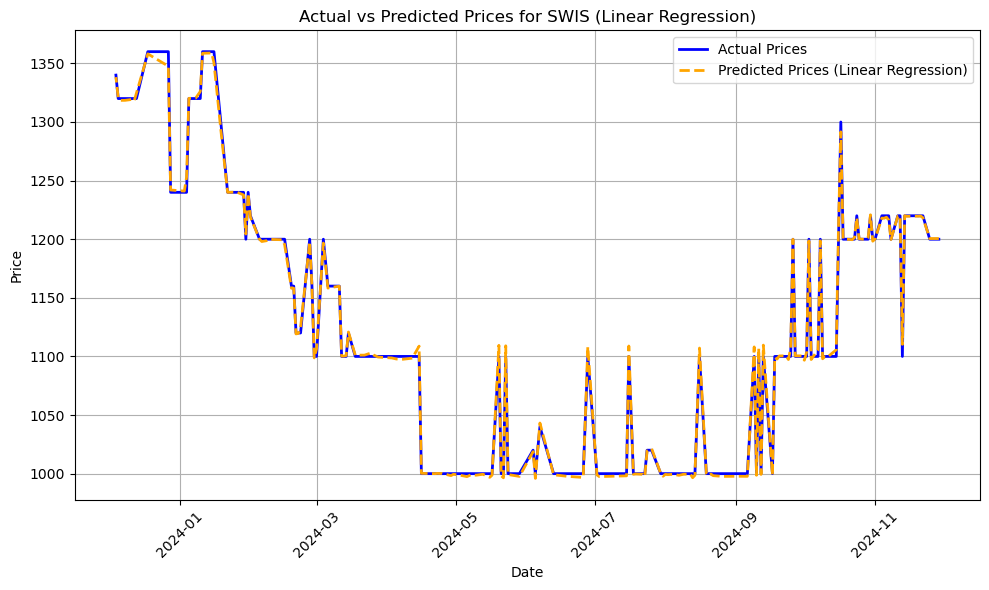

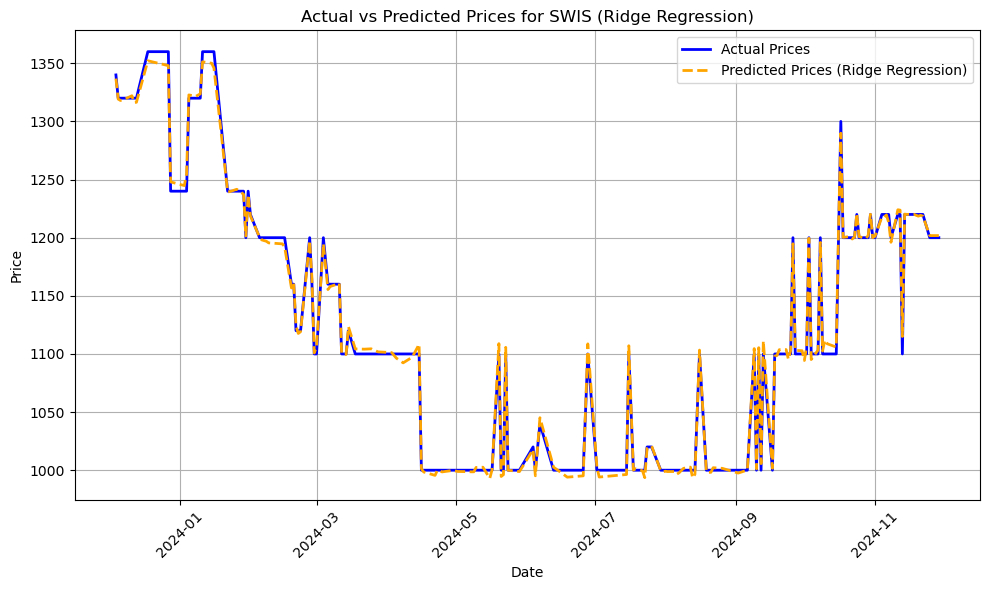

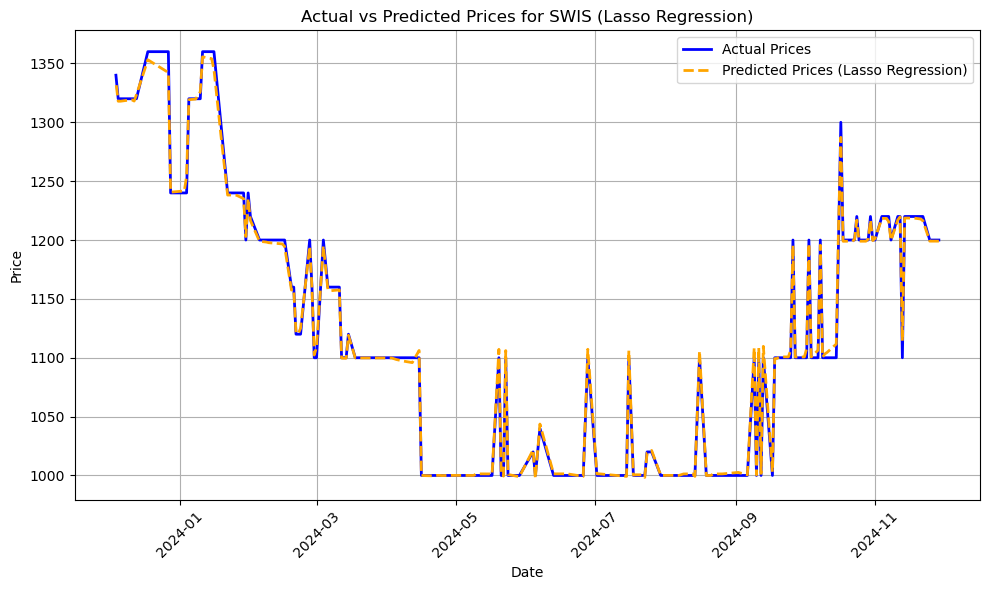

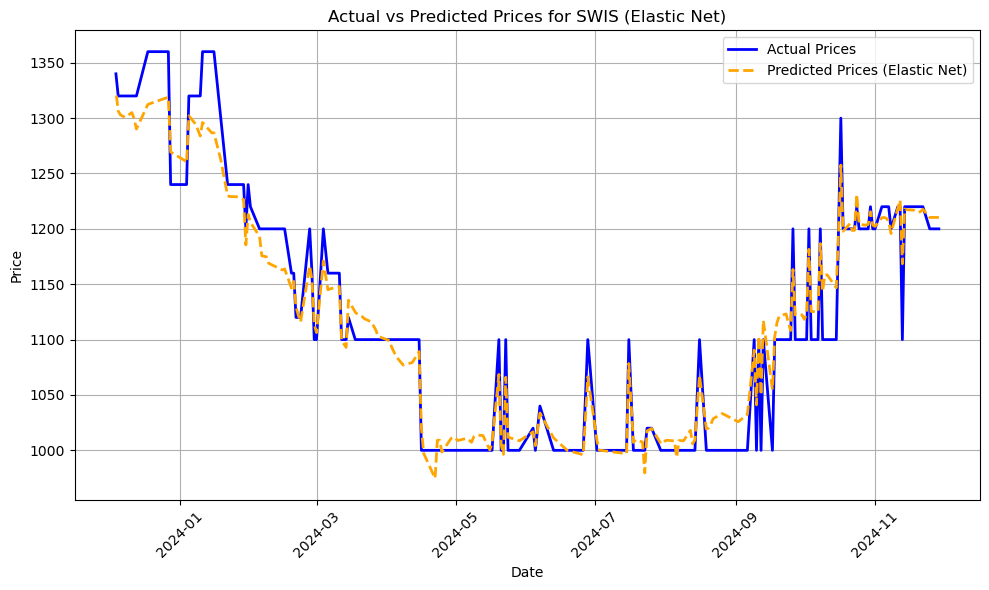

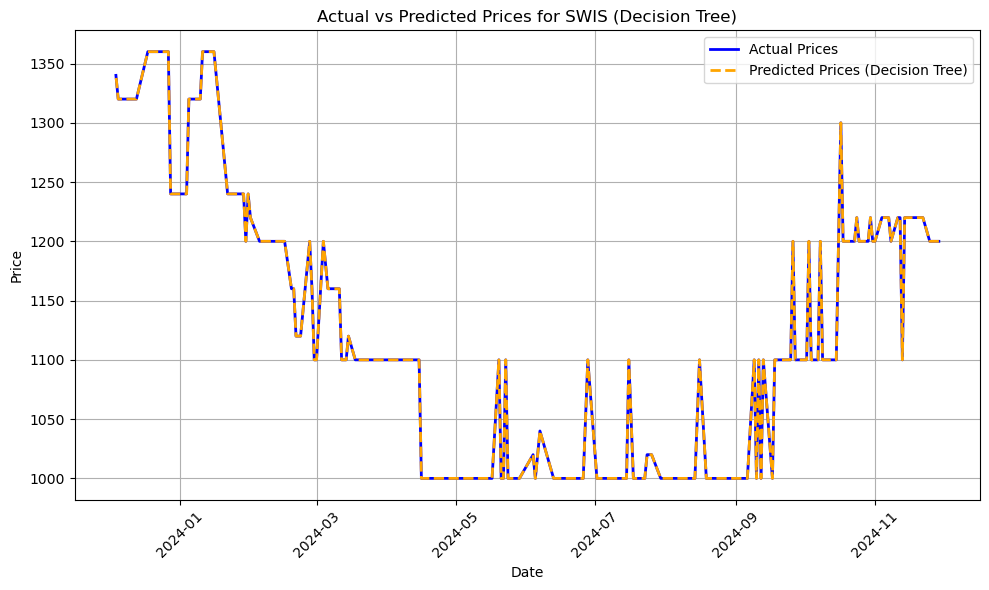

...

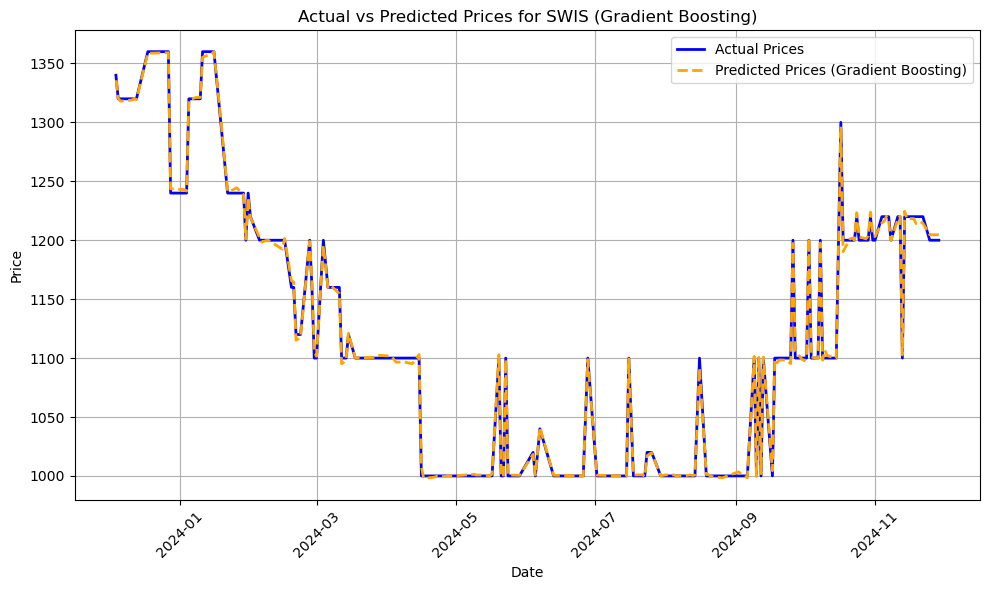

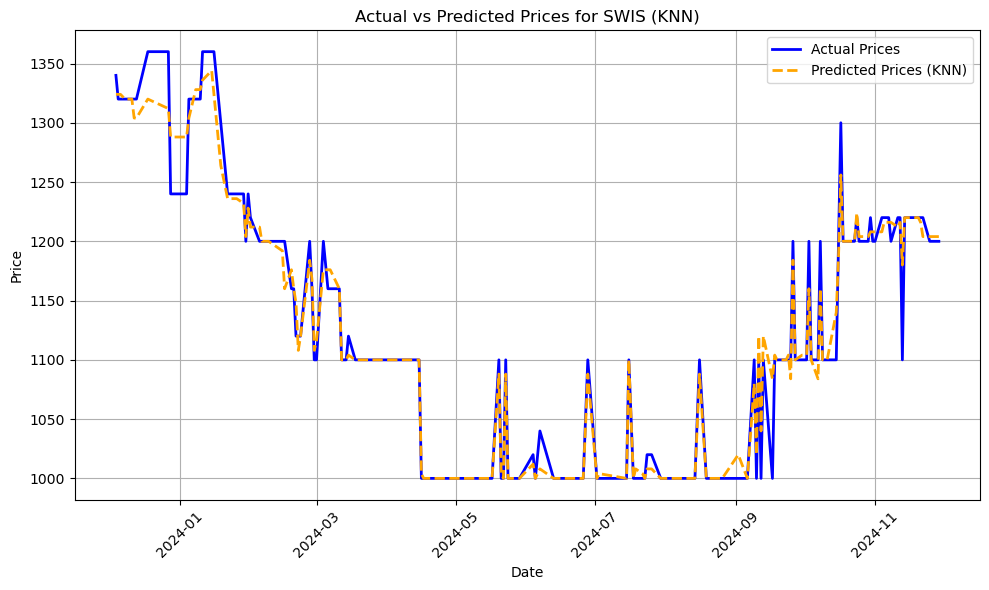

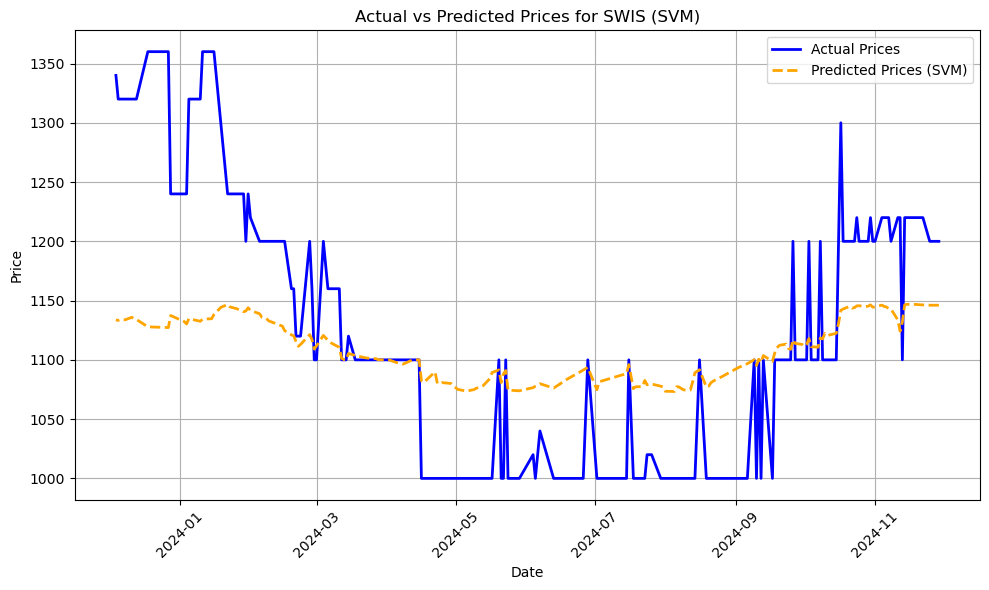

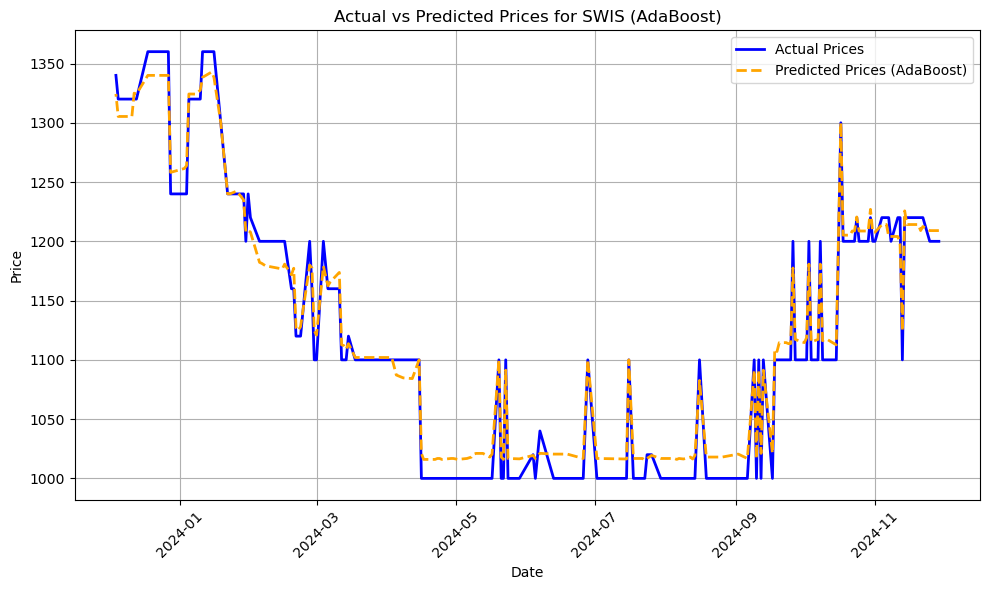

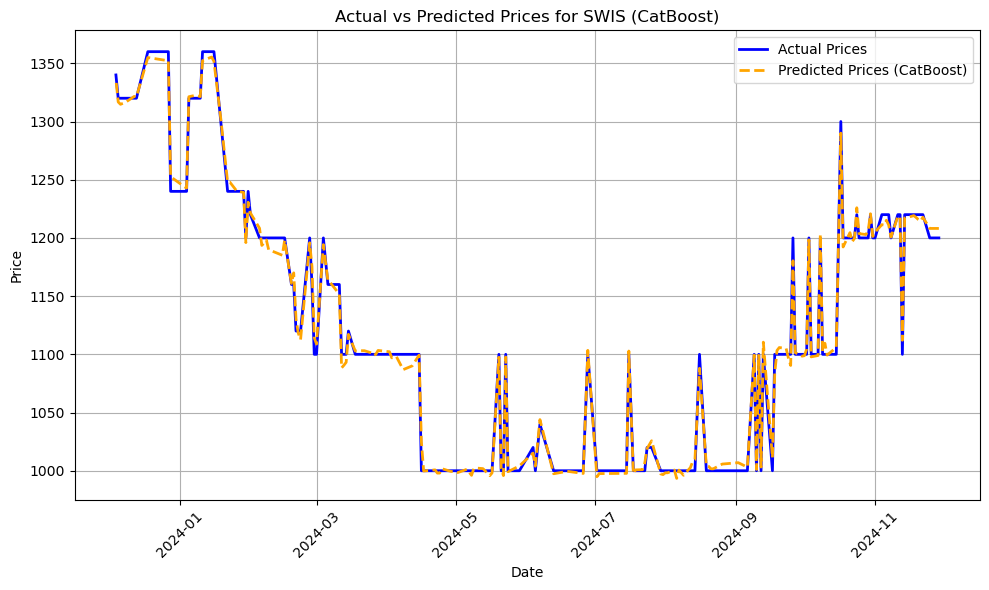


Training models for TCCL...
Linear Regression: CV MSE = 124.3020, CV RMSE = 11.1491, CV R² = 0.9914
Ridge Regression: CV MSE = 280.8088, CV RMSE = 16.7573, CV R² = 0.9794
Lasso Regression: CV MSE = 126.4094, CV RMSE = 11.2432, CV R² = 0.9925
Elastic Net: CV MSE = 4301.7543, CV RMSE = 65.5878, CV R² = 0.6589
Decision Tree: CV MSE = 19604.7795, CV RMSE = 140.0171, CV R² = -0.4916
Random Forest: CV MSE = 13152.2931, CV RMSE = 114.6834, CV R² = 0.0601
Gradient Boosting: CV MSE = 10405.0269, CV RMSE = 102.0050, CV R² = 0.2392
KNN: CV MSE = 9173.2848, CV RMSE = 95.7773, CV R² = 0.2046
SVM: CV MSE = 72237.5749, CV RMSE = 268.7705, CV R² = -3.3626
AdaBoost: CV MSE = 14110.6913, CV RMSE = 118.7884, CV R² = -0.0350
CatBoost: CV MSE = 12603.7741, CV RMSE = 112.2665, CV R² = 0.1446
Best model for TCCL: Linear Regression with CV MSE = 124.3020


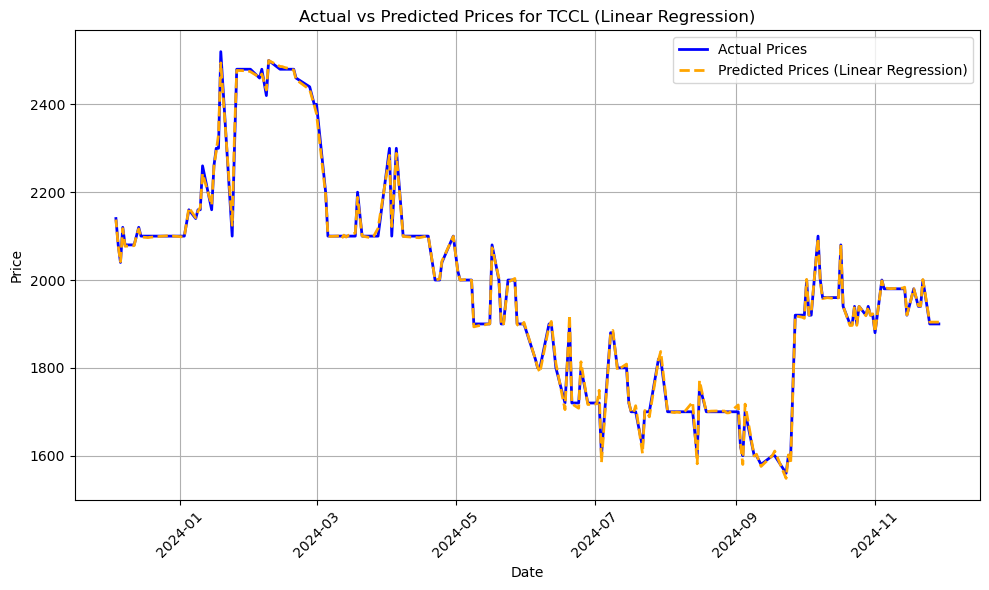

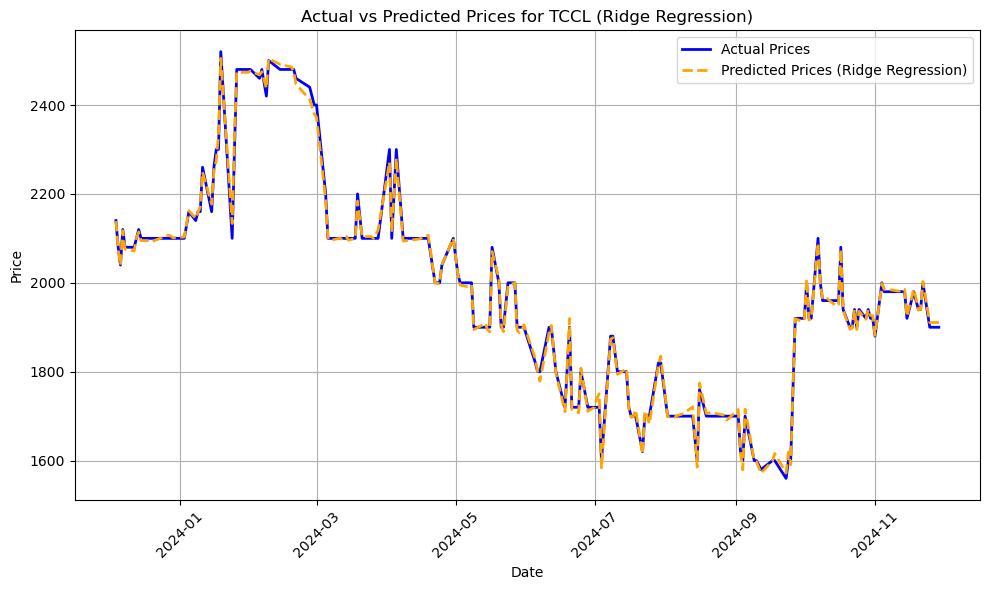

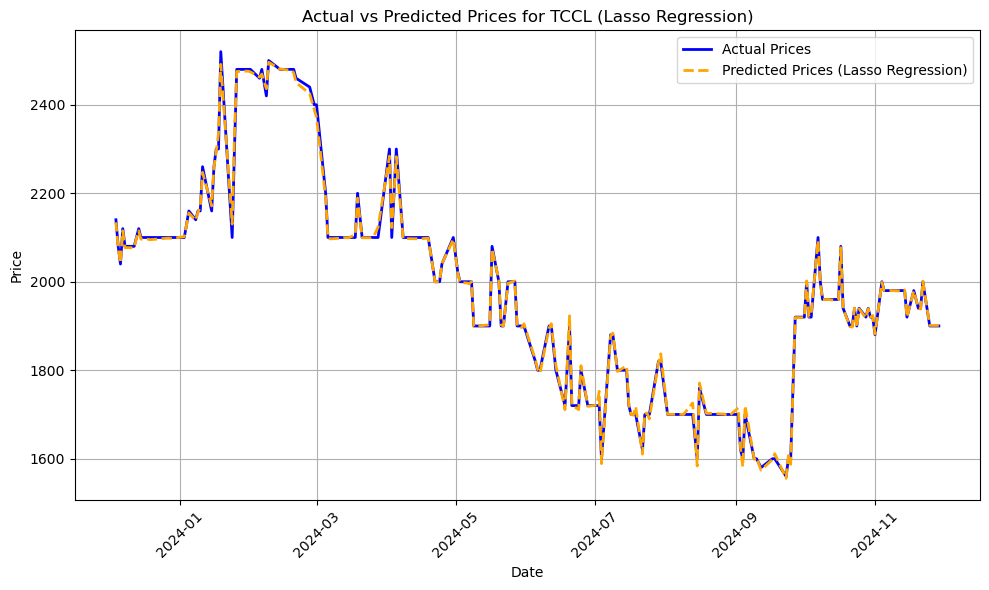

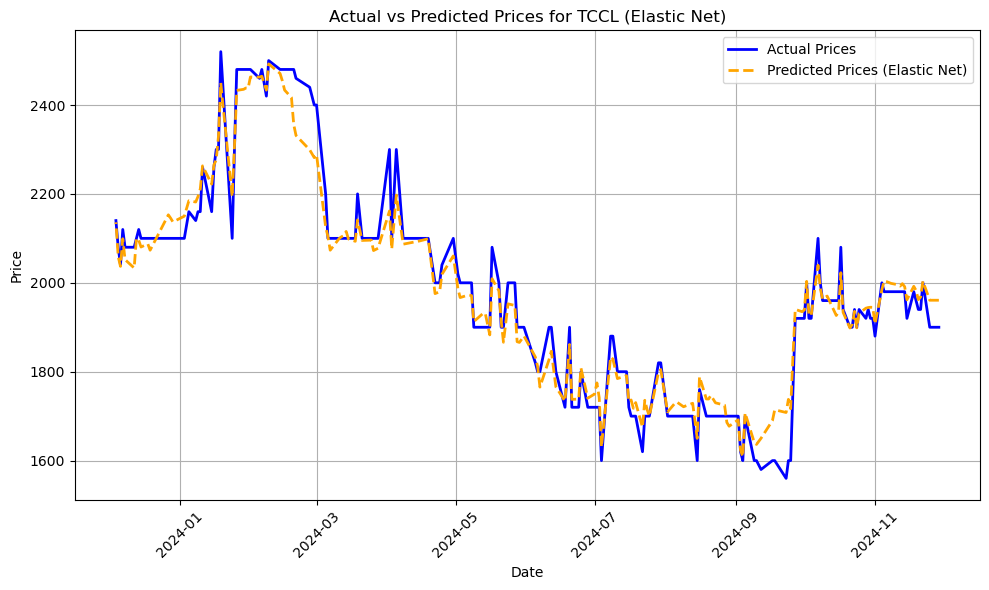

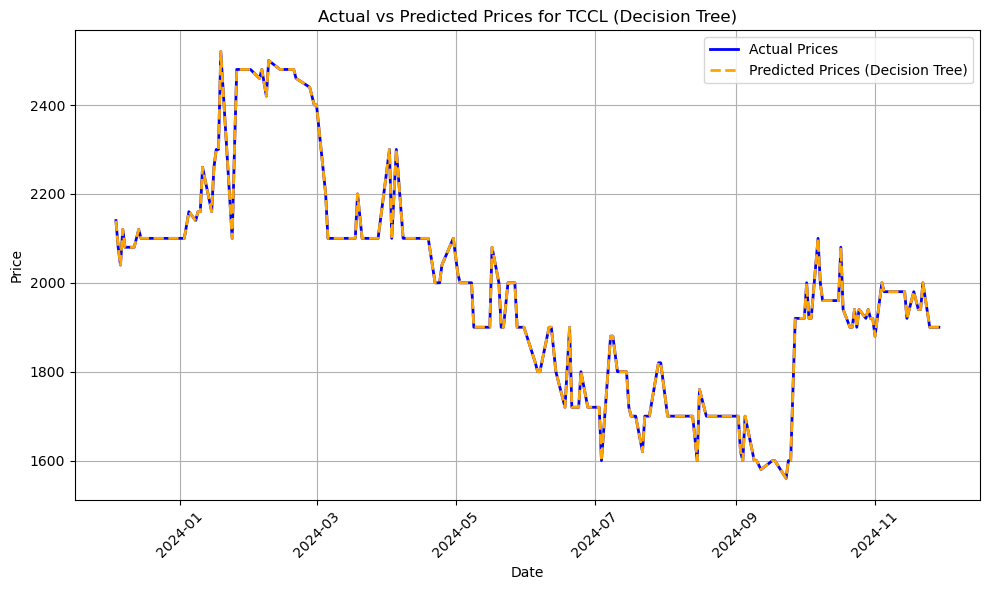

...

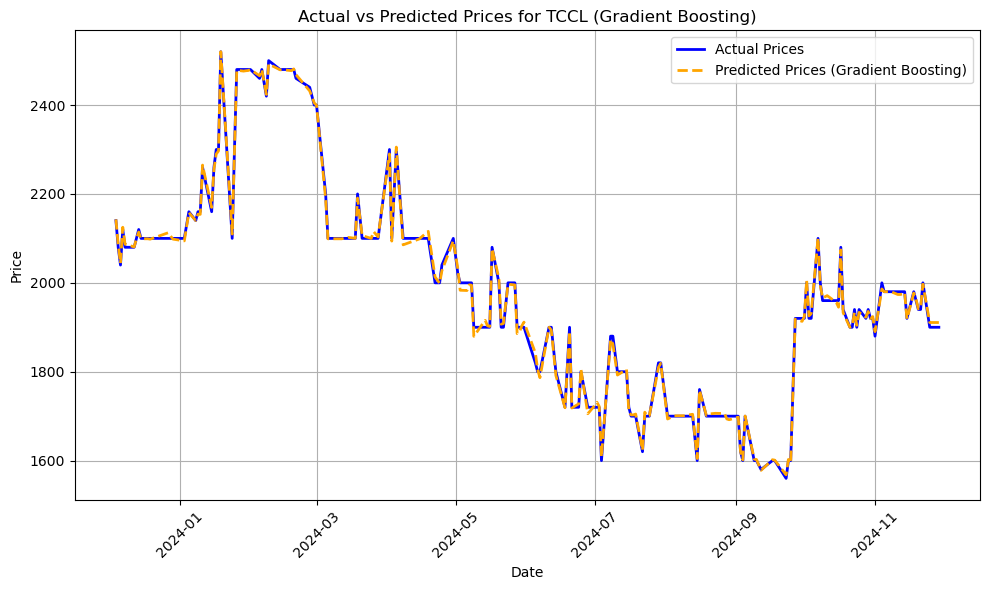

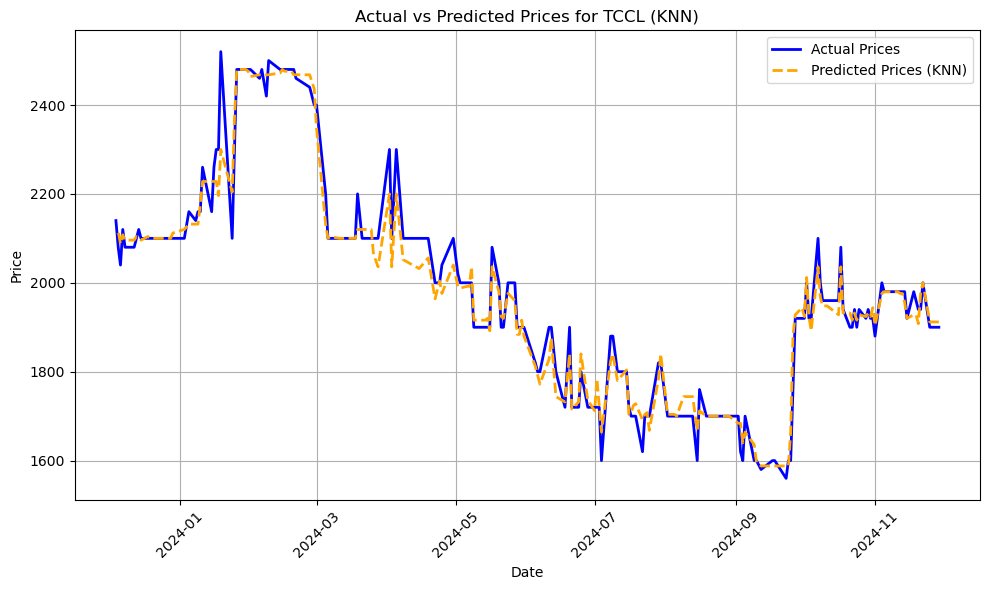

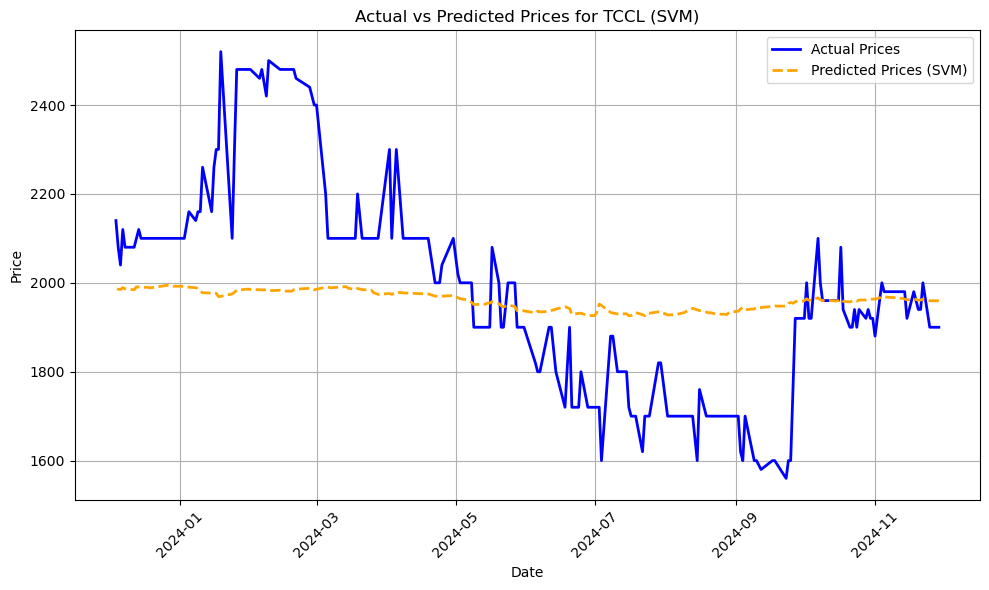

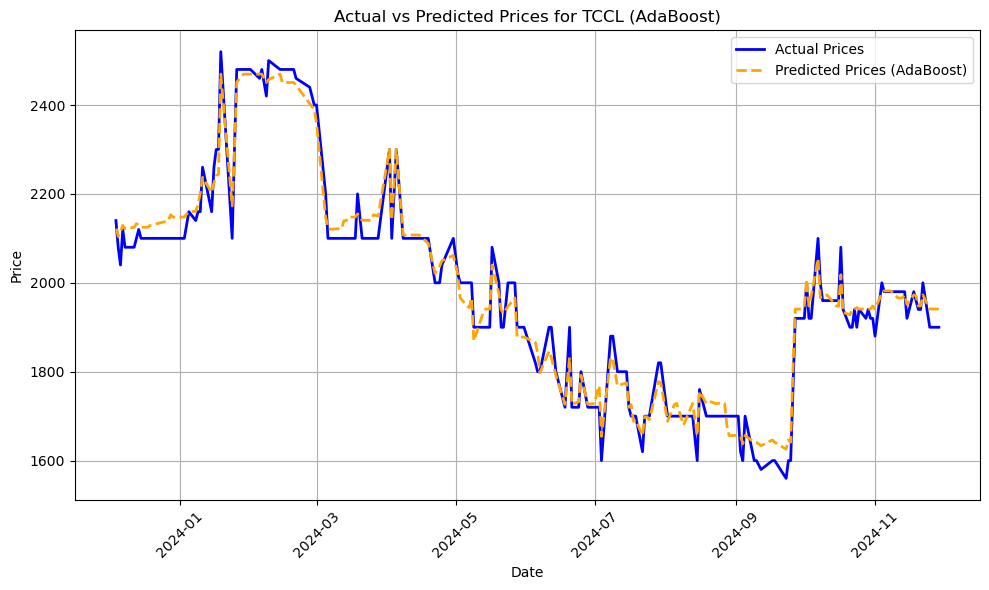

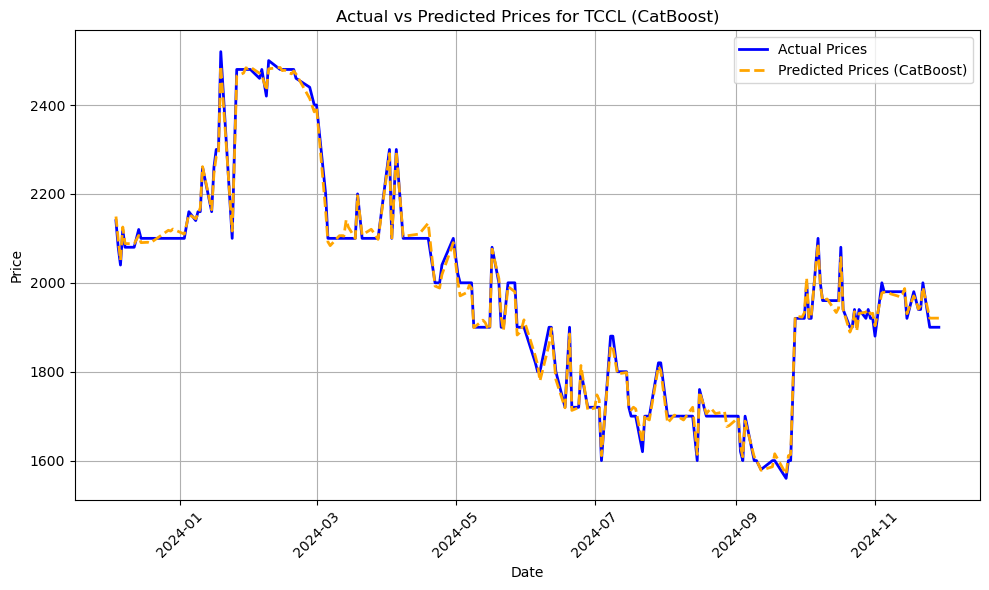


Training models for TPCC...
Linear Regression: CV MSE = 59.0847, CV RMSE = 7.6867, CV R² = 0.9916
Ridge Regression: CV MSE = 168.6843, CV RMSE = 12.9879, CV R² = 0.9773
Lasso Regression: CV MSE = 68.5778, CV RMSE = 8.2812, CV R² = 0.9897
Elastic Net: CV MSE = 2487.8368, CV RMSE = 49.8782, CV R² = 0.6441
Decision Tree: CV MSE = 9175.8002, CV RMSE = 95.7904, CV R² = -0.0864
Random Forest: CV MSE = 6343.6124, CV RMSE = 79.6468, CV R² = 0.1536
Gradient Boosting: CV MSE = 5253.1009, CV RMSE = 72.4783, CV R² = 0.3290
KNN: CV MSE = 15111.8801, CV RMSE = 122.9304, CV R² = -1.0429
SVM: CV MSE = 116771.6538, CV RMSE = 341.7187, CV R² = -15.5016
AdaBoost: CV MSE = 7023.4146, CV RMSE = 83.8058, CV R² = 0.0793
CatBoost: CV MSE = 8108.1903, CV RMSE = 90.0455, CV R² = -0.1271
Best model for TPCC: Linear Regression with CV MSE = 59.0847


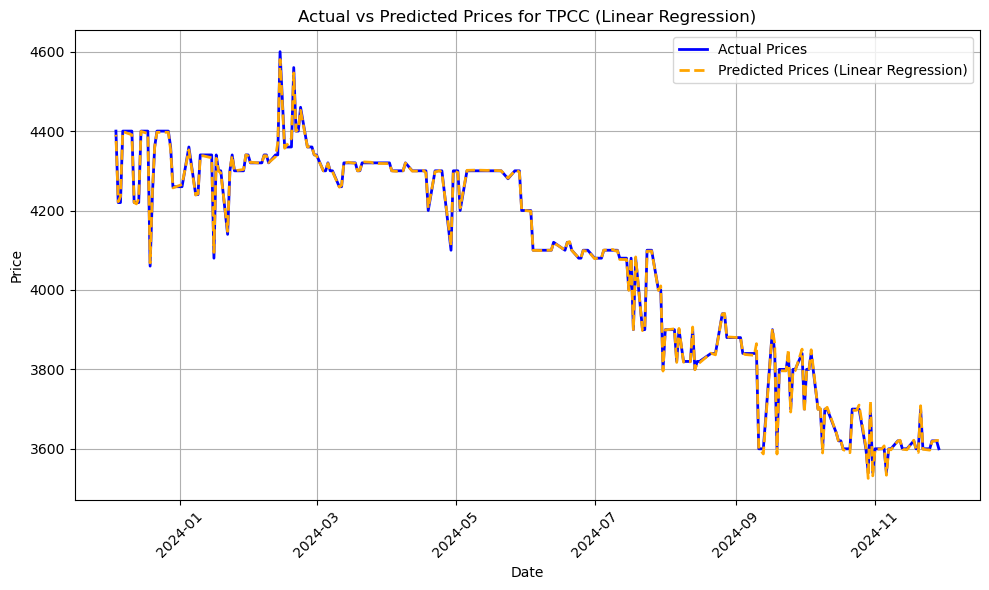

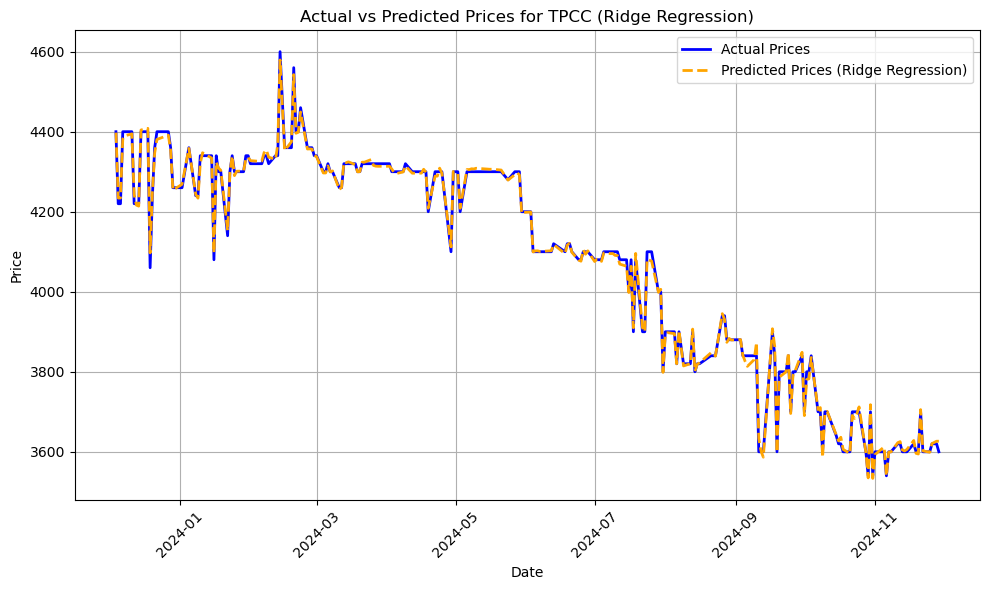

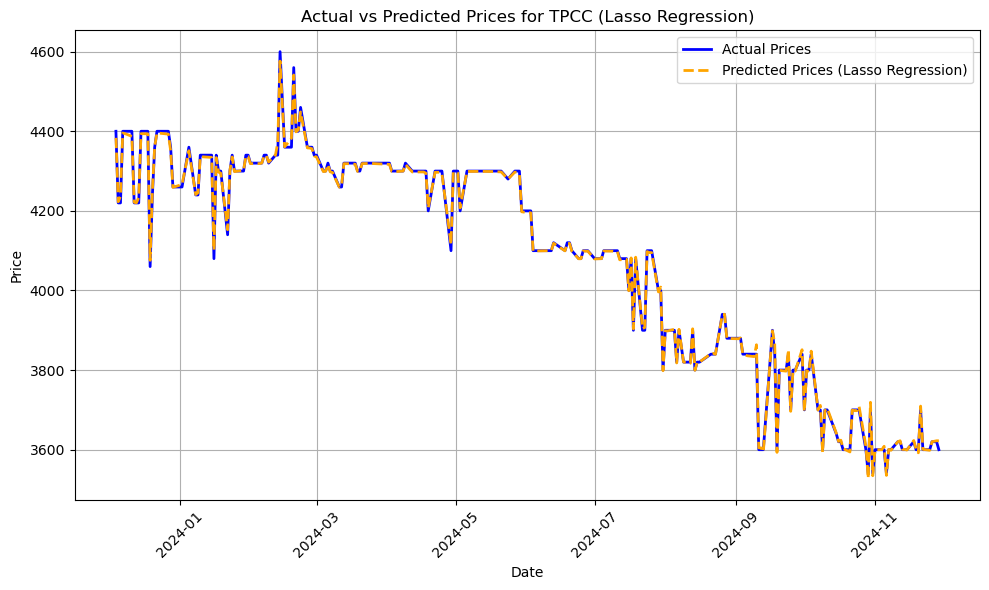

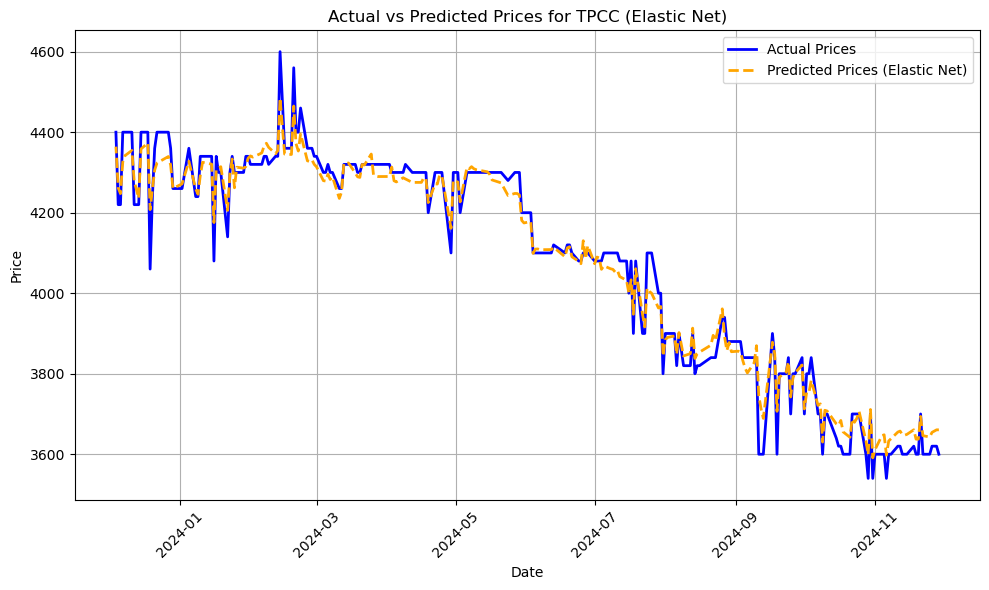

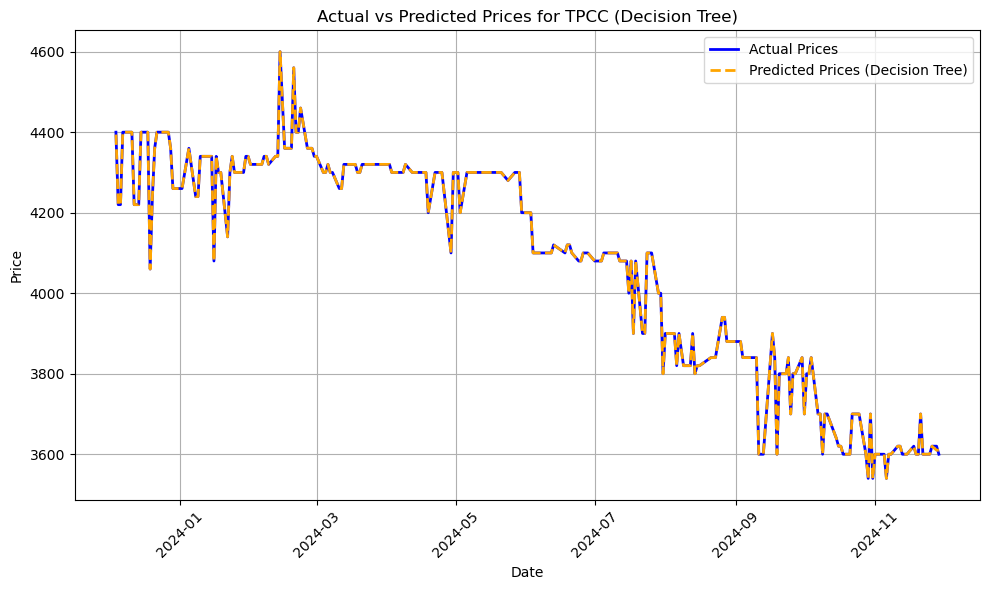

...

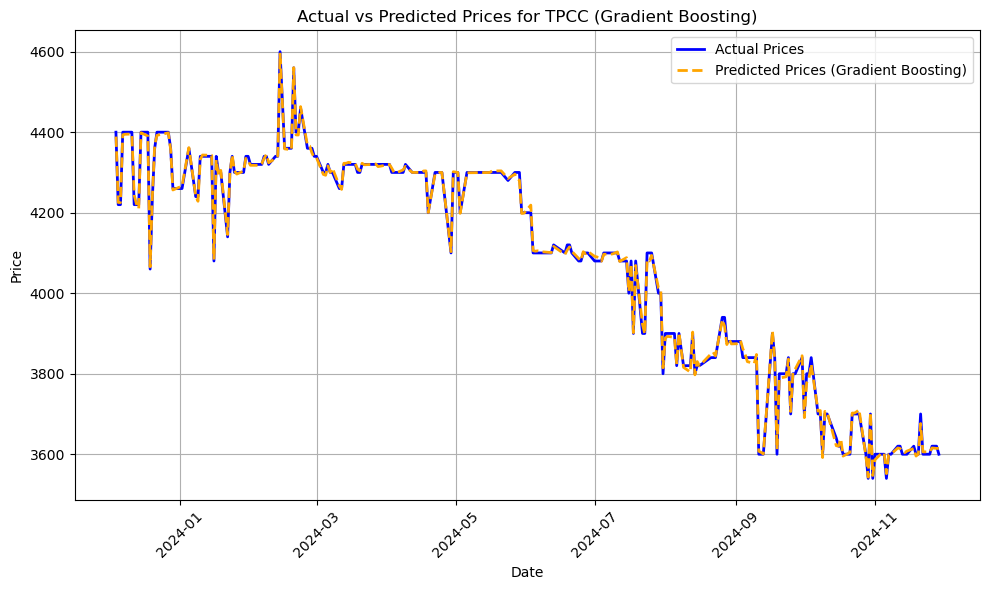

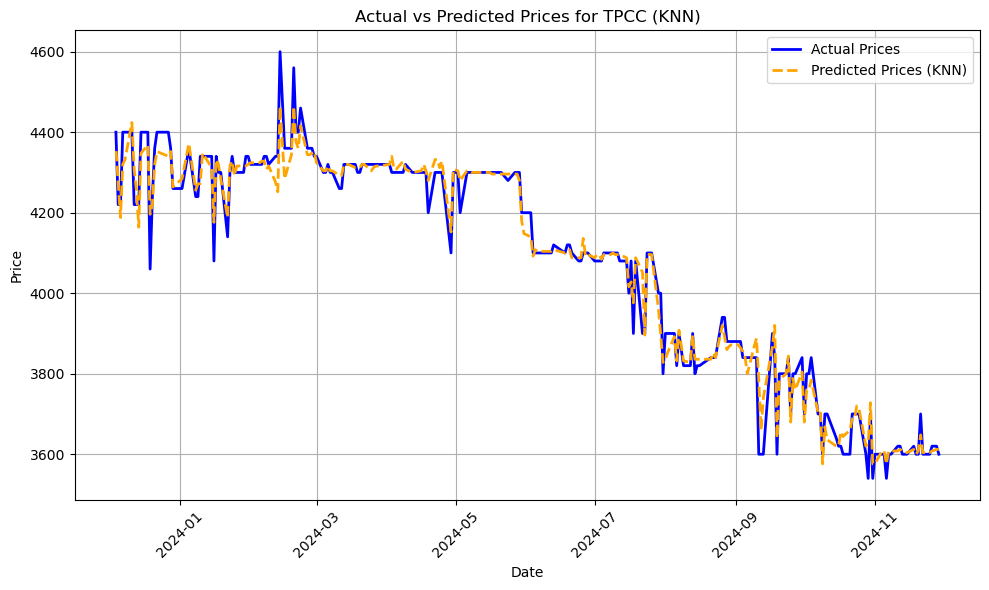

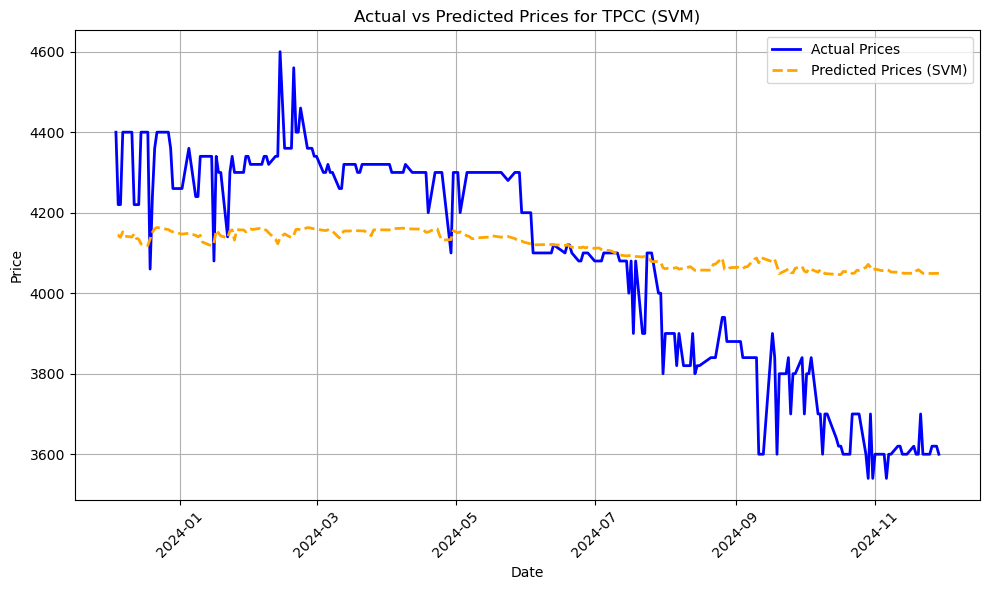

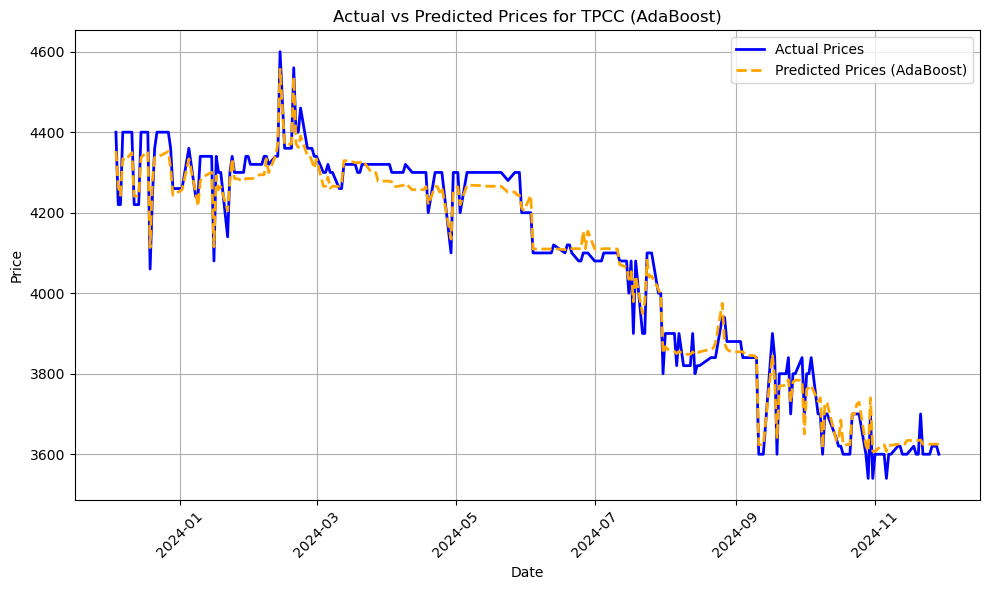

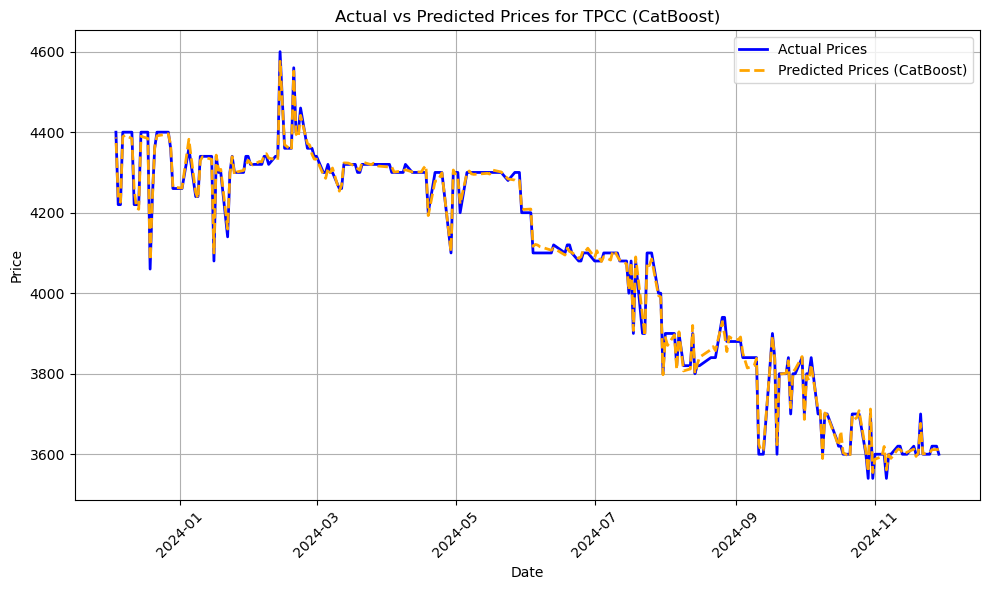


Training models for TCC...
Linear Regression: CV MSE = 9819.6530, CV RMSE = 99.0942, CV R² = 0.5525
Ridge Regression: CV MSE = 7351.6971, CV RMSE = 85.7420, CV R² = 0.5535
Lasso Regression: CV MSE = 7186.0170, CV RMSE = 84.7704, CV R² = 0.5545
Elastic Net: CV MSE = 38466.2795, CV RMSE = 196.1282, CV R² = 0.3589
Decision Tree: CV MSE = 108800.0000, CV RMSE = 329.8485, CV R² = 0.1651
Random Forest: CV MSE = 70882.3584, CV RMSE = 266.2374, CV R² = 0.3457
Gradient Boosting: CV MSE = 91174.0223, CV RMSE = 301.9504, CV R² = 0.0022
KNN: CV MSE = 25856.0000, CV RMSE = 160.7980, CV R² = 0.6487
SVM: CV MSE = 242932.8732, CV RMSE = 492.8822, CV R² = -1.1306
AdaBoost: CV MSE = 53308.0967, CV RMSE = 230.8855, CV R² = 0.6539
CatBoost: CV MSE = 46239.1977, CV RMSE = 215.0330, CV R² = 0.3044
Best model for TCC: Lasso Regression with CV MSE = 7186.0170


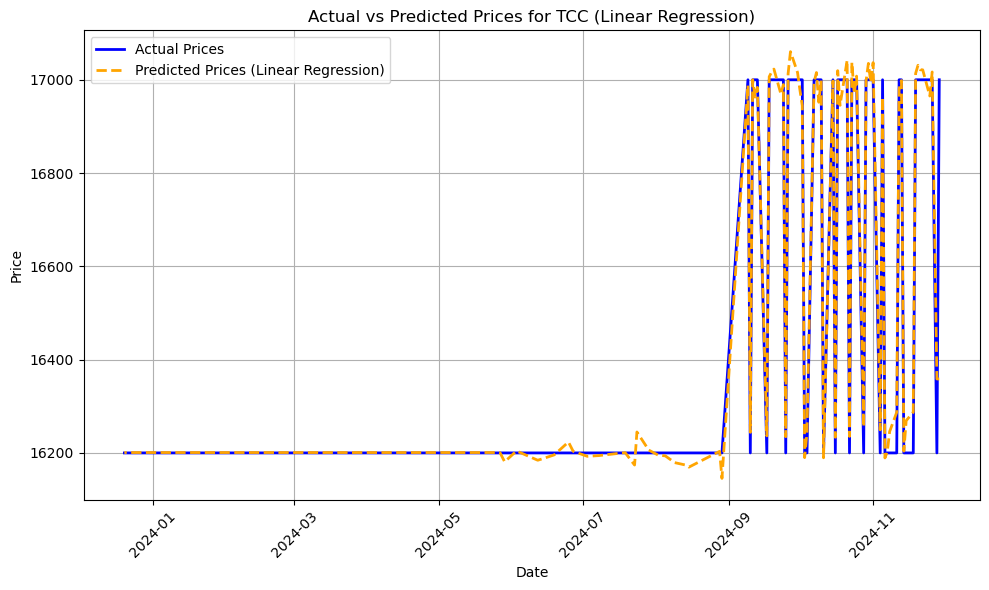

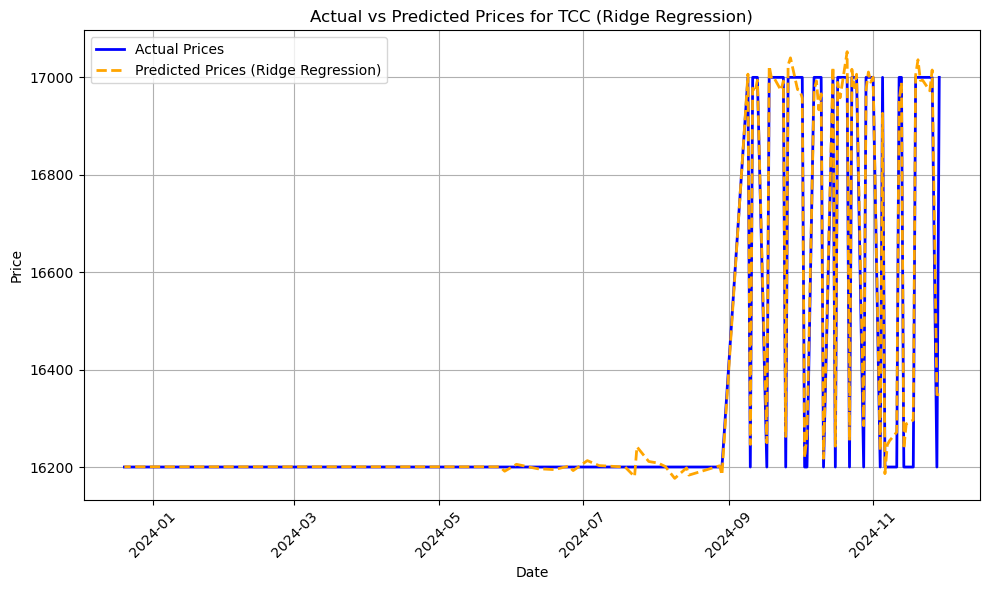

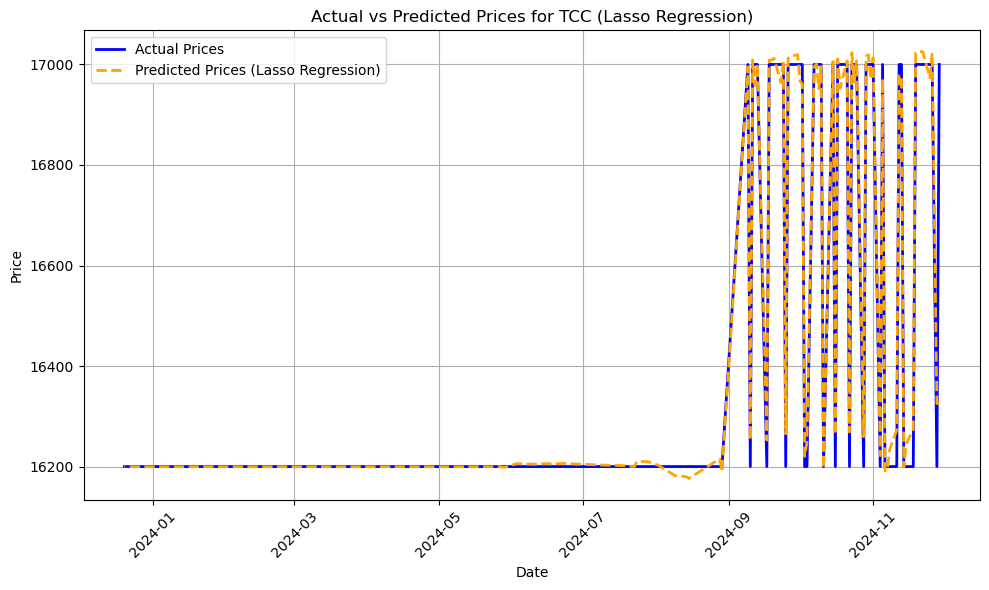

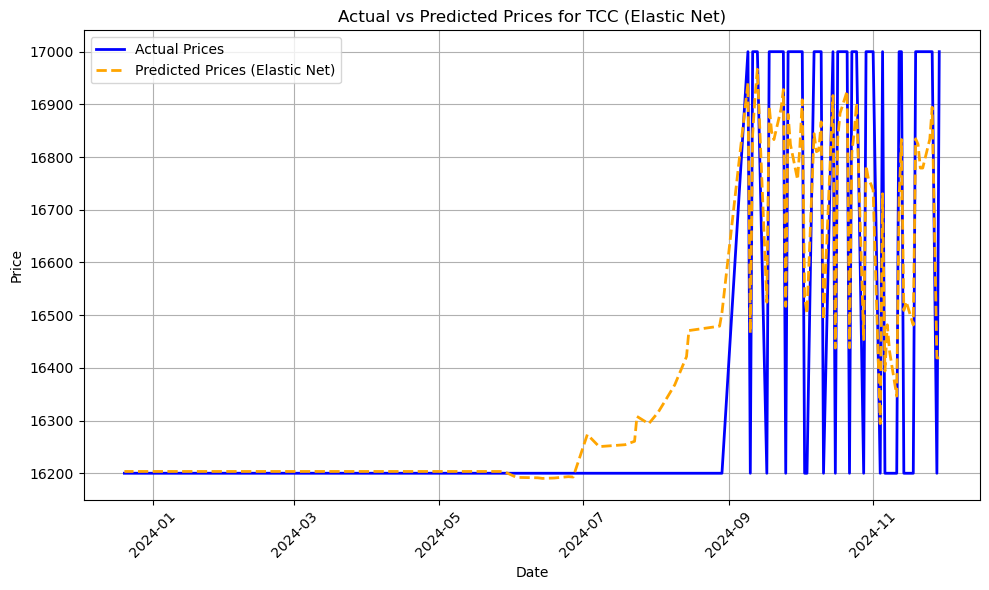

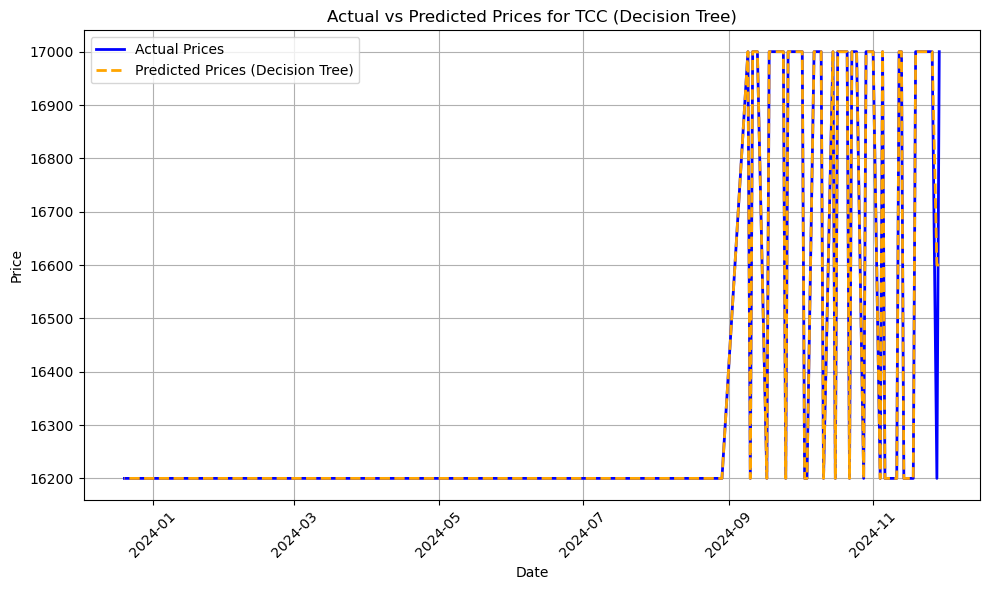

...

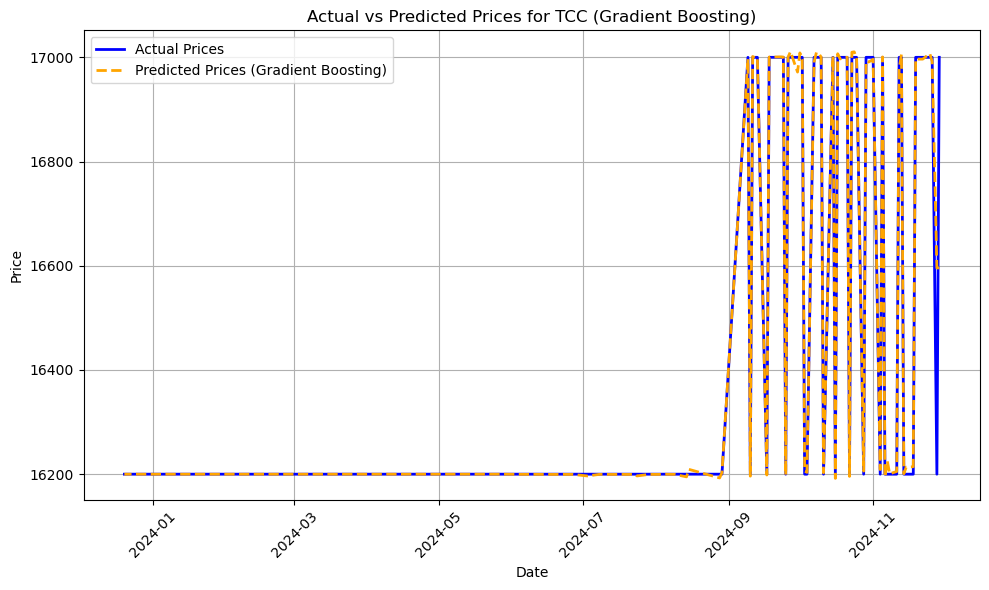

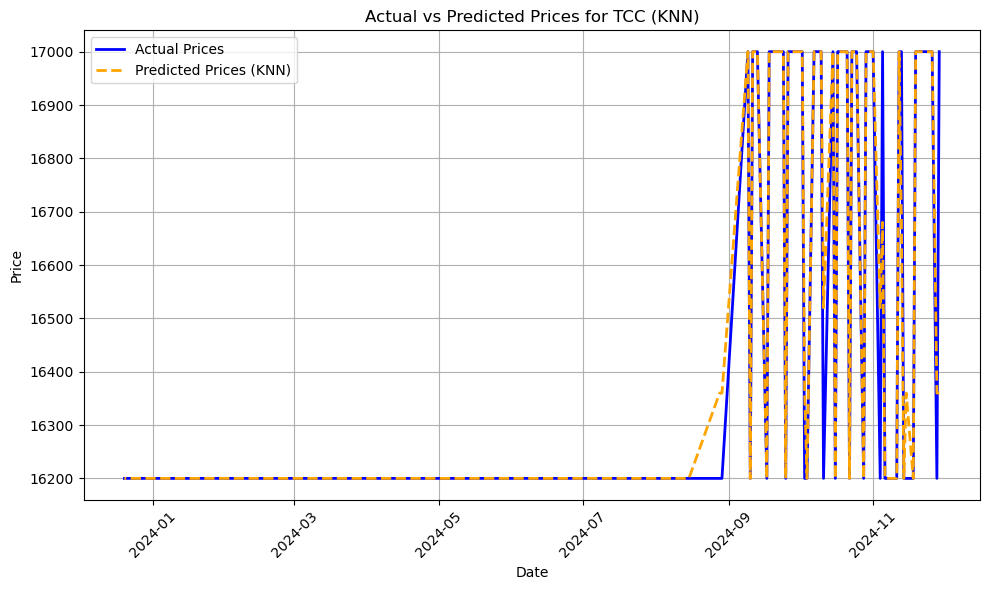

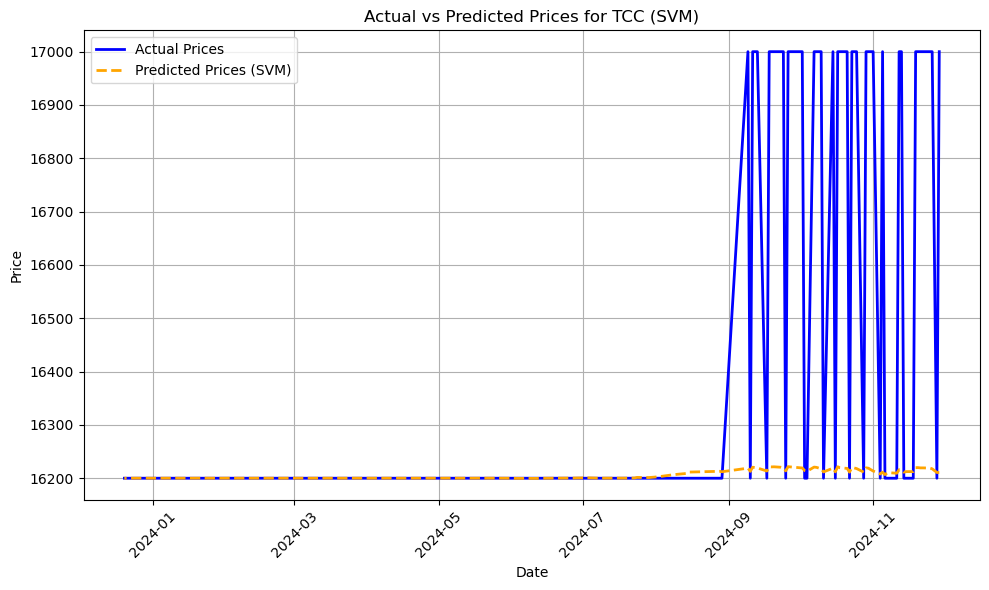

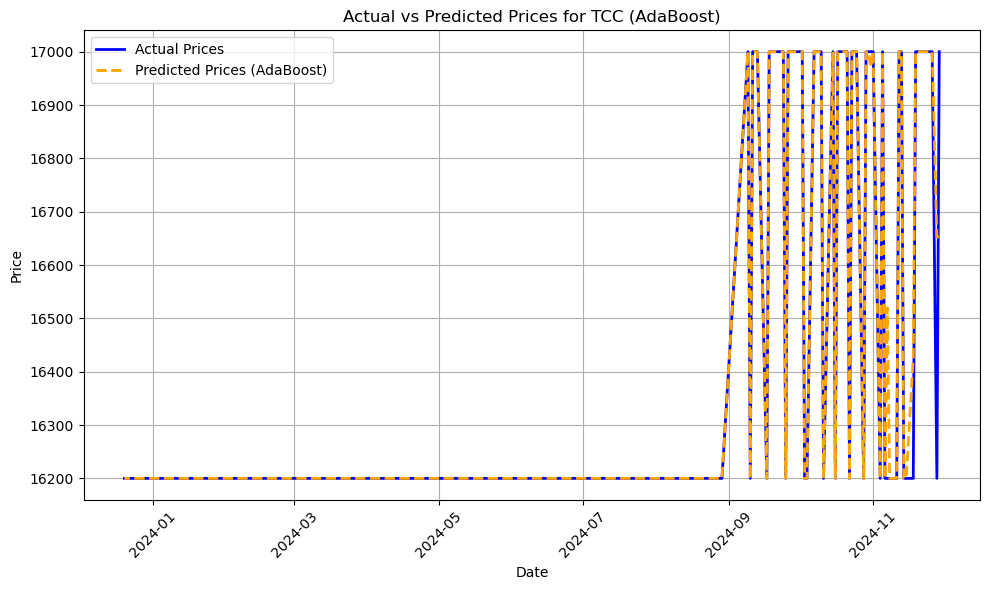

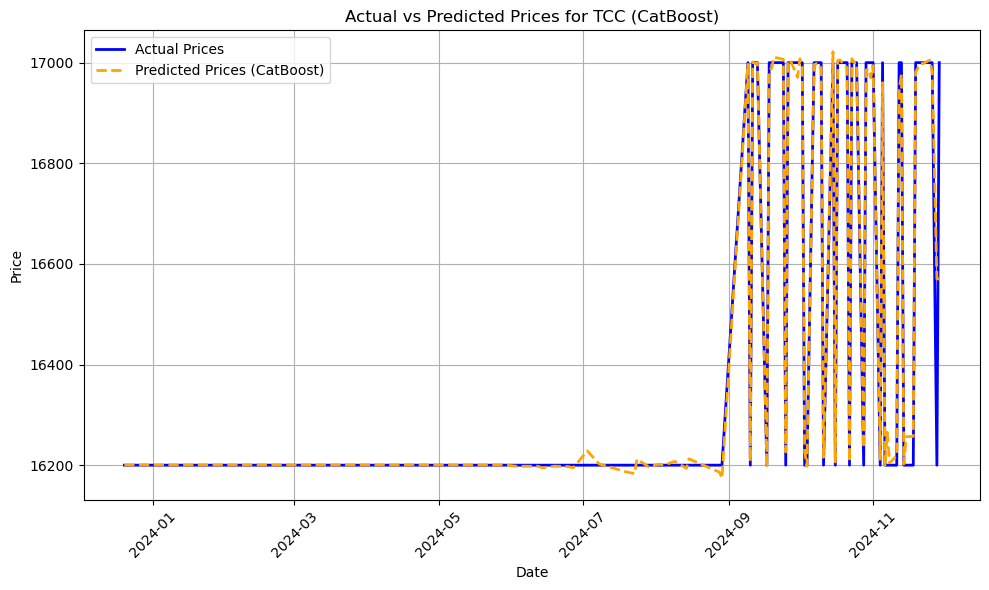


Training models for TTP...
Linear Regression: CV MSE = 0.2674, CV RMSE = 0.5171, CV R² = 0.9833
Ridge Regression: CV MSE = 0.3870, CV RMSE = 0.6221, CV R² = 0.9823
Lasso Regression: CV MSE = 7.6619, CV RMSE = 2.7680, CV R² = 0.6186
Elastic Net: CV MSE = 15.4009, CV RMSE = 3.9244, CV R² = 0.2359
Decision Tree: CV MSE = 26.7292, CV RMSE = 5.1700, CV R² = -0.4709
Random Forest: CV MSE = 24.3191, CV RMSE = 4.9314, CV R² = -0.2345
Gradient Boosting: CV MSE = 19.2457, CV RMSE = 4.3870, CV R² = 0.0696
KNN: CV MSE = 23.8417, CV RMSE = 4.8828, CV R² = -0.1905
SVM: CV MSE = 43.7309, CV RMSE = 6.6129, CV R² = -1.2268
AdaBoost: CV MSE = 24.3321, CV RMSE = 4.9328, CV R² = -0.1241
CatBoost: CV MSE = 24.2681, CV RMSE = 4.9263, CV R² = -0.2295
Best model for TTP: Linear Regression with CV MSE = 0.2674


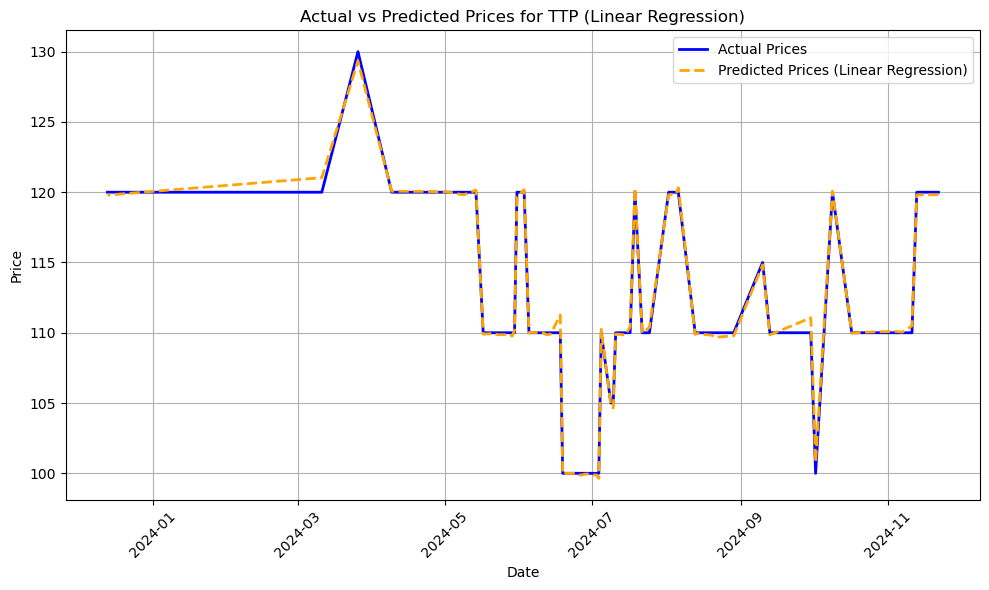

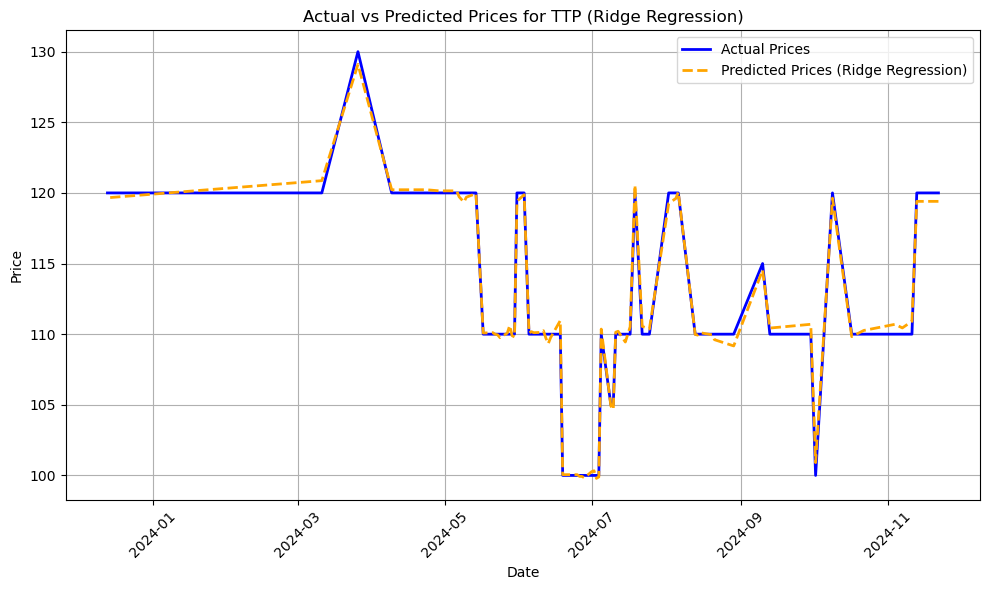

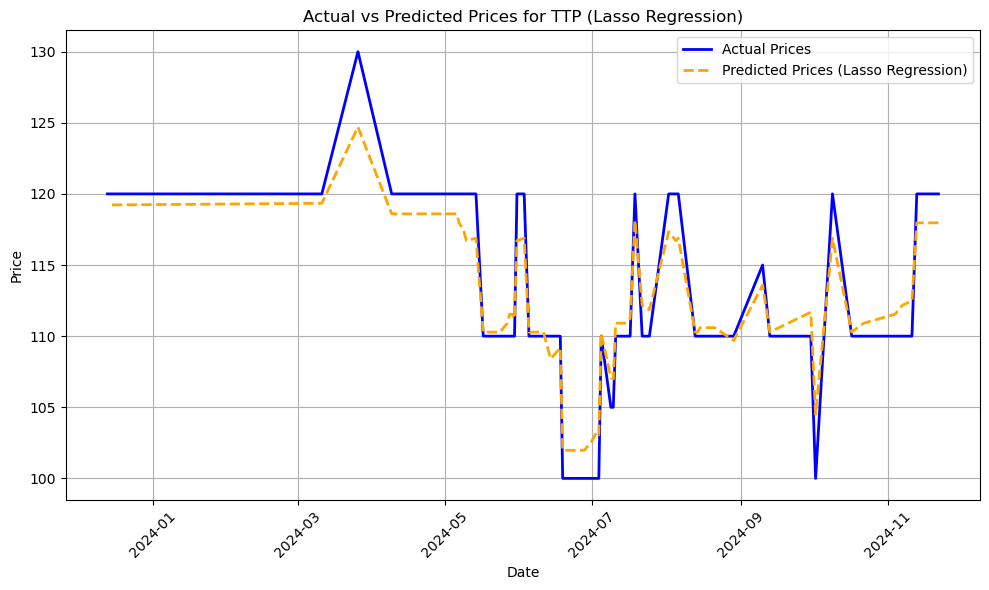

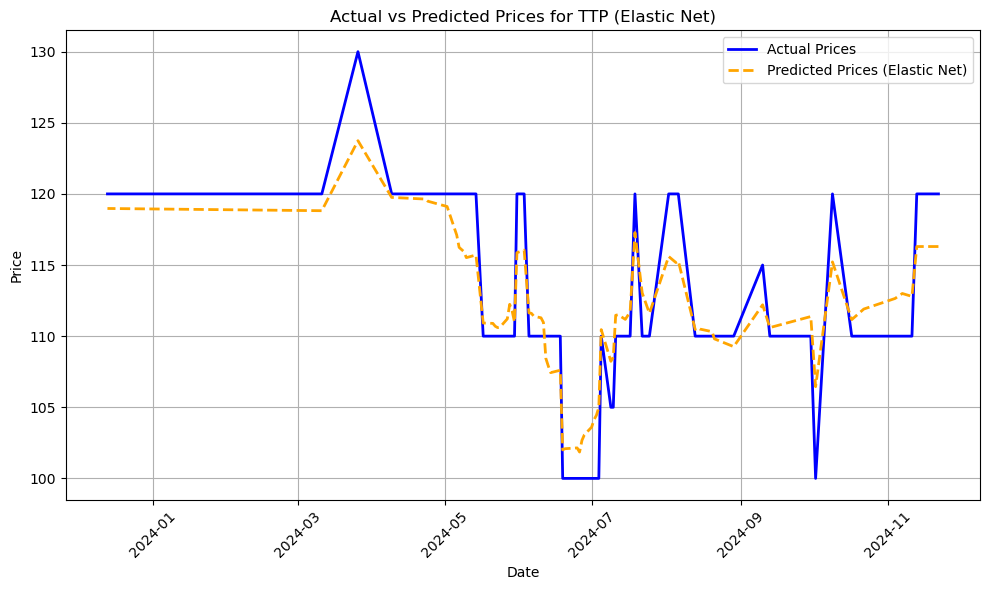

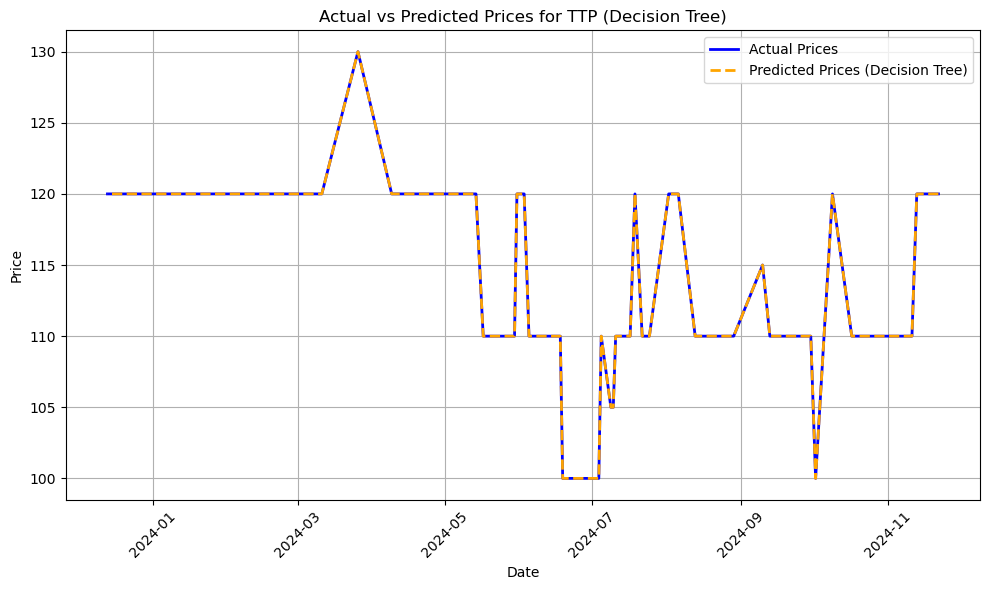

...

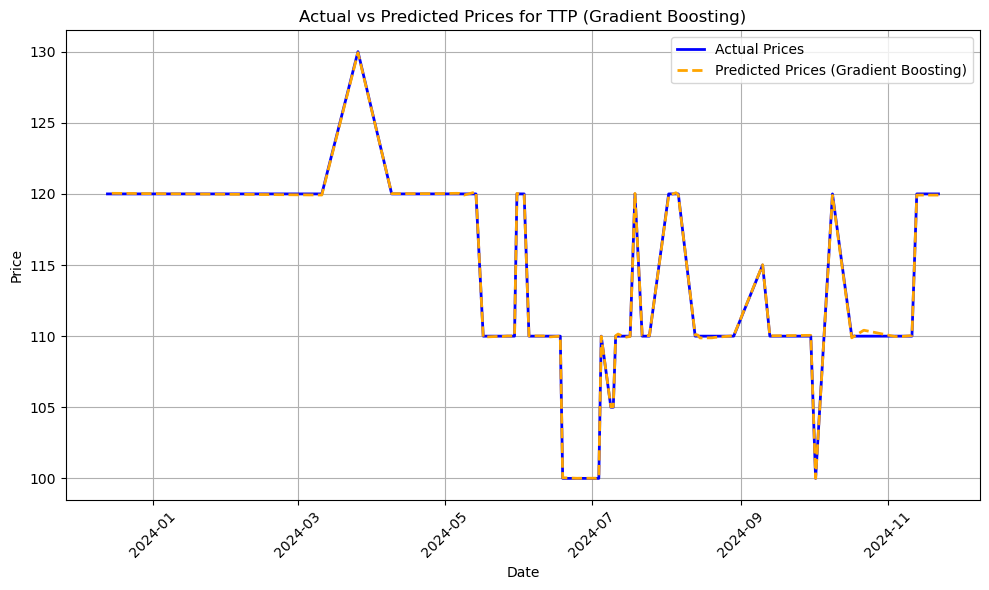

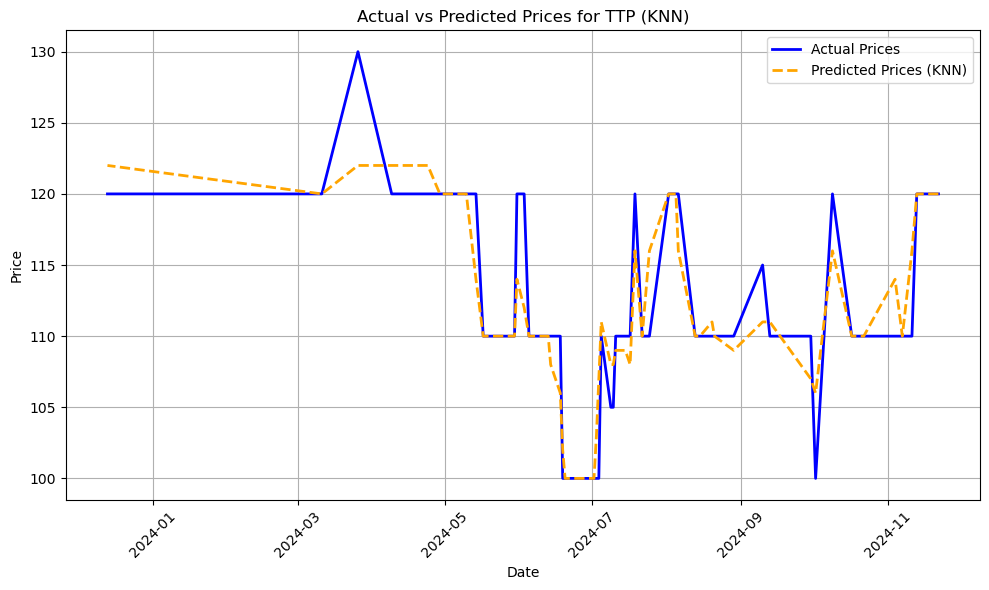

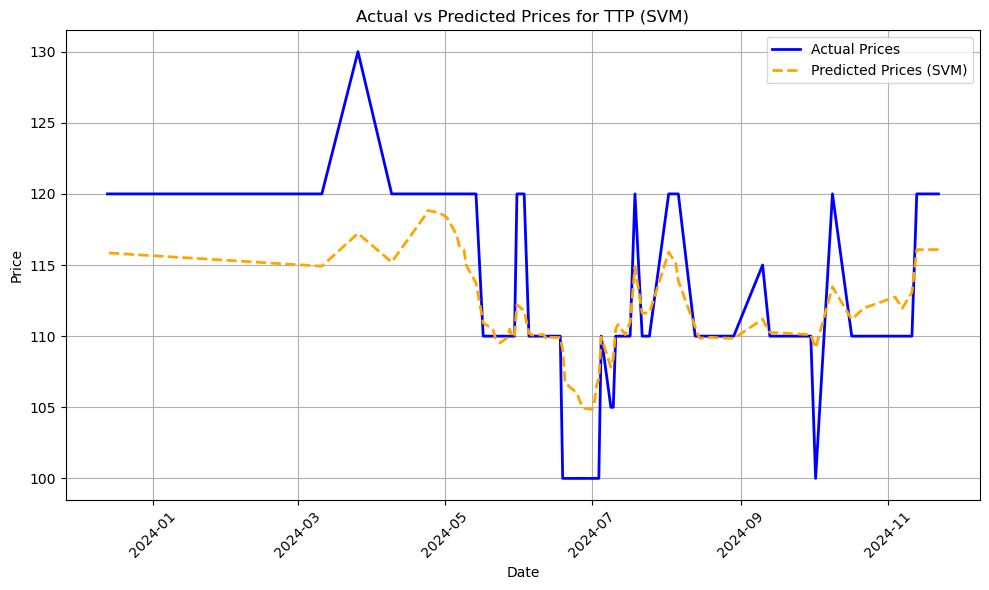

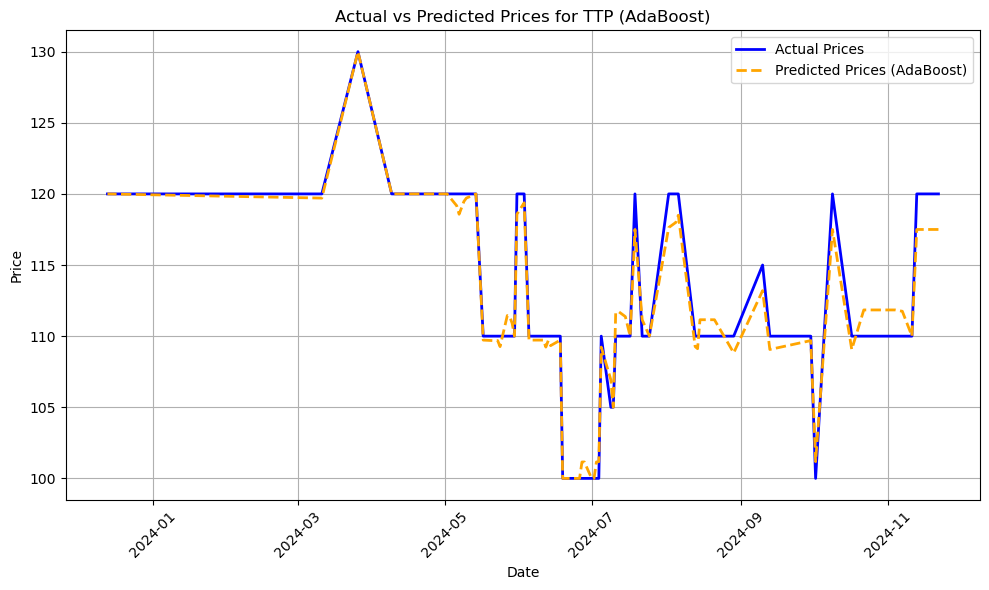

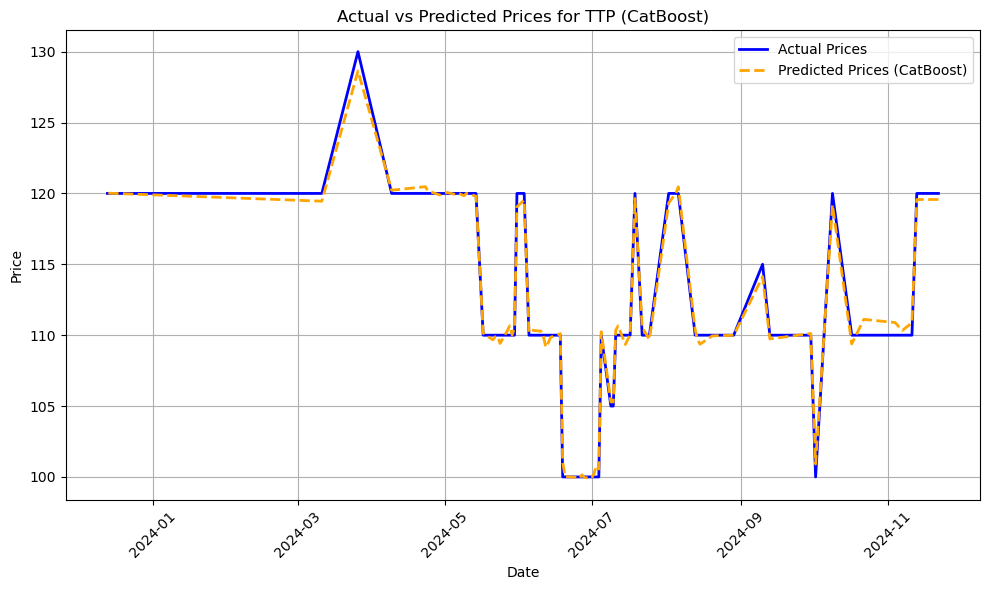


Training models for TBL...
Linear Regression: CV MSE = 21.5421, CV RMSE = 4.6414, CV R² = 0.5996
Ridge Regression: CV MSE = 269.7922, CV RMSE = 16.4254, CV R² = 0.5947
Lasso Regression: CV MSE = 35.4825, CV RMSE = 5.9567, CV R² = 0.5993
Elastic Net: CV MSE = 11998.8678, CV RMSE = 109.5393, CV R² = 0.3604
Decision Tree: CV MSE = 22000.0000, CV RMSE = 148.3240, CV R² = 0.5691
Random Forest: CV MSE = 12658.0000, CV RMSE = 112.5078, CV R² = 0.7620
Gradient Boosting: CV MSE = 16324.9465, CV RMSE = 127.7691, CV R² = 0.2968
KNN: CV MSE = 18400.0000, CV RMSE = 135.6466, CV R² = 0.6358
SVM: CV MSE = 58750.7165, CV RMSE = 242.3855, CV R² = -0.5435
AdaBoost: CV MSE = 15125.0000, CV RMSE = 122.9837, CV R² = 0.7145
CatBoost: CV MSE = 10233.3878, CV RMSE = 101.1602, CV R² = 0.4041
Best model for TBL: Linear Regression with CV MSE = 21.5421


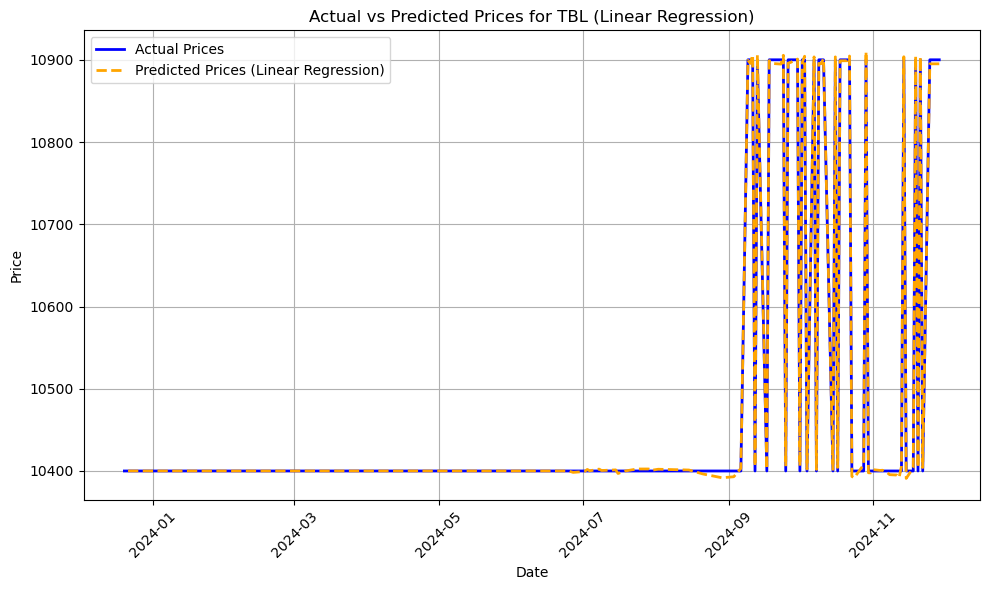

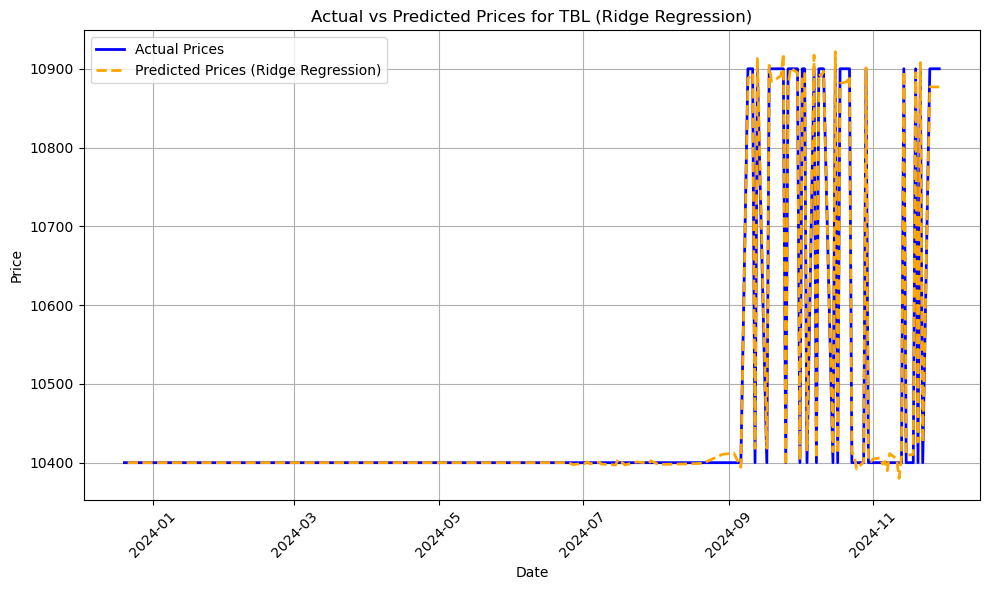

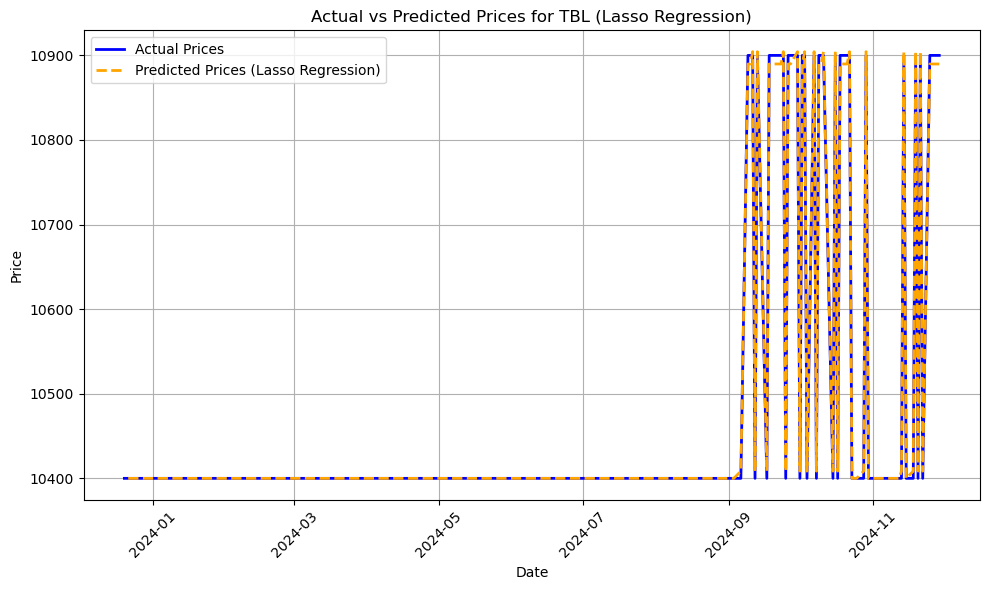

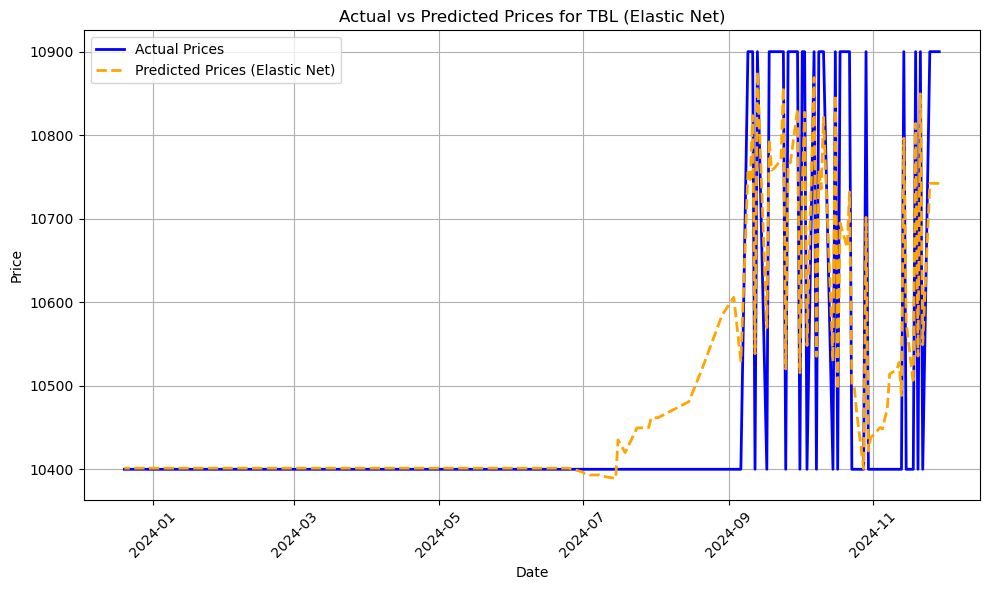

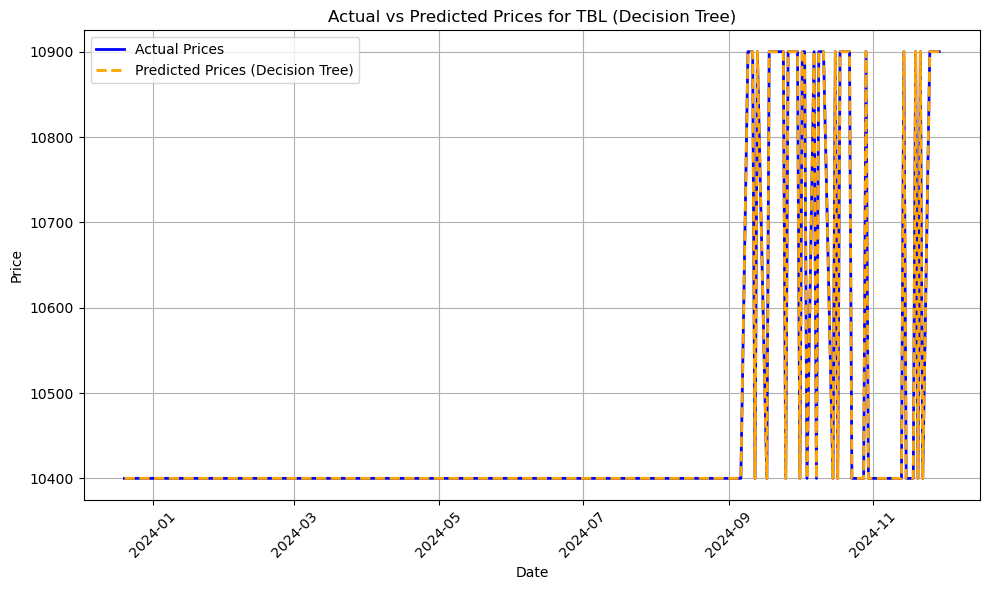

...

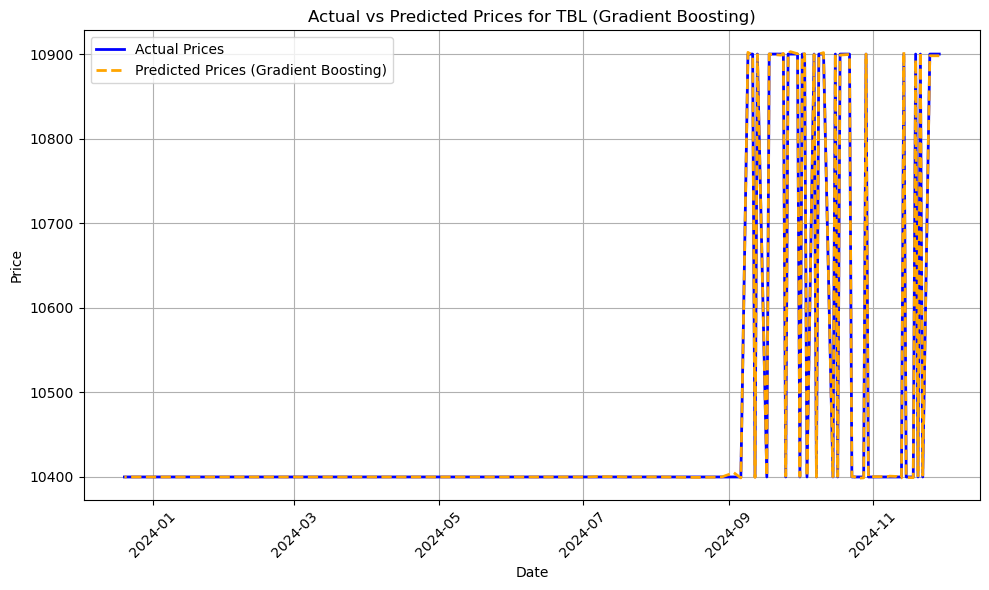

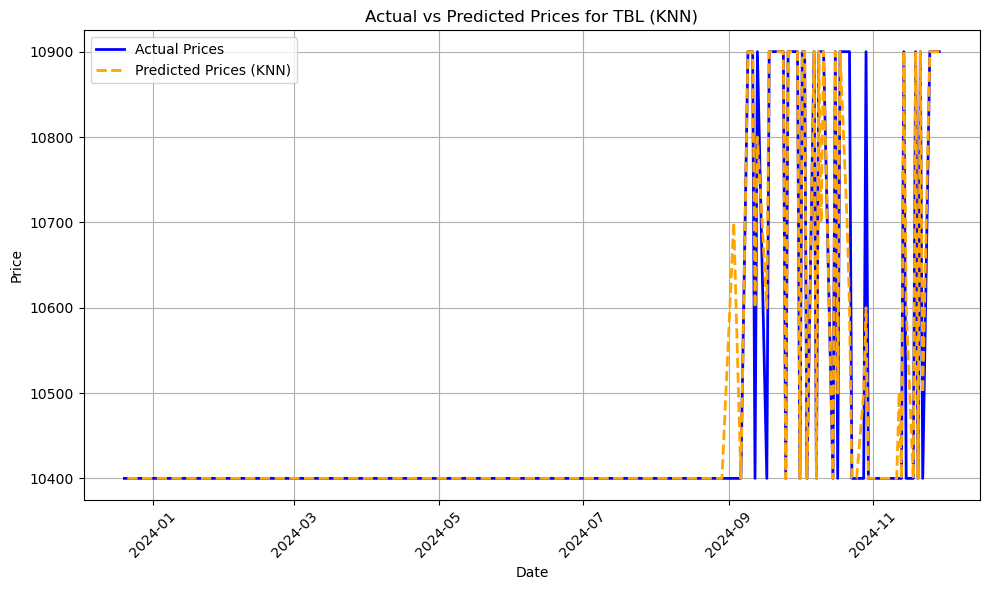

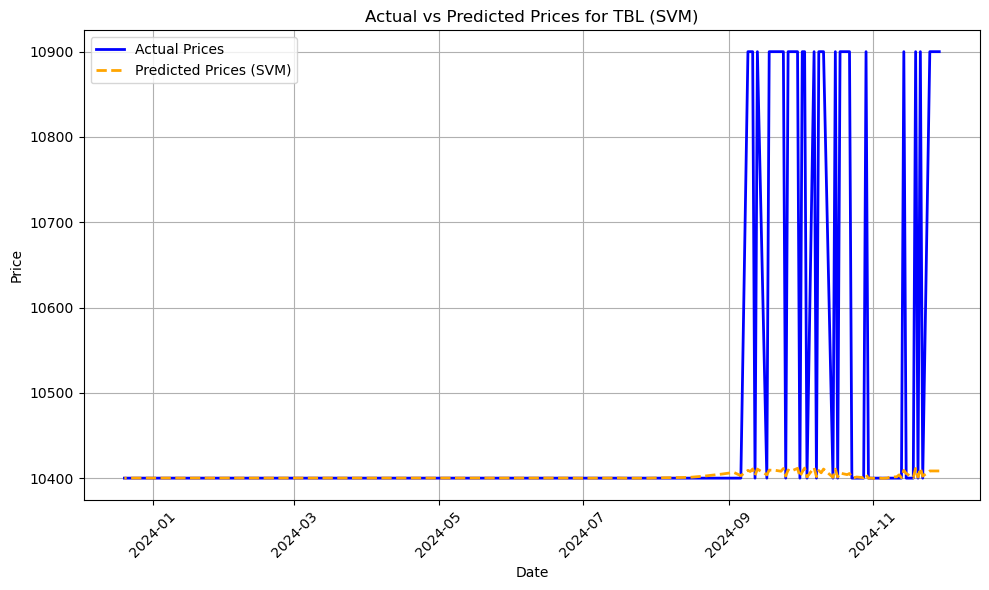

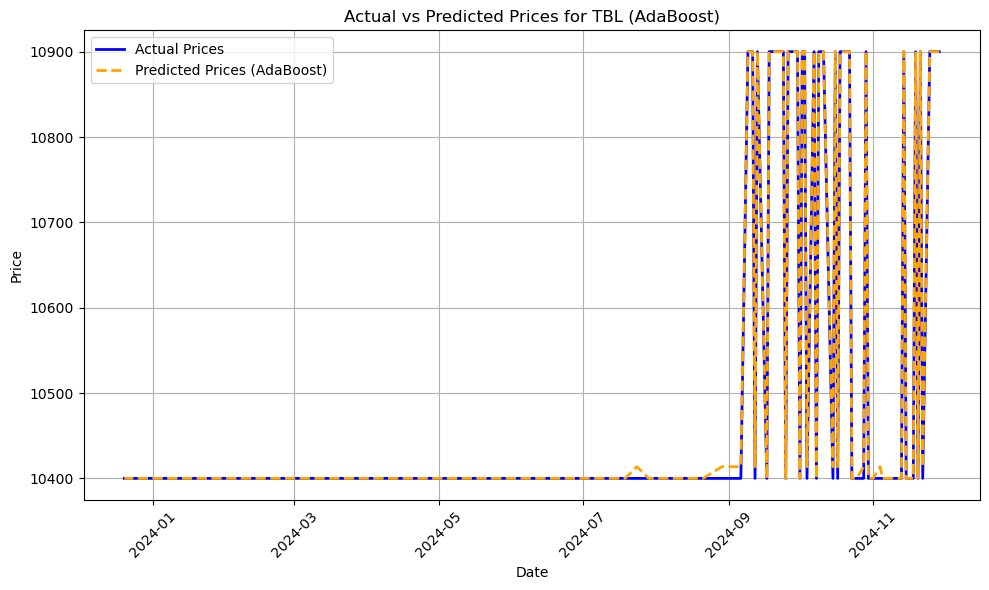

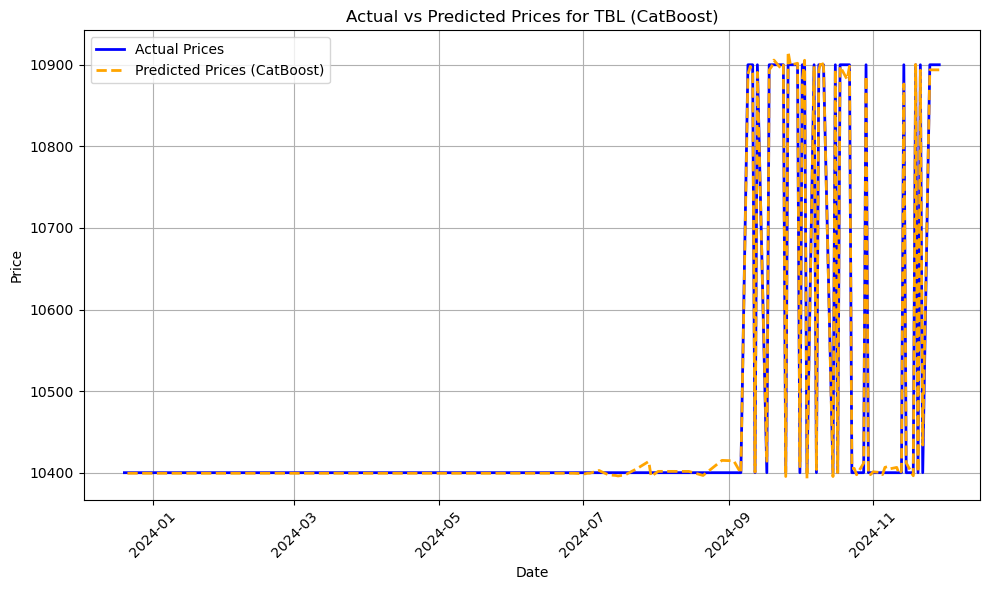


Training models for TOL...
Linear Regression: CV MSE = 1.9668, CV RMSE = 1.4024, CV R² = 0.9587
Ridge Regression: CV MSE = 9.8404, CV RMSE = 3.1369, CV R² = 0.8294
Lasso Regression: CV MSE = 32.1382, CV RMSE = 5.6691, CV R² = 0.8301
Elastic Net: CV MSE = 168.8322, CV RMSE = 12.9935, CV R² = -0.5803
Decision Tree: CV MSE = 169.3333, CV RMSE = 13.0128, CV R² = -0.7902
Random Forest: CV MSE = 154.3652, CV RMSE = 12.4244, CV R² = -0.5133
Gradient Boosting: CV MSE = 123.0614, CV RMSE = 11.0933, CV R² = 0.3542
KNN: CV MSE = 281.1200, CV RMSE = 16.7666, CV R² = -0.4610
SVM: CV MSE = 528.0675, CV RMSE = 22.9797, CV R² = -8.1365
AdaBoost: CV MSE = 188.9372, CV RMSE = 13.7454, CV R² = -0.0032
CatBoost: CV MSE = 218.1969, CV RMSE = 14.7715, CV R² = -0.4013
Best model for TOL: Linear Regression with CV MSE = 1.9668


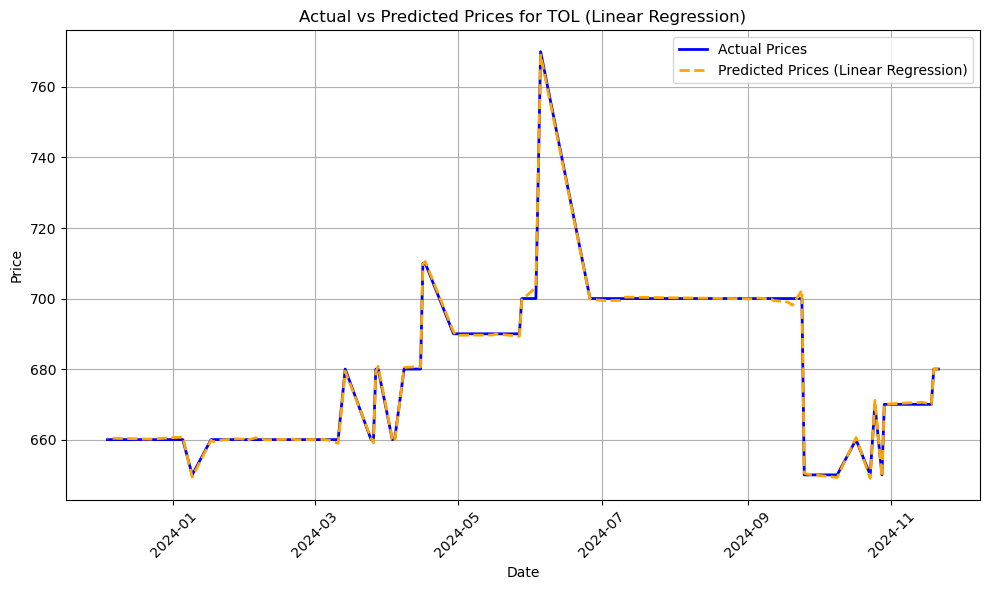

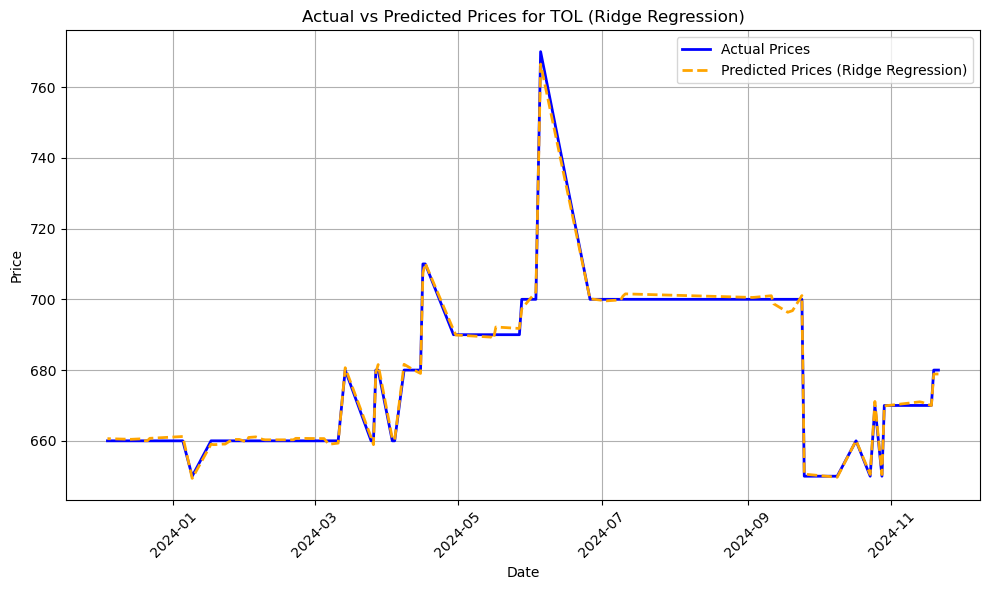

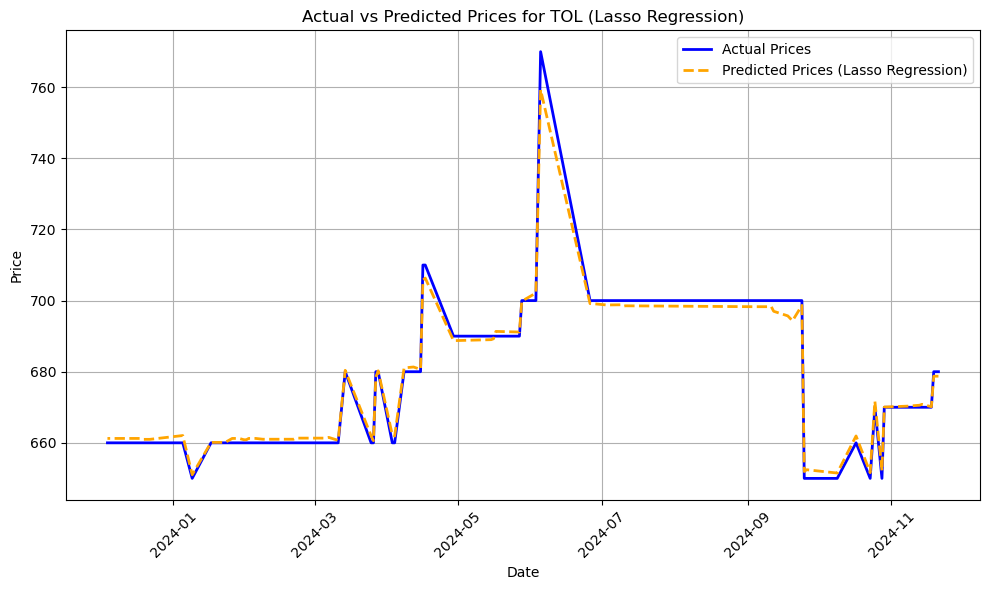

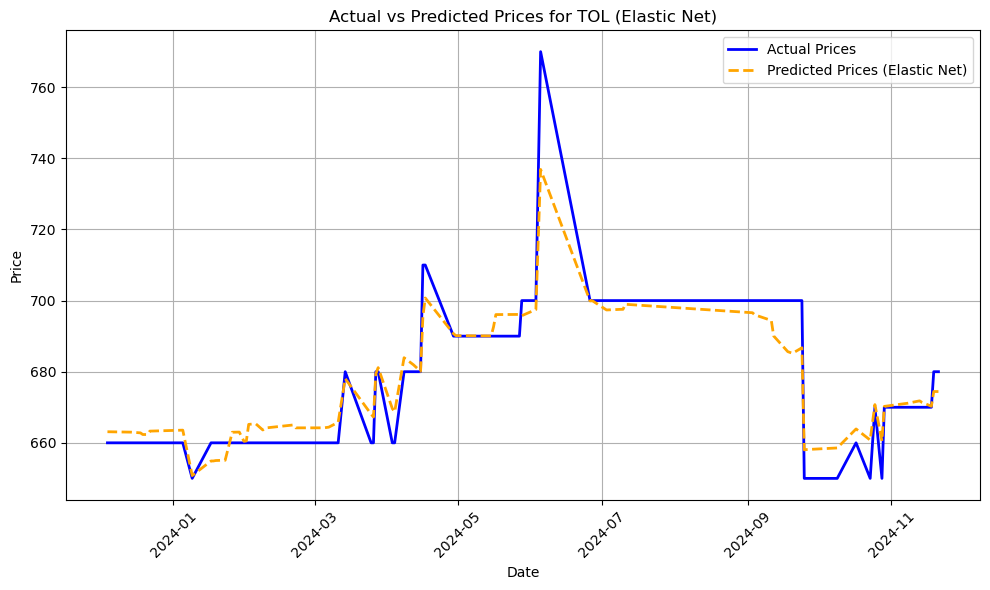

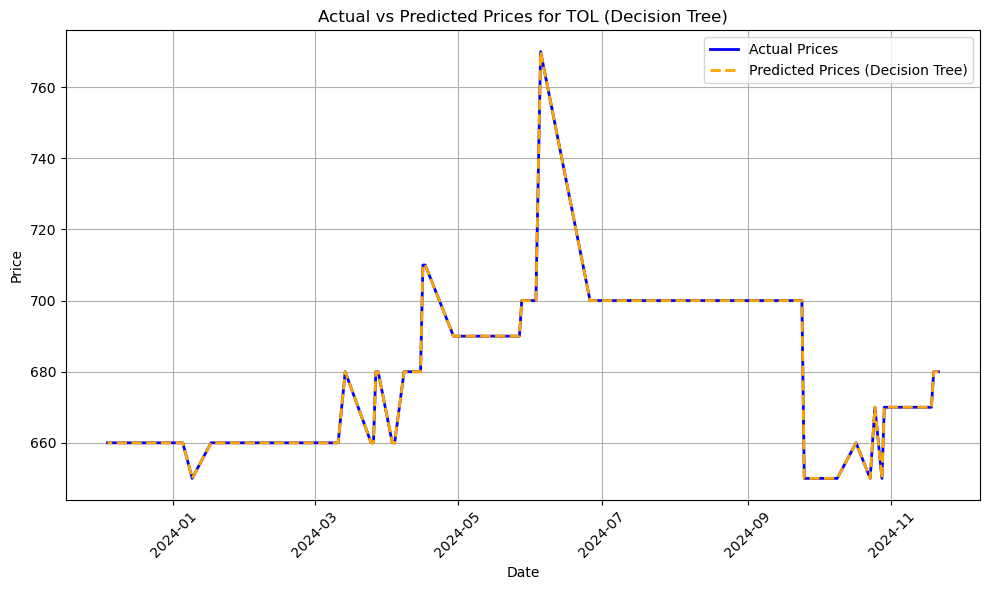

...

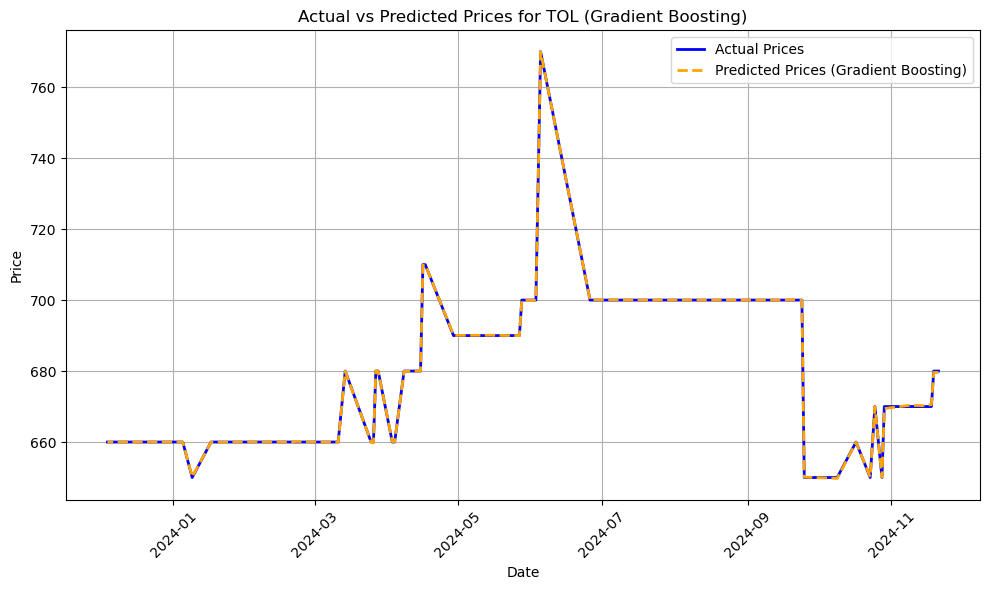

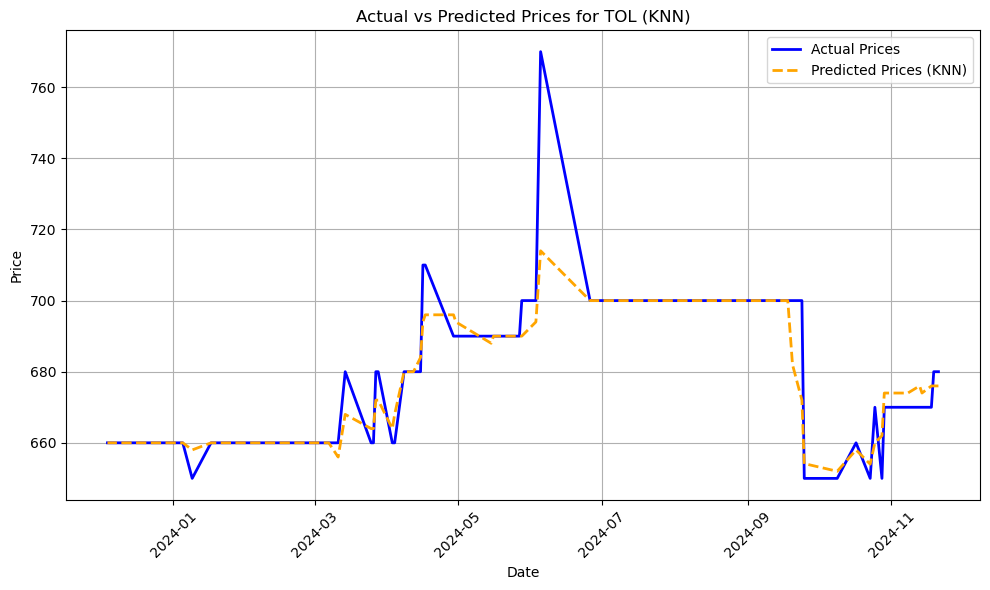

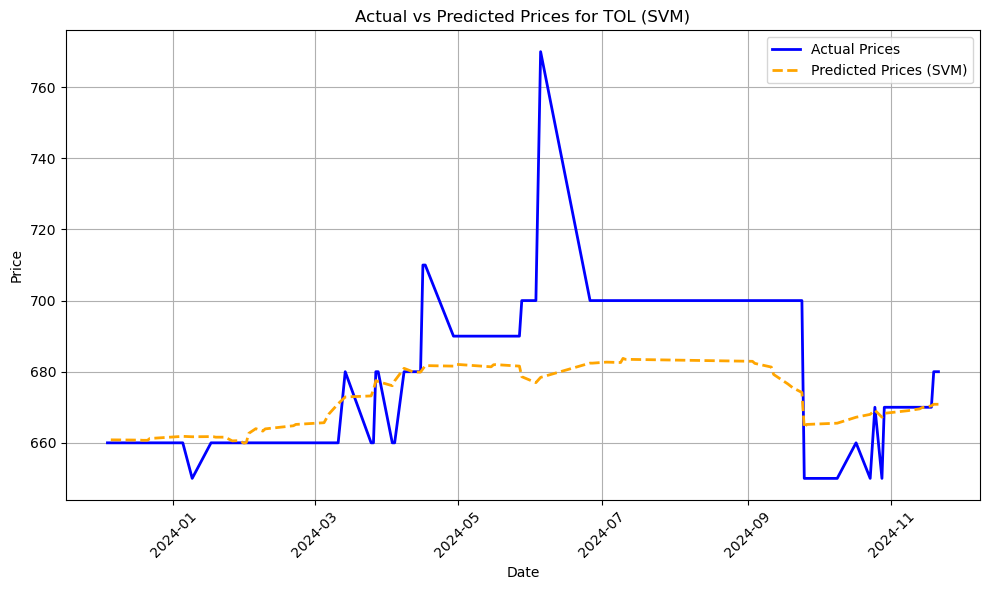

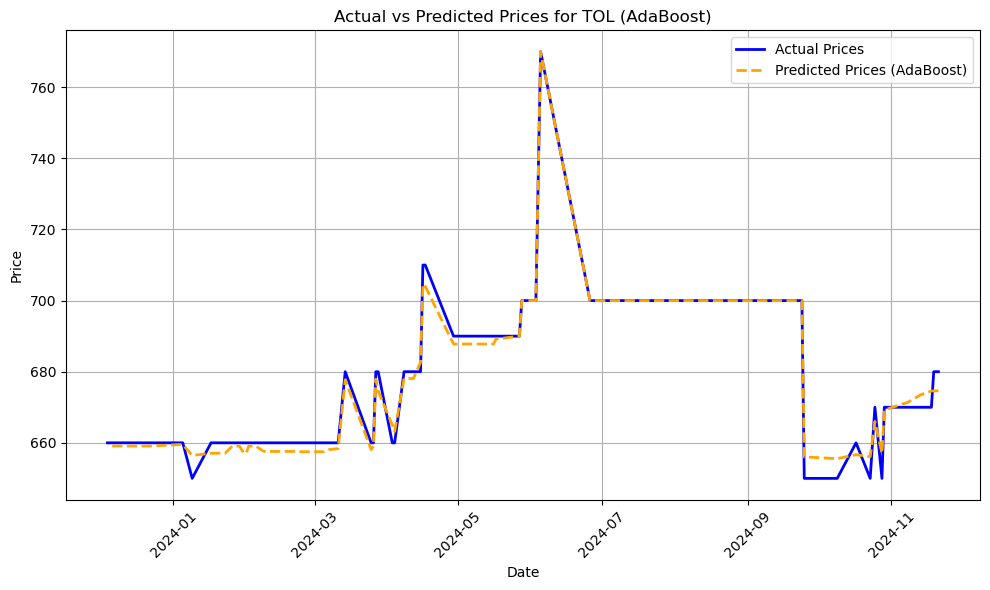

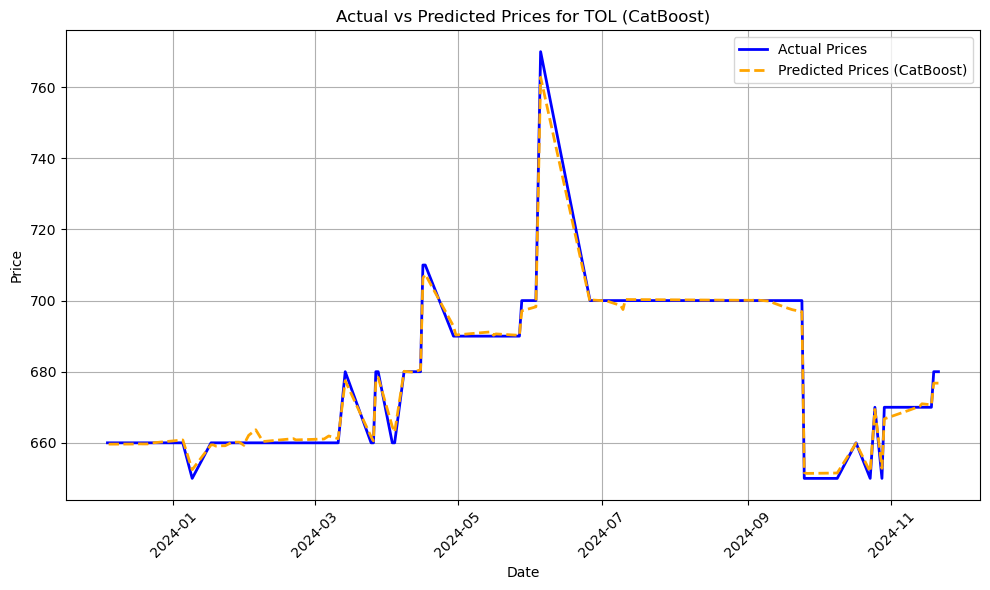


Model training and plotting completed for all stocks.


In [19]:

# Initialize dictionaries to store results and predictions
model_results = {}
predictions = {}

# Iterate over each stock's data
for stock in all_stock_data:
    print(f"\nTraining models for {stock}...")

    # Prepare data for model training
    df = all_stock_data[stock]

    # Drop rows with missing values
    df = df.dropna()

    # Check if sufficient data exists
    if len(df) < 10:  # Arbitrary threshold to ensure sufficient data
        print(f"Not enough data for {stock}. Skipping...")
        continue

    # Prepare features and target
    X = df.drop(columns=['Price', 'Date'])  # Features
    y = df['Price']  # Target variable

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Initialize models
    models = {
        'Linear Regression': LinearRegression(),
        'Ridge Regression': Ridge(random_state=42),
        'Lasso Regression': Lasso(random_state=42),
        'Elastic Net': ElasticNet(random_state=42),
        'Decision Tree': DecisionTreeRegressor(random_state=42),
        'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100),
        'Gradient Boosting': GradientBoostingRegressor(random_state=42, n_estimators=100),
        'KNN': KNeighborsRegressor(),
        'SVM': SVR(),
        'AdaBoost': AdaBoostRegressor(random_state=42),
        'CatBoost': CatBoostRegressor(iterations=100, learning_rate=0.1, depth=6, silent=True),
    }

    # Train and evaluate each model
    stock_results = {}
    stock_predictions = {}  # To store predictions for each model
    best_model_name = None
    best_model_mse = np.inf  # Start with a very high MSE (since lower is better)

    for model_name, model in models.items():
        try:
            # Cross-validation for MSE (scoring='neg_mean_squared_error')
            cv_mse_scores = -cross_val_score(model, X_scaled, y, cv=5, scoring='neg_mean_squared_error')

            # Calculate the average CV MSE for this model
            avg_cv_mse = cv_mse_scores.mean()
            # Cross-validation for R² (scoring='r2')
            cv_r2_scores = cross_val_score(model, X_scaled, y, cv=5, scoring='r2')
            avg_cv_r2 = cv_r2_scores.mean()

            # Fit the model on the entire dataset
            model.fit(X_scaled, y)

            # Generate predictions
            avg_cv_rmse = np.sqrt(avg_cv_mse)

            y_pred = model.predict(X_scaled)
            stock_predictions[model_name] = y_pred

            # Store results
            stock_results[model_name] = {
                'MSE (CV)': avg_cv_mse,
                'RMSE (CV)': avg_cv_rmse,
                'R² (CV)': avg_cv_r2,
            }

            print(f"{model_name}: CV MSE = {avg_cv_mse:.4f}, CV RMSE = {avg_cv_rmse:.4f}, CV R² = {avg_cv_r2:.4f}")

            # Update best model based on lowest CV MSE
            if avg_cv_mse < best_model_mse:
                best_model_mse = avg_cv_mse
                best_model_name = model_name

        except Exception as e:
            print(f"Error training {model_name} for {stock}: {e}")

    # Save results and predictions for this stock
    if stock_results:
        model_results[stock] = stock_results
        predictions[stock] = stock_predictions
        print(f"Best model for {stock}: {best_model_name} with CV MSE = {best_model_mse:.4f}")
    else:
        print(f"No valid models for {stock}. Skipping...")

    # Plot actual vs. predicted prices for all models
    for model_name, y_pred in stock_predictions.items():
        plt.figure(figsize=(10, 6))
        plt.plot(df['Date'], y, label='Actual Prices', color='blue', linewidth=2)
        plt.plot(df['Date'], y_pred, label=f'Predicted Prices ({model_name})', color='orange', linestyle='--', linewidth=2)
        plt.title(f'Actual vs Predicted Prices for {stock} ({model_name})')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate date labels for better readability
        plt.tight_layout()
        plt.show()

# Display overall results
print("\nModel training and plotting completed for all stocks.")


# PREDICTING ON UNSEEN  TEST DATA BASED ON THE BEST TRAINING MODEL


Training models for AFRIPRISE...
Linear Regression: CV MSE = 0.4387, CV RMSE = 0.6623, CV R² = 0.9875
Ridge Regression: CV MSE = 0.9081, CV RMSE = 0.9530, CV R² = 0.9756
Lasso Regression: CV MSE = 4.8107, CV RMSE = 2.1933, CV R² = 0.8956
Elastic Net: CV MSE = 22.2972, CV RMSE = 4.7220, CV R² = 0.5461
Decision Tree: CV MSE = 176.6348, CV RMSE = 13.2904, CV R² = -2.4112
Random Forest: CV MSE = 22.5016, CV RMSE = 4.7436, CV R² = 0.5297
Gradient Boosting: CV MSE = 20.1937, CV RMSE = 4.4937, CV R² = 0.5938
KNN: CV MSE = 32.6002, CV RMSE = 5.7097, CV R² = 0.4366
SVM: CV MSE = 95.4405, CV RMSE = 9.7694, CV R² = -0.9769
AdaBoost: CV MSE = 31.4943, CV RMSE = 5.6120, CV R² = 0.4096
CatBoost: CV MSE = 26.4457, CV RMSE = 5.1425, CV R² = 0.5070
Best model for AFRIPRISE: Linear Regression with CV MSE = 0.4387

Predicting for unseen stock data for AFRIPRISE...
Unseen data for AFRIPRISE: MSE = 0.0297, RMSE = 0.1722, R² = 0.9988


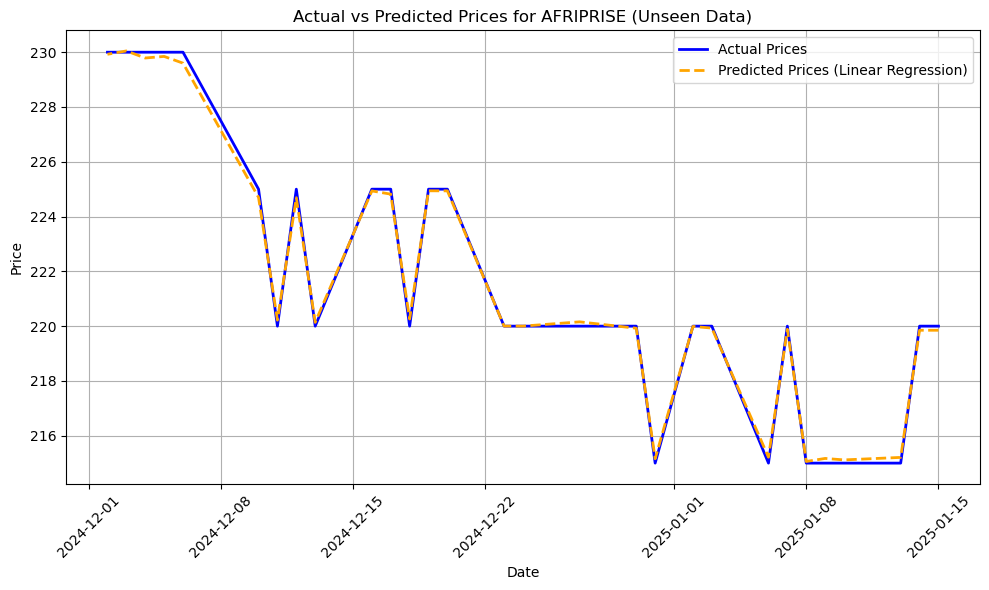


Training models for CRDB...
Linear Regression: CV MSE = 2.0098, CV RMSE = 1.4177, CV R² = 0.9931
Ridge Regression: CV MSE = 15.5618, CV RMSE = 3.9448, CV R² = 0.9479
Lasso Regression: CV MSE = 5.7490, CV RMSE = 2.3977, CV R² = 0.9806
Elastic Net: CV MSE = 159.6622, CV RMSE = 12.6357, CV R² = 0.4180
Decision Tree: CV MSE = 722.2449, CV RMSE = 26.8746, CV R² = -1.7204
Random Forest: CV MSE = 507.9030, CV RMSE = 22.5367, CV R² = -1.4733
Gradient Boosting: CV MSE = 391.4957, CV RMSE = 19.7863, CV R² = -0.9795
KNN: CV MSE = 738.6000, CV RMSE = 27.1772, CV R² = -2.0946
SVM: CV MSE = 5034.5511, CV RMSE = 70.9546, CV R² = -19.1150
AdaBoost: CV MSE = 664.4437, CV RMSE = 25.7768, CV R² = -1.9752
CatBoost: CV MSE = 716.7378, CV RMSE = 26.7720, CV R² = -2.9436
Best model for CRDB: Linear Regression with CV MSE = 2.0098

Predicting for unseen stock data for CRDB...
Unseen data for CRDB: MSE = 1.3275, RMSE = 1.1522, R² = 0.9779


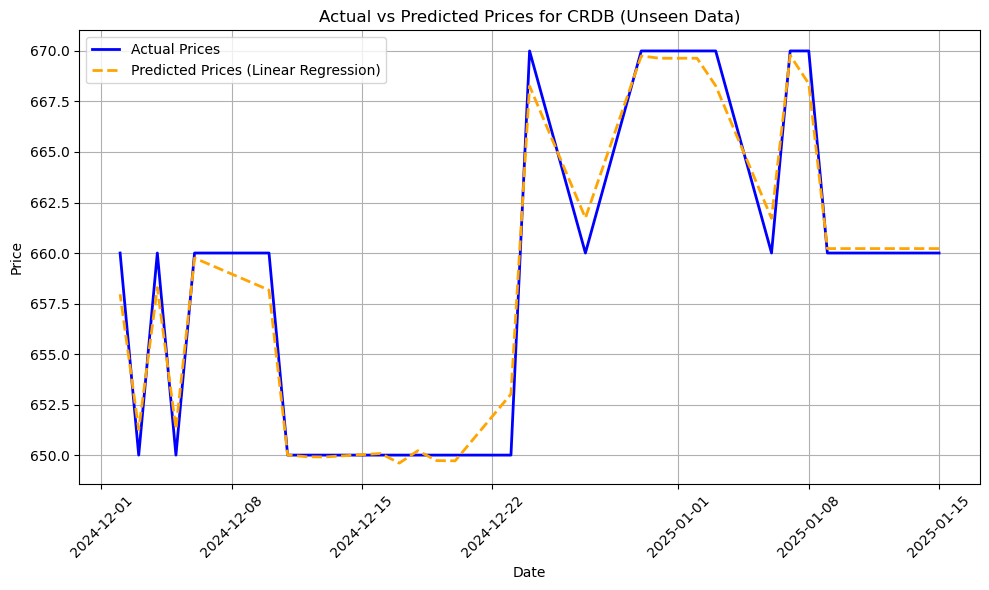


Training models for DCB...
Linear Regression: CV MSE = 0.5201, CV RMSE = 0.7212, CV R² = 0.9875
Ridge Regression: CV MSE = 0.7892, CV RMSE = 0.8883, CV R² = 0.9813
Lasso Regression: CV MSE = 5.7097, CV RMSE = 2.3895, CV R² = 0.8406
Elastic Net: CV MSE = 23.4893, CV RMSE = 4.8466, CV R² = 0.6298
Decision Tree: CV MSE = 58.6303, CV RMSE = 7.6570, CV R² = -0.3119
Random Forest: CV MSE = 36.8858, CV RMSE = 6.0734, CV R² = 0.2874
Gradient Boosting: CV MSE = 36.2640, CV RMSE = 6.0220, CV R² = 0.4470
KNN: CV MSE = 43.4465, CV RMSE = 6.5914, CV R² = 0.0760
SVM: CV MSE = 208.6869, CV RMSE = 14.4460, CV R² = -5.2101
AdaBoost: CV MSE = 54.4327, CV RMSE = 7.3779, CV R² = 0.1679
CatBoost: CV MSE = 38.5050, CV RMSE = 6.2052, CV R² = 0.2091
Best model for DCB: Linear Regression with CV MSE = 0.5201

Predicting for unseen stock data for DCB...
Unseen data for DCB: MSE = 0.0977, RMSE = 0.3126, R² = 0.9912


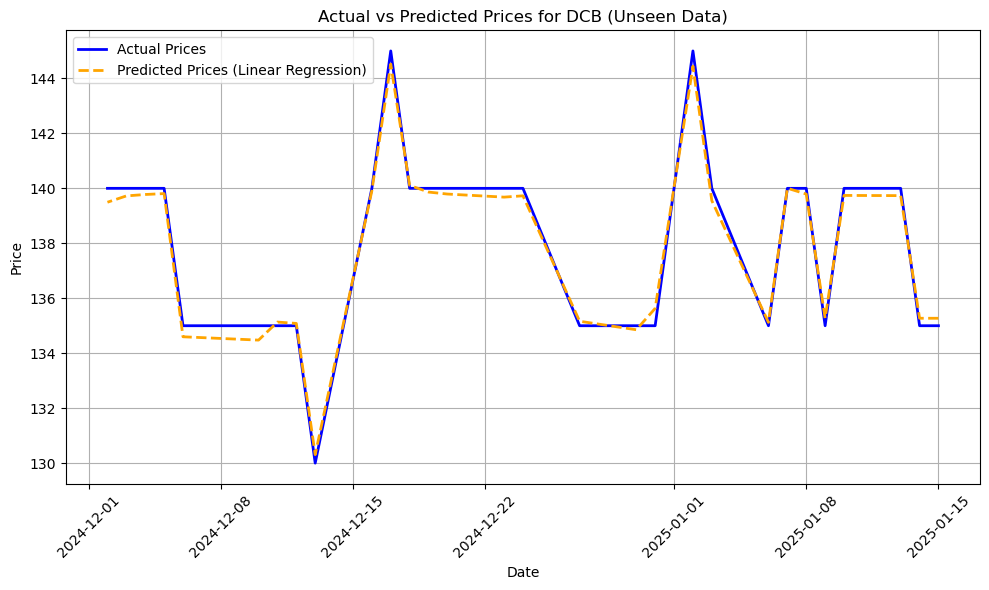


Training models for MBP...
Linear Regression: CV MSE = 0.3774, CV RMSE = 0.6144, CV R² = 0.7793
Ridge Regression: CV MSE = 2.7515, CV RMSE = 1.6588, CV R² = 0.7157
Lasso Regression: CV MSE = 17.9322, CV RMSE = 4.2346, CV R² = 0.6391
Elastic Net: CV MSE = 34.7415, CV RMSE = 5.8942, CV R² = 0.0202
Decision Tree: CV MSE = 132.4194, CV RMSE = 11.5074, CV R² = -2.5951
Random Forest: CV MSE = 63.8378, CV RMSE = 7.9899, CV R² = -0.5487
Gradient Boosting: CV MSE = 53.5650, CV RMSE = 7.3188, CV R² = -0.6399
KNN: CV MSE = 54.8323, CV RMSE = 7.4049, CV R² = -1.6905
SVM: CV MSE = 246.0514, CV RMSE = 15.6860, CV R² = -5.6384
AdaBoost: CV MSE = 83.4729, CV RMSE = 9.1363, CV R² = -0.3914
CatBoost: CV MSE = 65.9094, CV RMSE = 8.1185, CV R² = -1.0242
Best model for MBP: Linear Regression with CV MSE = 0.3774

Predicting for unseen stock data for MBP...
Unseen data for MBP: MSE = 1.3199, RMSE = 1.1489, R² = 0.9913


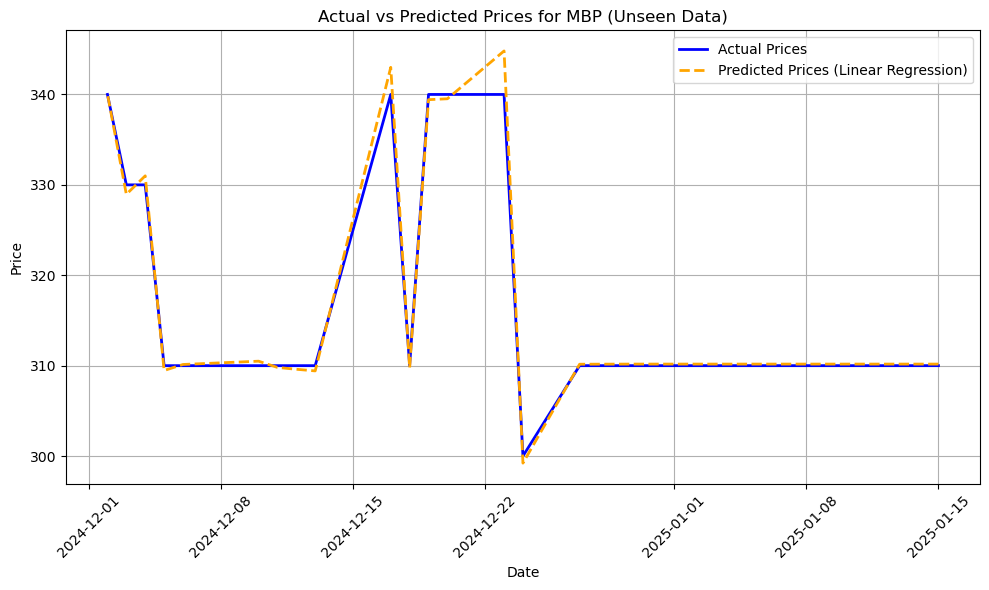


Training models for MCB...
Linear Regression: CV MSE = 0.0818, CV RMSE = 0.2860, CV R² = 0.9980
Ridge Regression: CV MSE = 0.4437, CV RMSE = 0.6661, CV R² = 0.9932
Lasso Regression: CV MSE = 25.2525, CV RMSE = 5.0252, CV R² = 0.6795
Elastic Net: CV MSE = 24.9309, CV RMSE = 4.9931, CV R² = 0.5805
Decision Tree: CV MSE = 35.3655, CV RMSE = 5.9469, CV R² = 0.4558
Random Forest: CV MSE = 28.9460, CV RMSE = 5.3802, CV R² = 0.5412
Gradient Boosting: CV MSE = 23.5395, CV RMSE = 4.8517, CV R² = 0.6463
KNN: CV MSE = 27.4737, CV RMSE = 5.2415, CV R² = 0.4429
SVM: CV MSE = 39.6295, CV RMSE = 6.2952, CV R² = 0.2413
AdaBoost: CV MSE = 26.8342, CV RMSE = 5.1802, CV R² = 0.5226
CatBoost: CV MSE = 28.2484, CV RMSE = 5.3149, CV R² = 0.5960
Best model for MCB: Linear Regression with CV MSE = 0.0818

Predicting for unseen stock data for MCB...
Unseen data for MCB: MSE = 0.1365, RMSE = 0.3695, R² = 0.9962


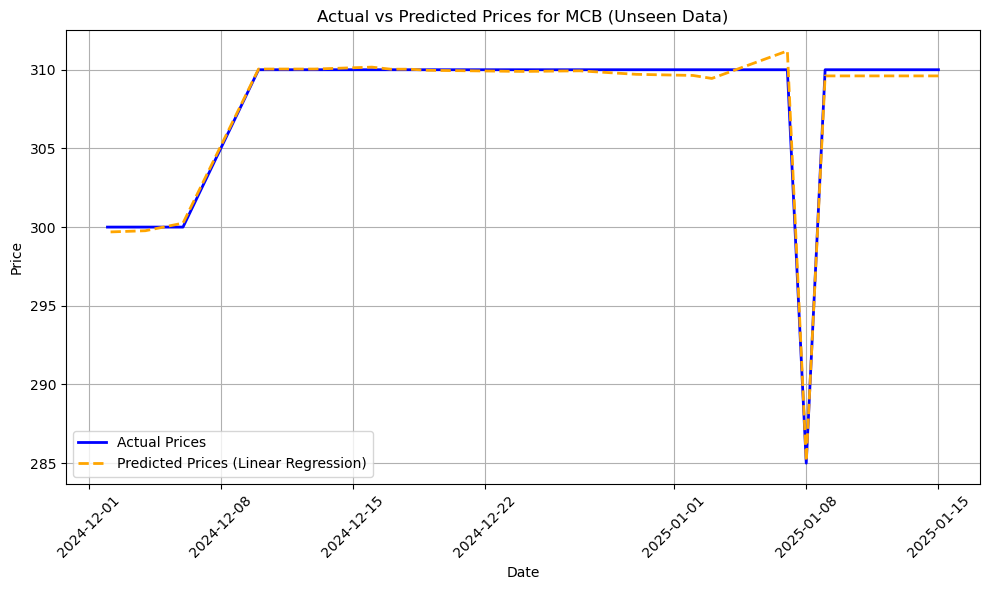


Training models for NICO...
Linear Regression: CV MSE = 18.3103, CV RMSE = 4.2791, CV R² = 0.9831
Ridge Regression: CV MSE = 43.8732, CV RMSE = 6.6237, CV R² = 0.9686
Lasso Regression: CV MSE = 25.9959, CV RMSE = 5.0986, CV R² = 0.9757
Elastic Net: CV MSE = 415.2630, CV RMSE = 20.3780, CV R² = 0.7419
Decision Tree: CV MSE = 3322.2917, CV RMSE = 57.6393, CV R² = -1.5389
Random Forest: CV MSE = 2021.6858, CV RMSE = 44.9632, CV R² = -0.4059
Gradient Boosting: CV MSE = 2218.9502, CV RMSE = 47.1057, CV R² = -0.7017
KNN: CV MSE = 2732.4417, CV RMSE = 52.2728, CV R² = -0.9101
SVM: CV MSE = 15397.6335, CV RMSE = 124.0872, CV R² = -10.3686
AdaBoost: CV MSE = 2742.9582, CV RMSE = 52.3733, CV R² = -1.0234
CatBoost: CV MSE = 2151.3529, CV RMSE = 46.3827, CV R² = -0.4370
Best model for NICO: Linear Regression with CV MSE = 18.3103

Predicting for unseen stock data for NICO...
Unseen data for NICO: MSE = 5.0710, RMSE = 2.2519, R² = 0.9804


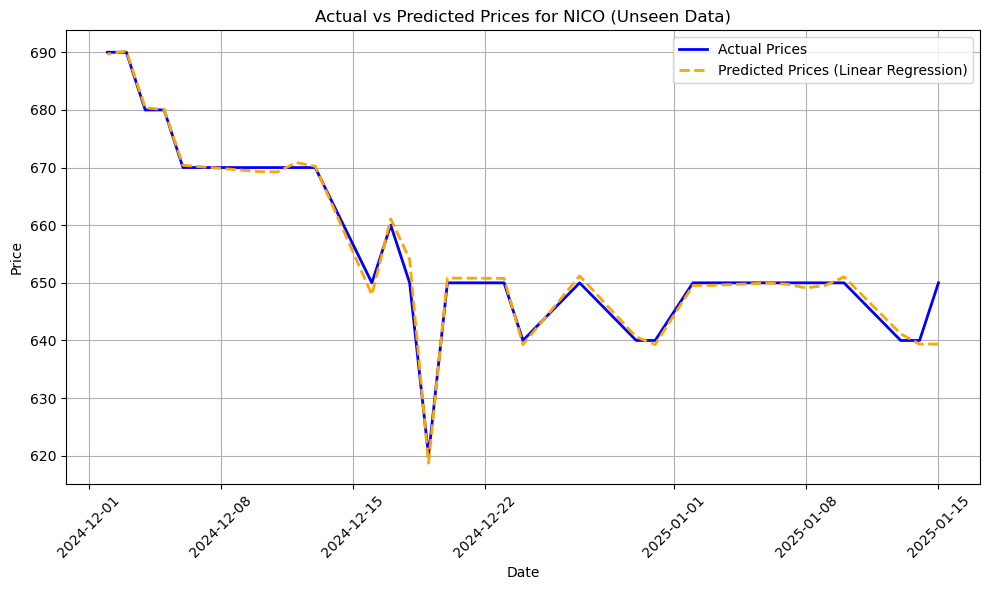


Training models for NMB...
Linear Regression: CV MSE = 38.1359, CV RMSE = 6.1754, CV R² = 0.9930
Ridge Regression: CV MSE = 277.2293, CV RMSE = 16.6502, CV R² = 0.9740
Lasso Regression: CV MSE = 49.6646, CV RMSE = 7.0473, CV R² = 0.9924
Elastic Net: CV MSE = 3574.3888, CV RMSE = 59.7862, CV R² = 0.6032
Decision Tree: CV MSE = 7833.2568, CV RMSE = 88.5057, CV R² = -0.0748
Random Forest: CV MSE = 6408.5935, CV RMSE = 80.0537, CV R² = 0.1787
Gradient Boosting: CV MSE = 5871.3198, CV RMSE = 76.6245, CV R² = -0.1710
KNN: CV MSE = 18202.2463, CV RMSE = 134.9157, CV R² = -2.7282
SVM: CV MSE = 252786.6338, CV RMSE = 502.7789, CV R² = -57.8480
AdaBoost: CV MSE = 10986.1133, CV RMSE = 104.8147, CV R² = -0.7598
CatBoost: CV MSE = 8976.2464, CV RMSE = 94.7431, CV R² = -0.1810
Best model for NMB: Linear Regression with CV MSE = 38.1359

Predicting for unseen stock data for NMB...
Unseen data for NMB: MSE = 15.5930, RMSE = 3.9488, R² = 0.9964


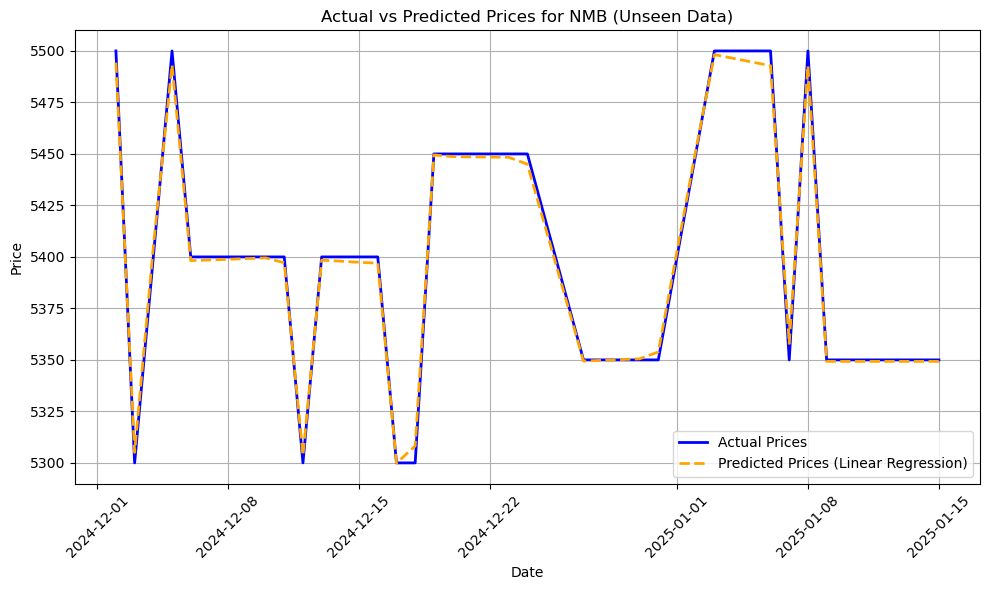


Training models for SWIS...
Linear Regression: CV MSE = 19.4537, CV RMSE = 4.4106, CV R² = 0.9908
Ridge Regression: CV MSE = 57.9293, CV RMSE = 7.6111, CV R² = 0.9779
Lasso Regression: CV MSE = 28.0846, CV RMSE = 5.2995, CV R² = 0.9900
Elastic Net: CV MSE = 1027.3989, CV RMSE = 32.0531, CV R² = 0.6929
Decision Tree: CV MSE = 6416.0000, CV RMSE = 80.0999, CV R² = -1.3716
Random Forest: CV MSE = 2407.7517, CV RMSE = 49.0688, CV R² = 0.2720
Gradient Boosting: CV MSE = 2702.1430, CV RMSE = 51.9821, CV R² = 0.2221
KNN: CV MSE = 2580.9219, CV RMSE = 50.8028, CV R² = 0.2141
SVM: CV MSE = 13081.9914, CV RMSE = 114.3765, CV R² = -5.2710
AdaBoost: CV MSE = 2913.2190, CV RMSE = 53.9742, CV R² = 0.1016
CatBoost: CV MSE = 2727.2784, CV RMSE = 52.2234, CV R² = 0.3031
Best model for SWIS: Linear Regression with CV MSE = 19.4537

Predicting for unseen stock data for SWIS...
Unseen data for SWIS: MSE = 8.8659, RMSE = 2.9776, R² = 0.9985


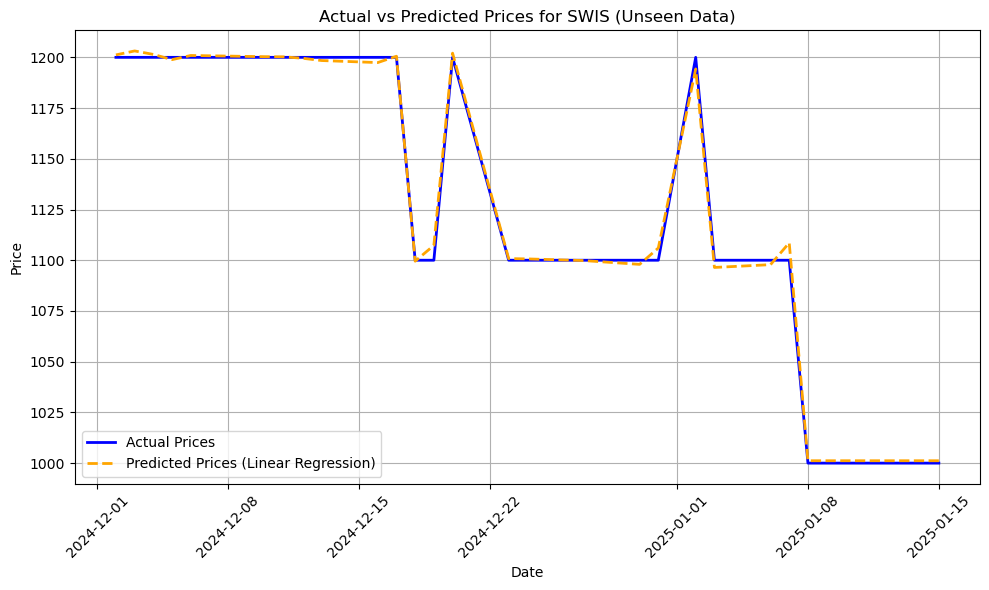


Training models for TCCL...
Linear Regression: CV MSE = 124.3020, CV RMSE = 11.1491, CV R² = 0.9914
Ridge Regression: CV MSE = 280.8088, CV RMSE = 16.7573, CV R² = 0.9794
Lasso Regression: CV MSE = 126.4094, CV RMSE = 11.2432, CV R² = 0.9925
Elastic Net: CV MSE = 4301.7543, CV RMSE = 65.5878, CV R² = 0.6589
Decision Tree: CV MSE = 19604.7795, CV RMSE = 140.0171, CV R² = -0.4916
Random Forest: CV MSE = 13152.2931, CV RMSE = 114.6834, CV R² = 0.0601
Gradient Boosting: CV MSE = 10405.0269, CV RMSE = 102.0050, CV R² = 0.2392
KNN: CV MSE = 9173.2848, CV RMSE = 95.7773, CV R² = 0.2046
SVM: CV MSE = 72237.5749, CV RMSE = 268.7705, CV R² = -3.3626
AdaBoost: CV MSE = 14110.6913, CV RMSE = 118.7884, CV R² = -0.0350
CatBoost: CV MSE = 12603.7741, CV RMSE = 112.2665, CV R² = 0.1446
Best model for TCCL: Linear Regression with CV MSE = 124.3020

Predicting for unseen stock data for TCCL...
Unseen data for TCCL: MSE = 15.6419, RMSE = 3.9550, R² = 0.9953


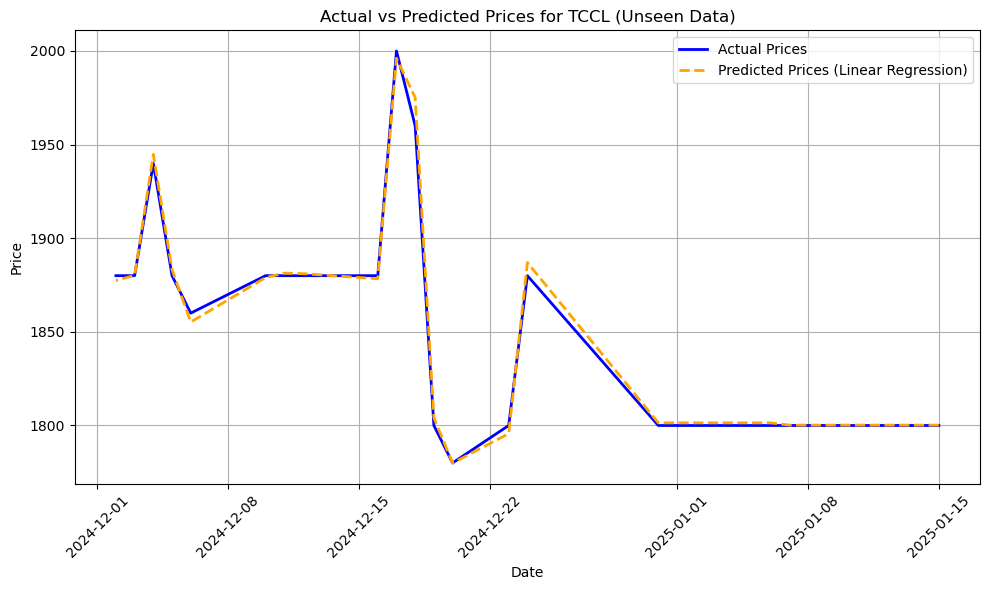


Training models for TPCC...
Linear Regression: CV MSE = 59.0847, CV RMSE = 7.6867, CV R² = 0.9916
Ridge Regression: CV MSE = 168.6843, CV RMSE = 12.9879, CV R² = 0.9773
Lasso Regression: CV MSE = 68.5778, CV RMSE = 8.2812, CV R² = 0.9897
Elastic Net: CV MSE = 2487.8368, CV RMSE = 49.8782, CV R² = 0.6441
Decision Tree: CV MSE = 9175.8002, CV RMSE = 95.7904, CV R² = -0.0864
Random Forest: CV MSE = 6343.6124, CV RMSE = 79.6468, CV R² = 0.1536
Gradient Boosting: CV MSE = 5253.1009, CV RMSE = 72.4783, CV R² = 0.3290
KNN: CV MSE = 15111.8801, CV RMSE = 122.9304, CV R² = -1.0429
SVM: CV MSE = 116771.6538, CV RMSE = 341.7187, CV R² = -15.5016
AdaBoost: CV MSE = 7023.4146, CV RMSE = 83.8058, CV R² = 0.0793
CatBoost: CV MSE = 8108.1903, CV RMSE = 90.0455, CV R² = -0.1271
Best model for TPCC: Linear Regression with CV MSE = 59.0847

Predicting for unseen stock data for TPCC...
Unseen data for TPCC: MSE = 1281.0484, RMSE = 35.7917, R² = 0.9639


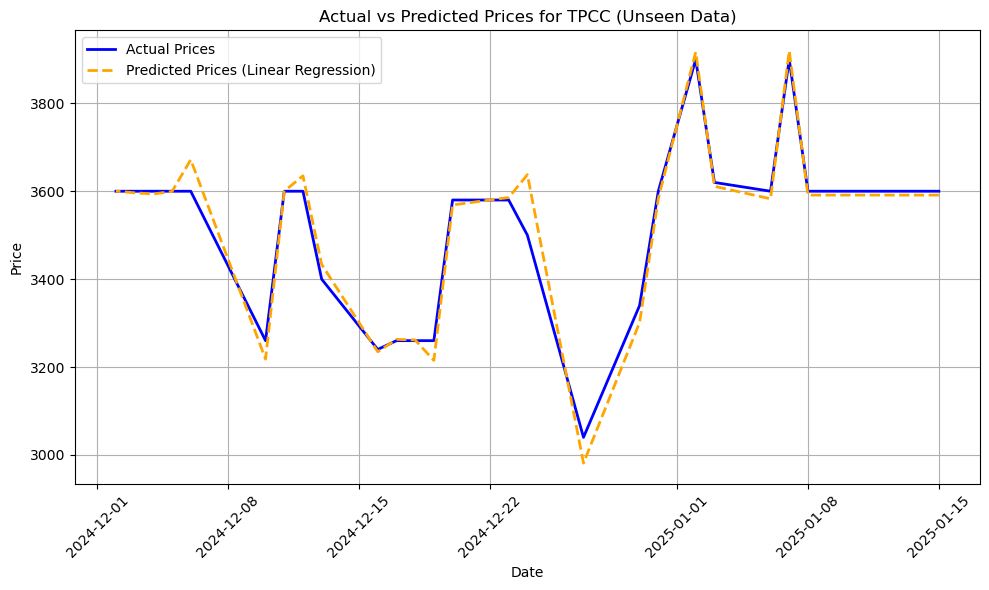


Training models for TCC...
Linear Regression: CV MSE = 9819.6530, CV RMSE = 99.0942, CV R² = 0.5525
Ridge Regression: CV MSE = 7351.6971, CV RMSE = 85.7420, CV R² = 0.5535
Lasso Regression: CV MSE = 7186.0170, CV RMSE = 84.7704, CV R² = 0.5545
Elastic Net: CV MSE = 38466.2795, CV RMSE = 196.1282, CV R² = 0.3589
Decision Tree: CV MSE = 108800.0000, CV RMSE = 329.8485, CV R² = 0.1651
Random Forest: CV MSE = 70882.3584, CV RMSE = 266.2374, CV R² = 0.3457
Gradient Boosting: CV MSE = 91174.0223, CV RMSE = 301.9504, CV R² = 0.0022
KNN: CV MSE = 25856.0000, CV RMSE = 160.7980, CV R² = 0.6487
SVM: CV MSE = 242932.8732, CV RMSE = 492.8822, CV R² = -1.1306
AdaBoost: CV MSE = 53308.0967, CV RMSE = 230.8855, CV R² = 0.6539
CatBoost: CV MSE = 46239.1977, CV RMSE = 215.0330, CV R² = 0.3044
Best model for TCC: Lasso Regression with CV MSE = 7186.0170

Predicting for unseen stock data for TCC...
Unseen data for TCC: MSE = 11868227.5374, RMSE = 3445.0294, R² = -1.9611


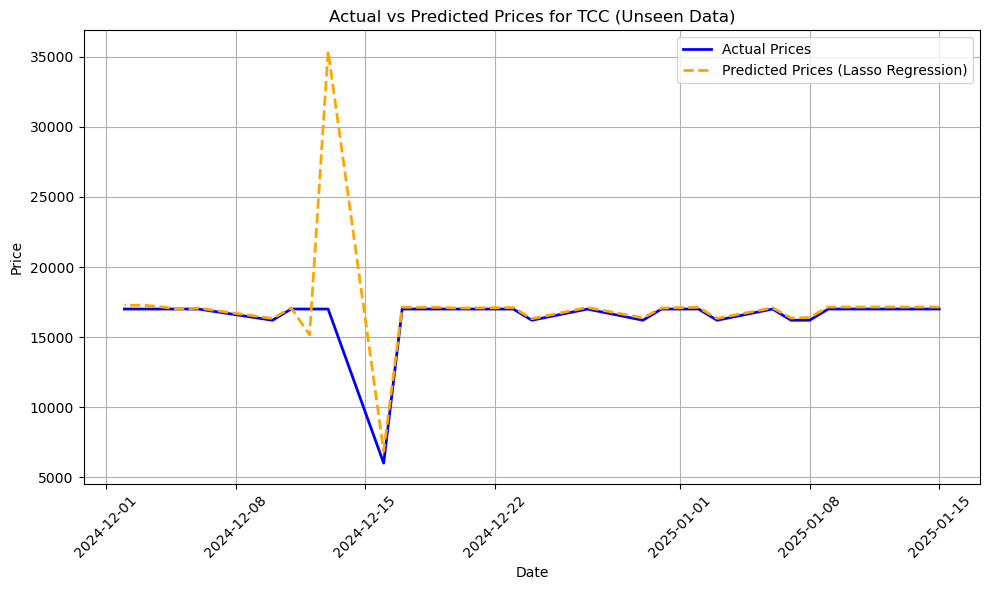


Training models for TTP...
Linear Regression: CV MSE = 0.2674, CV RMSE = 0.5171, CV R² = 0.9833
Ridge Regression: CV MSE = 0.3870, CV RMSE = 0.6221, CV R² = 0.9823
Lasso Regression: CV MSE = 7.6619, CV RMSE = 2.7680, CV R² = 0.6186
Elastic Net: CV MSE = 15.4009, CV RMSE = 3.9244, CV R² = 0.2359
Decision Tree: CV MSE = 26.7292, CV RMSE = 5.1700, CV R² = -0.4709
Random Forest: CV MSE = 24.3191, CV RMSE = 4.9314, CV R² = -0.2345
Gradient Boosting: CV MSE = 19.2457, CV RMSE = 4.3870, CV R² = 0.0696
KNN: CV MSE = 23.8417, CV RMSE = 4.8828, CV R² = -0.1905
SVM: CV MSE = 43.7309, CV RMSE = 6.6129, CV R² = -1.2268
AdaBoost: CV MSE = 24.3321, CV RMSE = 4.9328, CV R² = -0.1241
CatBoost: CV MSE = 24.2681, CV RMSE = 4.9263, CV R² = -0.2295
Best model for TTP: Linear Regression with CV MSE = 0.2674

Predicting for unseen stock data for TTP...
Unseen data for TTP is empty after dropping NaN values. Skipping...

Training models for TBL...
Linear Regression: CV MSE = 21.5421, CV RMSE = 4.6414, CV R² 

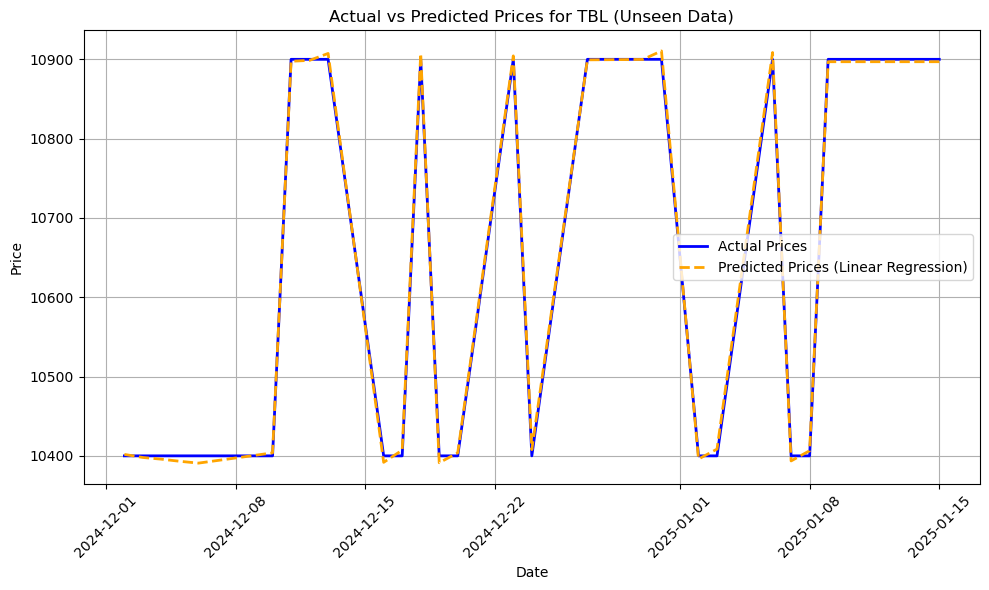


Training models for TOL...
Linear Regression: CV MSE = 1.9668, CV RMSE = 1.4024, CV R² = 0.9587
Ridge Regression: CV MSE = 9.8404, CV RMSE = 3.1369, CV R² = 0.8294
Lasso Regression: CV MSE = 32.1382, CV RMSE = 5.6691, CV R² = 0.8301
Elastic Net: CV MSE = 168.8322, CV RMSE = 12.9935, CV R² = -0.5803
Decision Tree: CV MSE = 169.3333, CV RMSE = 13.0128, CV R² = -0.7902
Random Forest: CV MSE = 154.3652, CV RMSE = 12.4244, CV R² = -0.5133
Gradient Boosting: CV MSE = 123.0614, CV RMSE = 11.0933, CV R² = 0.3542
KNN: CV MSE = 281.1200, CV RMSE = 16.7666, CV R² = -0.4610
SVM: CV MSE = 528.0675, CV RMSE = 22.9797, CV R² = -8.1365
AdaBoost: CV MSE = 188.9372, CV RMSE = 13.7454, CV R² = -0.0032
CatBoost: CV MSE = 218.1969, CV RMSE = 14.7715, CV R² = -0.4013
Best model for TOL: Linear Regression with CV MSE = 1.9668

Predicting for unseen stock data for TOL...
Unseen data for TOL is empty after dropping NaN values. Skipping...

Model training, evaluation, and prediction for unseen data completed.


In [22]:
# Initialize dictionaries to store results and predictions
model_results = {}
predictions = {}

# Iterate over each stock's data
for stock in all_stock_data:
    print(f"\nTraining models for {stock}...")

    # Prepare data for model training
    df = all_stock_data[stock]

    # Drop rows with missing values
    df = df.dropna()

    # Check if the dataframe is empty after dropping NaN values
    if df.empty:
        print(f"Data for {stock} is empty after dropping NaN values. Skipping...")
        continue

    # Check if sufficient data exists
    if len(df) < 10:  # Arbitrary threshold to ensure sufficient data
        print(f"Not enough data for {stock}. Skipping...")
        continue

    # Prepare features and target
    X = df.drop(columns=['Price', 'Date'])  # Features
    y = df['Price']  # Target variable

    # Ensure there are features remaining after dropping NaN values
    if X.empty:
        print(f"No features available for {stock}. Skipping...")
        continue

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Initialize models
    models = {
        'Linear Regression': LinearRegression(),
        'Ridge Regression': Ridge(random_state=42),
        'Lasso Regression': Lasso(random_state=42),
        'Elastic Net': ElasticNet(random_state=42),
        'Decision Tree': DecisionTreeRegressor(random_state=42),
        'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100),
        'Gradient Boosting': GradientBoostingRegressor(random_state=42, n_estimators=100),
        'KNN': KNeighborsRegressor(),
        'SVM': SVR(),
        'AdaBoost': AdaBoostRegressor(random_state=42),
        'CatBoost': CatBoostRegressor(iterations=100, learning_rate=0.1, depth=6, silent=True),
    }

    # Train and evaluate each model
    stock_results = {}
    stock_predictions = {}  # To store predictions for each model
    best_model_name = None
    best_model_mse = np.inf  # Start with a very high MSE (since lower is better)

    for model_name, model in models.items():
        try:
            # Cross-validation for MSE (scoring='neg_mean_squared_error')
            cv_mse_scores = -cross_val_score(model, X_scaled, y, cv=5, scoring='neg_mean_squared_error')

            # Calculate the average CV MSE for this model
            avg_cv_mse = cv_mse_scores.mean()
            # Cross-validation for R² (scoring='r2')
            cv_r2_scores = cross_val_score(model, X_scaled, y, cv=5, scoring='r2')
            avg_cv_r2 = cv_r2_scores.mean()

            # Fit the model on the entire dataset
            model.fit(X_scaled, y)

            # Generate predictions
            avg_cv_rmse = np.sqrt(avg_cv_mse)

            y_pred = model.predict(X_scaled)
            stock_predictions[model_name] = y_pred

            # Store results
            stock_results[model_name] = {
                'MSE (CV)': avg_cv_mse,
                'RMSE (CV)': avg_cv_rmse,
                'R² (CV)': avg_cv_r2,
            }

            print(f"{model_name}: CV MSE = {avg_cv_mse:.4f}, CV RMSE = {avg_cv_rmse:.4f}, CV R² = {avg_cv_r2:.4f}")

            # Update best model based on lowest CV MSE
            if avg_cv_mse < best_model_mse:
                best_model_mse = avg_cv_mse
                best_model_name = model_name

        except Exception as e:
            print(f"Error training {model_name} for {stock}: {e}")

    # Save results and predictions for this stock
    if stock_results:
        model_results[stock] = stock_results
        predictions[stock] = stock_predictions
        print(f"Best model for {stock}: {best_model_name} with CV MSE = {best_model_mse:.4f}")
    else:
        print(f"No valid models for {stock}. Skipping...")

    # For unseen data, apply the best model and display metrics
    if 'unseen_stock_data' in locals() and stock in unseen_stock_data:
        print(f"\nPredicting for unseen stock data for {stock}...")

        # Prepare unseen data (ensure same features as training data)
        unseen_df = unseen_stock_data[stock]
        unseen_df = unseen_df.dropna()

        if unseen_df.empty:
            print(f"Unseen data for {stock} is empty after dropping NaN values. Skipping...")
            continue

        X_unseen = unseen_df.drop(columns=['Price', 'Date'])
        if X_unseen.empty:
            print(f"No features available for unseen data of {stock}. Skipping...")
            continue

        X_unseen_scaled = scaler.transform(X_unseen)  # Use the same scaler fitted on training data

        # Get predictions using the best model
        best_model = models[best_model_name]
        y_unseen_pred = best_model.predict(X_unseen_scaled)

        # Display metrics for unseen data
        mse_unseen = mean_squared_error(unseen_df['Price'], y_unseen_pred)
        rmse_unseen = np.sqrt(mse_unseen)
        r2_unseen = r2_score(unseen_df['Price'], y_unseen_pred)

        print(f"Unseen data for {stock}: MSE = {mse_unseen:.4f}, RMSE = {rmse_unseen:.4f}, R² = {r2_unseen:.4f}")

        # Save predictions for unseen data
        predictions[stock]['Unseen'] = y_unseen_pred

        # Plot actual vs predicted prices for unseen data
        plt.figure(figsize=(10, 6))
        plt.plot(unseen_df['Date'], unseen_df['Price'], label='Actual Prices', color='blue', linewidth=2)
        plt.plot(unseen_df['Date'], y_unseen_pred, label=f'Predicted Prices ({best_model_name})', color='orange', linestyle='--', linewidth=2)
        plt.title(f'Actual vs Predicted Prices for {stock} (Unseen Data)')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate date labels for better readability
        plt.tight_layout()
        plt.show()

# Display overall results
print("\nModel training, evaluation, and prediction for unseen data completed.")
